#  <center> Speech Emotion Recognition <center>

### I am going to build a speech emotion detection classifier.
### But first we need to learn about what is speech recognition (SER) and why are we building this project? Well, few of the reasons are-

#### First, lets define SER i.e. Speech Emotion Recognition.
* Speech Emotion Recognition, abbreviated as SER, is the act of attempting to recognize human emotion and affective states from speech. This is capitalizing on the fact that voice often reflects underlying emotion through tone and pitch. This is also the phenomenon that animals like dogs and horses employ to be able to understand human emotion.

#### Why we need it?

1. Emotion recognition is the part of speech recognition which is gaining more popularity and need for it increases enormously. Although there are methods to recognize emotion using machine learning techniques, this project attempts to use deep learning to recognize the emotions from data.

2. SER(Speech Emotion Recognition) is used in call center for classifying calls according to emotions and can be used as the performance parameter for conversational analysis thus identifying the unsatisfied customer, customer satisfaction and so on.. for helping companies improving their services

3. It can also be used in-car board system based on information of the mental state of the driver can be provided to the system to initiate his/her safety preventing accidents to happen

#### Datasets used in this project

* Crowd-sourced Emotional Mutimodal Actors Dataset (Crema-D)
* Ryerson Audio-Visual Database of Emotional Speech and Song (Ravdess)
* Surrey Audio-Visual Expressed Emotion (Savee)
* Toronto emotional speech set (Tess)

# Importing Libraries

In [1]:
import pandas as pd
import numpy as np

import os
import sys

# librosa is a Python library for analyzing audio and music. It can be used to extract the data from the audio files we will see it later.
import librosa
import librosa.display
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

# to play the audio files
from IPython.display import Audio

import keras
from keras.callbacks import ReduceLROnPlateau
from keras.models import Sequential
from keras.layers import Dense, Conv1D, MaxPooling1D, Flatten, Dropout, BatchNormalization
from keras.utils import to_categorical
from keras.callbacks import ModelCheckpoint

import warnings
if not sys.warnoptions:
    warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning) 

## Data Preparation
* As we are working with four different datasets, so i will be creating a dataframe storing all emotions of the data in dataframe with their paths.
* We will use this dataframe to extract features for our model training.

In [2]:
# Paths for data.
Ravdess = "D:\\files\\Semester\\VIth sem\\termpaper\\dataset\\ravdess\\audio_speech_actors_01-24\\"
Crema = "D:\\files\\Semester\\VIth sem\\termpaper\\dataset\\crema\\AudioWAV\\"
Tess = "D:\\files\\Semester\\VIth sem\\termpaper\\dataset\\tess\\TESS Toronto emotional speech set data\\"
Savee = "D:\\files\\Semester\\VIth sem\\termpaper\\dataset\\savee\\ALL\\"

##  <center> 1. Ravdess Dataframe <center>
Here is the filename identifiers as per the official RAVDESS website:

* Modality (01 = full-AV, 02 = video-only, 03 = audio-only).
* Vocal channel (01 = speech, 02 = song).
* Emotion (01 = neutral, 02 = calm, 03 = happy, 04 = sad, 05 = angry, 06 = fearful, 07 = disgust, 08 = surprised).
* Emotional intensity (01 = normal, 02 = strong). NOTE: There is no strong intensity for the 'neutral' emotion.
* Statement (01 = "Kids are talking by the door", 02 = "Dogs are sitting by the door").
* Repetition (01 = 1st repetition, 02 = 2nd repetition).
* Actor (01 to 24. Odd numbered actors are male, even numbered actors are female).

So, here's an example of an audio filename. 02-01-06-01-02-01-12.mp4
This means the meta data for the audio file is:

* Video-only (02)
* Speech (01)
* Fearful (06)
* Normal intensity (01)
* Statement "dogs" (02)
* 1st Repetition (01)
* 12th Actor (12) - Female (as the actor ID number is even)

In [3]:
ravdess_directory_list = os.listdir(Ravdess)

file_emotion = []
file_path = []
for dir in ravdess_directory_list:
    # as their are 20 different actors in our previous directory we need to extract files for each actor.
    actor = os.listdir(Ravdess + dir)
    for file in actor:
        part = file.split('.')[0]
        part = part.split('-')
        # third part in each file represents the emotion associated to that file.
        file_emotion.append(int(part[2]))
        file_path.append(Ravdess + dir + '/' + file)
        
# dataframe for emotion of files
emotion_df = pd.DataFrame(file_emotion, columns=['Emotions'])

# dataframe for path of files.
path_df = pd.DataFrame(file_path, columns=['Path'])
Ravdess_df = pd.concat([emotion_df, path_df], axis=1)

# changing integers to actual emotions.
Ravdess_df.Emotions.replace({1:'neutral', 2:'calm', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust', 8:'surprise'}, inplace=True)
Ravdess_df.head(10)

,Emotions,Path
0,neutral,D:\files\Semester\VIth sem\termpaper\dataset\r...
1,neutral,D:\files\Semester\VIth sem\termpaper\dataset\r...
2,neutral,D:\files\Semester\VIth sem\termpaper\dataset\r...
3,neutral,D:\files\Semester\VIth sem\termpaper\dataset\r...
4,calm,D:\files\Semester\VIth sem\termpaper\dataset\r...
5,calm,D:\files\Semester\VIth sem\termpaper\dataset\r...
6,calm,D:\files\Semester\VIth sem\termpaper\dataset\r...
7,calm,D:\files\Semester\VIth sem\termpaper\dataset\r...
8,calm,D:\files\Semester\VIth sem\termpaper\dataset\r...
9,calm,D:\files\Semester\VIth sem\termpaper\dataset\r...


## <center>2. Crema DataFrame</center>

In [4]:
crema_directory_list = os.listdir(Crema)

file_emotion = []
file_path = []

for file in crema_directory_list:
    # storing file paths
    file_path.append(Crema + file)
    # storing file emotions
    part=file.split('_')
    if part[2] == 'SAD':
        file_emotion.append('sad')
    elif part[2] == 'ANG':
        file_emotion.append('angry')
    elif part[2] == 'DIS':
        file_emotion.append('disgust')
    elif part[2] == 'FEA':
        file_emotion.append('fear')
    elif part[2] == 'HAP':
        file_emotion.append('happy')
    elif part[2] == 'NEU':
        file_emotion.append('neutral')
    else:
        file_emotion.append('Unknown')
        
# dataframe for emotion of files
emotion_df = pd.DataFrame(file_emotion, columns=['Emotions'])

# dataframe for path of files.
path_df = pd.DataFrame(file_path, columns=['Path'])
Crema_df = pd.concat([emotion_df, path_df], axis=1)
Crema_df.head()

,Emotions,Path
0,angry,D:\files\Semester\VIth sem\termpaper\dataset\c...
1,disgust,D:\files\Semester\VIth sem\termpaper\dataset\c...
2,fear,D:\files\Semester\VIth sem\termpaper\dataset\c...
3,happy,D:\files\Semester\VIth sem\termpaper\dataset\c...
4,neutral,D:\files\Semester\VIth sem\termpaper\dataset\c...


##  <center> 3. TESS dataset <center>

In [5]:
tess_directory_list = os.listdir(Tess)

file_emotion = []
file_path = []

for dir in tess_directory_list:
    directories = os.listdir(Tess + dir)
    for file in directories:
        part = file.split('.')[0]
        part = part.split('_')[-1]
        if part=='ps':
            file_emotion.append('surprise')
        else:
            file_emotion.append(part)
        file_path.append(Tess + dir + '/' + file)
        
# dataframe for emotion of files
emotion_df = pd.DataFrame(file_emotion, columns=['Emotions'])

# dataframe for path of files.
path_df = pd.DataFrame(file_path, columns=['Path'])
Tess_df = pd.concat([emotion_df, path_df], axis=1)
Tess_df.head()

,Emotions,Path
0,angry,D:\files\Semester\VIth sem\termpaper\dataset\t...
1,angry,D:\files\Semester\VIth sem\termpaper\dataset\t...
2,angry,D:\files\Semester\VIth sem\termpaper\dataset\t...
3,angry,D:\files\Semester\VIth sem\termpaper\dataset\t...
4,angry,D:\files\Semester\VIth sem\termpaper\dataset\t...


##  <center> 4. CREMA-D dataset <center>
The audio files in this dataset are named in such a way that the prefix letters describes the emotion classes as follows:

* 'a' = 'anger'
* 'd' = 'disgust'
* 'f' = 'fear'
* 'h' = 'happiness'
* 'n' = 'neutral'
* 'sa' = 'sadness'
* 'su' = 'surprise'

In [6]:
savee_directory_list = os.listdir(Savee)

file_emotion = []
file_path = []

for file in savee_directory_list:
    file_path.append(Savee + file)
    part = file.split('_')[1]
    ele = part[:-6]
    if ele=='a':
        file_emotion.append('angry')
    elif ele=='d':
        file_emotion.append('disgust')
    elif ele=='f':
        file_emotion.append('fear')
    elif ele=='h':
        file_emotion.append('happy')
    elif ele=='n':
        file_emotion.append('neutral')
    elif ele=='sa':
        file_emotion.append('sad')
    else:
        file_emotion.append('surprise')
        
# dataframe for emotion of files
emotion_df = pd.DataFrame(file_emotion, columns=['Emotions'])

# dataframe for path of files.
path_df = pd.DataFrame(file_path, columns=['Path'])
Savee_df = pd.concat([emotion_df, path_df], axis=1)
Savee_df.head()

,Emotions,Path
0,angry,D:\files\Semester\VIth sem\termpaper\dataset\s...
1,angry,D:\files\Semester\VIth sem\termpaper\dataset\s...
2,angry,D:\files\Semester\VIth sem\termpaper\dataset\s...
3,angry,D:\files\Semester\VIth sem\termpaper\dataset\s...
4,angry,D:\files\Semester\VIth sem\termpaper\dataset\s...


In [90]:
# creating Dataframe using all the 4 dataframes we created so far.
data_path = pd.concat([Ravdess_df, Crema_df, Savee_df,Tess_df], axis = 0)
data_path.to_csv("data_path.csv",index=False)
data_path.head()

,Emotions,Path
0,neutral,D:\files\Semester\VIth sem\termpaper\dataset\r...
1,neutral,D:\files\Semester\VIth sem\termpaper\dataset\r...
2,neutral,D:\files\Semester\VIth sem\termpaper\dataset\r...
3,neutral,D:\files\Semester\VIth sem\termpaper\dataset\r...
4,calm,D:\files\Semester\VIth sem\termpaper\dataset\r...


In [91]:
data_path.shape

(12176, 2)

## Data Visualisation and Exploration

First let's plot the count of each emotions in our dataset.

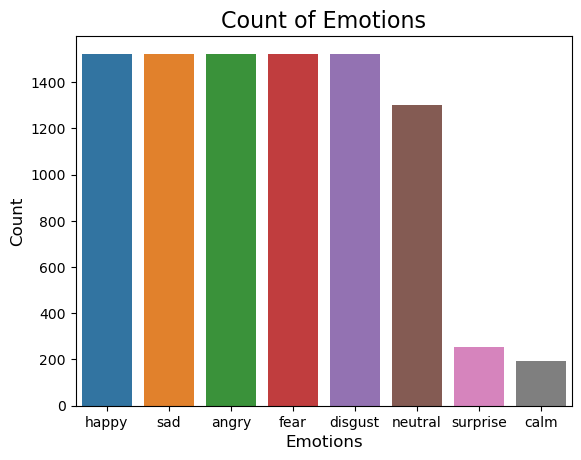

In [73]:
plt.title('Count of Emotions', size=16)
sns.barplot(x=data_path.Emotions.value_counts().index, y=data_path.Emotions.value_counts())
plt.ylabel('Count', size=12)
plt.xlabel('Emotions', size=12)
plt.show()

We can also plot waveplots and spectograms for audio signals

* Waveplots - Waveplots let us know the loudness of the audio at a given time.
* Spectograms - A spectrogram is a visual representation of the spectrum of frequencies of sound or other signals as they vary with time. It’s a representation of frequencies changing with respect to time for given audio/music signals.

In [74]:

def create_waveplot(data, sr, e):
    plt.figure(figsize=(10, 3))
    plt.title('Waveplot for audio with {} emotion'.format(e), size=15)
    librosa.display.waveplot(data, sr=sr)
    plt.show()

def create_spectrogram(data, sr, e):
    # stft function converts the data into short term fourier transform
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(12, 3))
    plt.title('Spectrogram for audio with {} emotion'.format(e), size=15)
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')   
    #librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar()


In [75]:
def create_waveplot(data, sr, e):
    plt.figure(figsize=(10, 3))
    plt.title('Waveplot for audio with {} emotion'.format(e), size=15)
    plt.plot(data)
    plt.xlabel('Sample')
    plt.ylabel('Amplitude')
    plt.show()
    
    

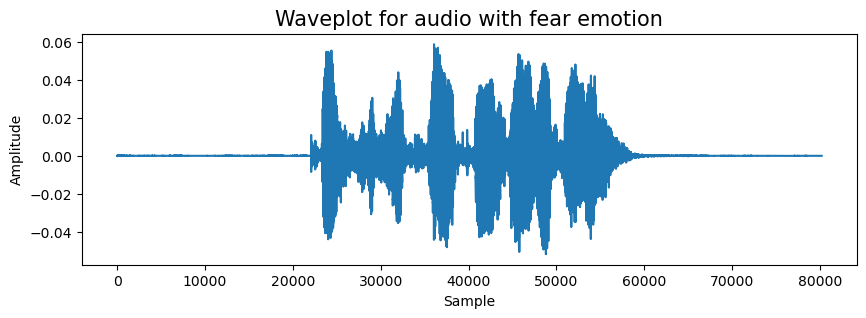

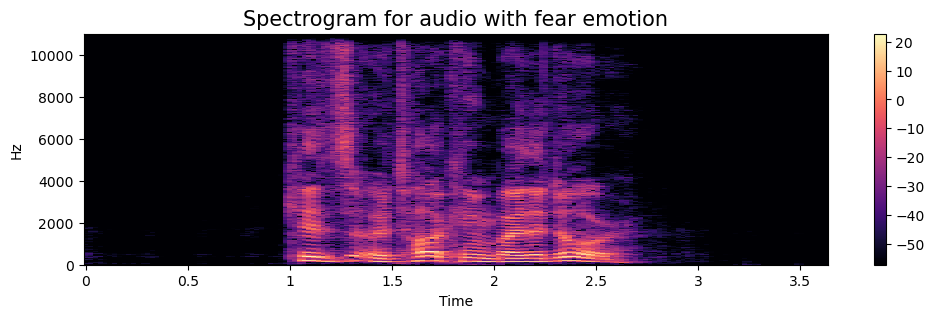

In [11]:
emotion='fear'
path = np.array(data_path.Path[data_path.Emotions==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

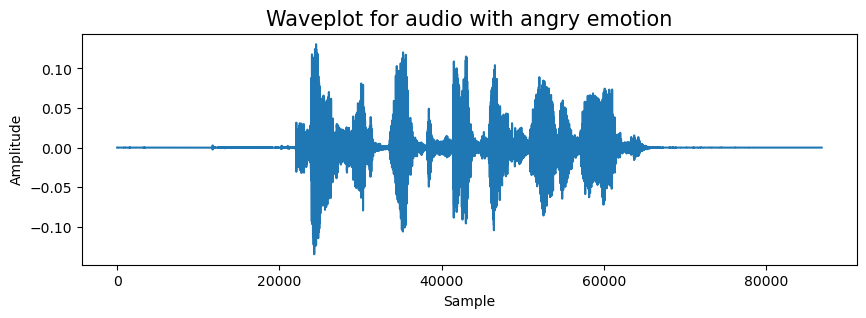

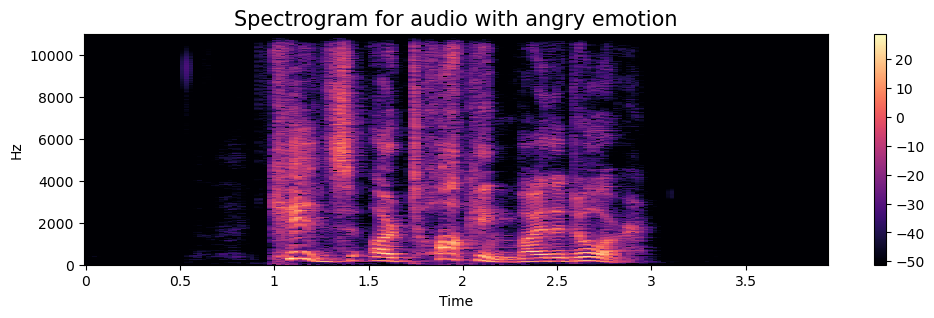

In [76]:
emotion='angry'
path = np.array(data_path.Path[data_path.Emotions==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

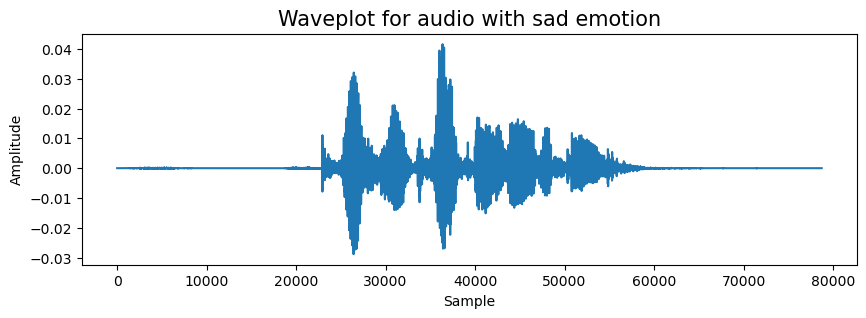

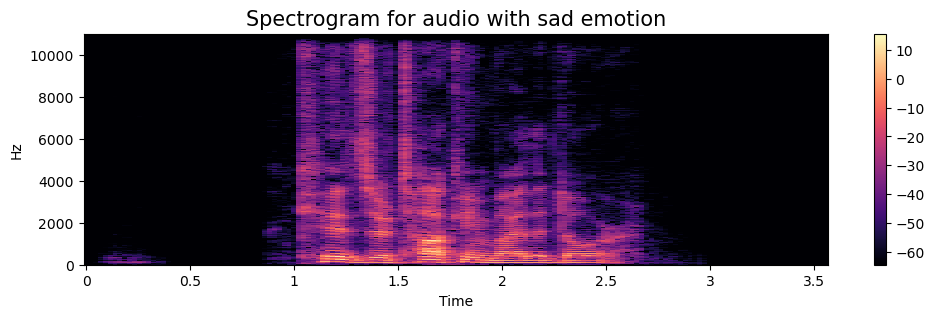

In [77]:
emotion='sad'
path = np.array(data_path.Path[data_path.Emotions==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

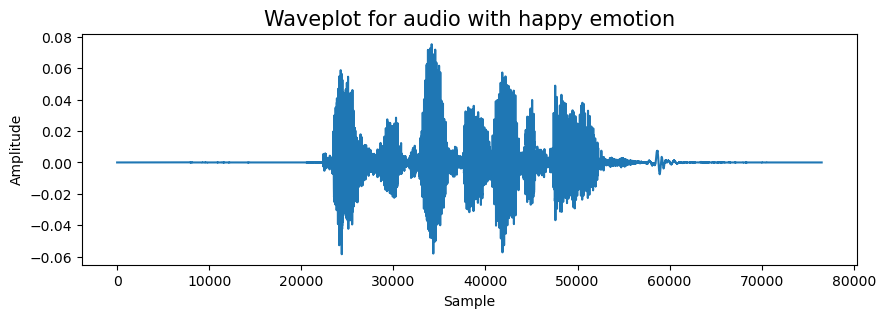

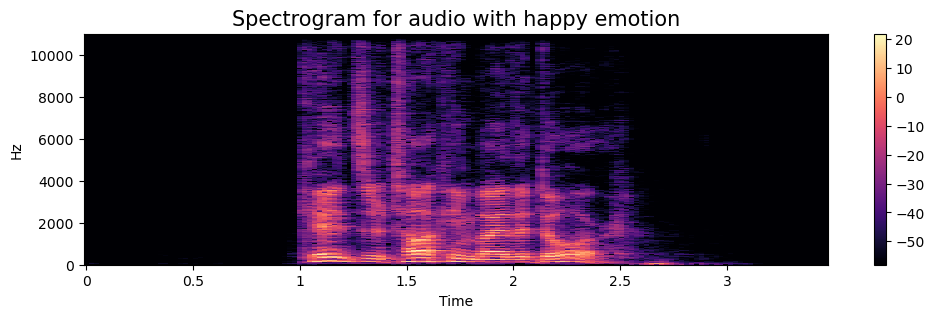

In [78]:
emotion='happy'
path = np.array(data_path.Path[data_path.Emotions==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

## Data Augmentation

- Data augmentation is the process by which we create new synthetic data samples by adding small perturbations on our initial training set.
- To generate syntactic data for audio, we can apply noise injection, shifting time, changing pitch and speed.
- The objective is to make our model invariant to those perturbations and enhace its ability to generalize.
- In order to this to work adding the perturbations must conserve the same label as the original training sample.
- In images data augmention can be performed by shifting the image, zooming, rotating ...

First, let's check which augmentation techniques works better for our dataset.

In [79]:
def noise(data):
    noise_amp = 0.035*np.random.uniform()*np.amax(data)
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data

def stretch(data, rate=0.8):
    return librosa.effects.time_stretch(data, rate)


def shift(data):
    shift_range = int(np.random.uniform(low=-5, high = 5)*1000)
    return np.roll(data, shift_range)

def pitch(data, sampling_rate, pitch_factor=0.7):
    return librosa.effects.pitch_shift(data, sampling_rate, n_steps=pitch_factor)


# taking any example and checking for techniques.
path = np.array(data_path.Path)[1]
data, sample_rate = librosa.load(path)

#### 1. Simple Audio

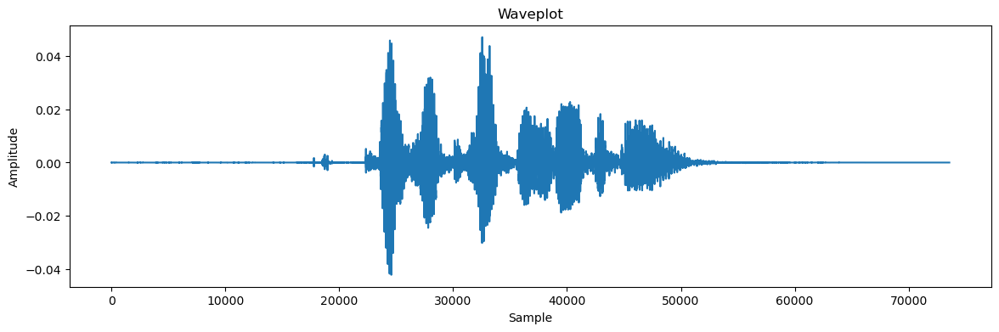

In [80]:
plt.figure(figsize=(14, 4))
plt.title('Waveplot')
plt.plot(data)
plt.xlabel('Sample')
plt.ylabel('Amplitude')
plt.show()

Audio(data, rate=sample_rate)

Audio(data, rate=sample_rate)

#### 2. Noise Injection

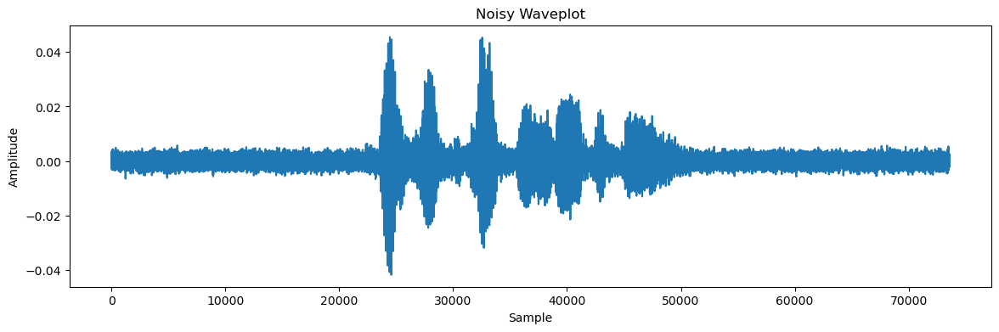

In [81]:
x = noise(data)
plt.figure(figsize=(14, 4))
plt.title('Noisy Waveplot')
plt.plot(x)
plt.xlabel('Sample')
plt.ylabel('Amplitude')
plt.show()

# Play the noisy audio
Audio(x, rate=sample_rate)

We can see noise injection is a very good augmentation technique because of which we can assure our training model is not overfitted

#### 3. Stretching

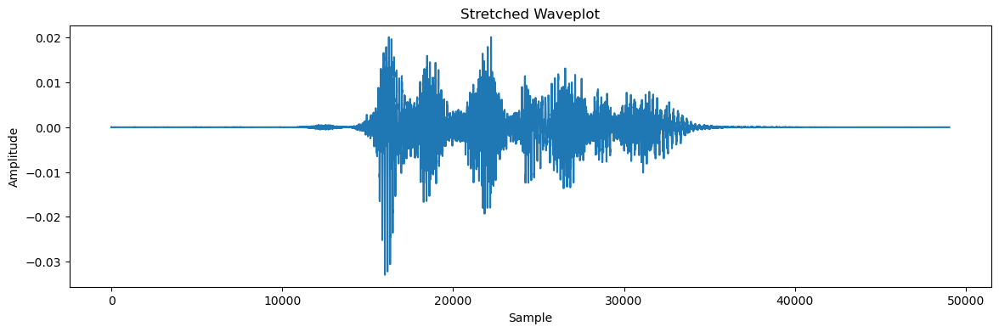

In [82]:
def stretch(data, rate=1.5):
    return librosa.effects.time_stretch(data, rate=rate)

# Stretch the audio data
x = stretch(data)

# Plot waveplot of stretched data
plt.figure(figsize=(14, 4))
plt.title('Stretched Waveplot')
plt.plot(x)
plt.xlabel('Sample')
plt.ylabel('Amplitude')
plt.show()

# Play the stretched audio
Audio(x, rate=sample_rate)

#### 4. Shifting

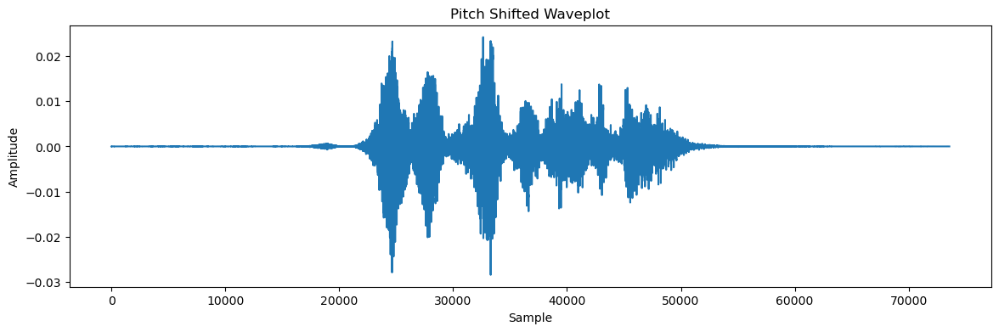

In [83]:
# Define a function to shift the pitch of audio data
def shift(data, sr, n_steps=2):
    return librosa.effects.pitch_shift(data, sr=sr, n_steps=n_steps)

# Shift the pitch of the audio data
x = shift(data, sr=sample_rate, n_steps=2)  # Adjust the number of steps as needed

# Plot waveplot of shifted data
plt.figure(figsize=(14, 4))
plt.title('Pitch Shifted Waveplot')
plt.plot(x)
plt.xlabel('Sample')
plt.ylabel('Amplitude')
plt.show()

# Play the shifted audio
Audio(x, rate=sample_rate)

#### 5. Pitch

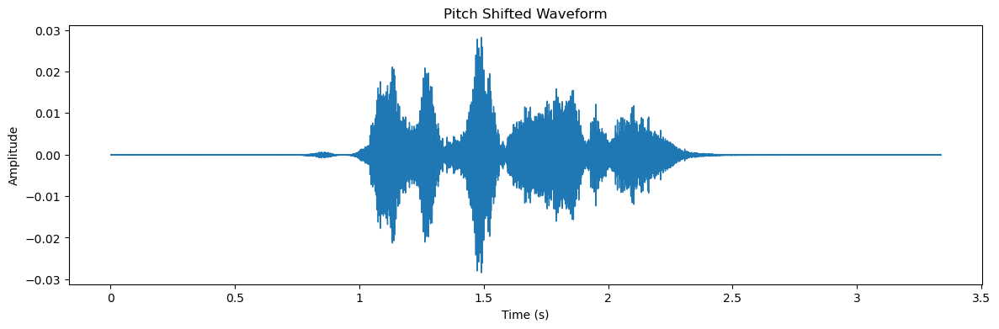

In [84]:
# Assuming `data` and `sample_rate` are already defined

# Shift pitch
pitch_shifted_data = librosa.effects.pitch_shift(data, sr=sample_rate, n_steps=4)  # Adjust n_steps as needed

# Plot waveform
plt.figure(figsize=(14, 4))
librosa.display.waveshow(y=pitch_shifted_data, sr=sample_rate)
plt.title('Pitch Shifted Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# Play audio
Audio(pitch_shifted_data, rate=sample_rate)

- From the above types of augmentation techniques i am using noise, stretching(ie. changing speed) and some pitching.

## Feature Extraction
- Extraction of features is a very important part in analyzing and finding relations between different things. As we already know that the data provided of audio cannot be understood by the models directly so we need to convert them into an understandable format for which feature extraction is used.


The audio signal is a three-dimensional signal in which three axes represent time, amplitude and frequency.

![image.png](https://miro.medium.com/max/633/1*7sKM9aECRmuoqTadCYVw9A.jpeg)

I am no expert on audio signals and feature extraction on audio files so i need to search and found a very good blog written by [Askash Mallik](https://medium.com/heuristics/audio-signal-feature-extraction-and-clustering-935319d2225) on feature extraction.

As stated there with the help of the sample rate and the sample data, one can perform several transformations on it to extract valuable features out of it.
1. Zero Crossing Rate : The rate of sign-changes of the signal during the duration of a particular frame.
2. Energy : The sum of squares of the signal values, normalized by the respective frame length.
3. Entropy of Energy : The entropy of sub-frames’ normalized energies. It can be interpreted as a measure of abrupt changes.
4. Spectral Centroid : The center of gravity of the spectrum.
5. Spectral Spread : The second central moment of the spectrum.
6. Spectral Entropy :  Entropy of the normalized spectral energies for a set of sub-frames.
7. Spectral Flux : The squared difference between the normalized magnitudes of the spectra of the two successive frames.
8. Spectral Rolloff : The frequency below which 90% of the magnitude distribution of the spectrum is concentrated.
9.  MFCCs Mel Frequency Cepstral Coefficients form a cepstral representation where the frequency bands are not linear but distributed according to the mel-scale.
10. Chroma Vector : A 12-element representation of the spectral energy where the bins represent the 12 equal-tempered pitch classes of western-type music (semitone spacing).
11. Chroma Deviation : The standard deviation of the 12 chroma coefficients.


In this project i am not going deep in feature selection process to check which features are good for our dataset rather i am only extracting 5 features:
- Zero Crossing Rate
- Chroma_stft
- MFCC
- RMS(root mean square) value
- MelSpectogram to train our model.

In [85]:
import librosa
import numpy as np
import time

def extract_features(data, sample_rate):
    result = np.array([])

    # ZCR
    start = time.time()
    zcr = np.mean(librosa.feature.zero_crossing_rate(y=data).T, axis=0)
    result = np.hstack((result, zcr))
    print(f"ZCR time: {time.time() - start:.4f} seconds")

    # Chroma_stft
    start = time.time()
    stft = np.abs(librosa.stft(data))
    chroma_stft = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T, axis=0)
    result = np.hstack((result, chroma_stft))
    print(f"Chroma_stft time: {time.time() - start:.4f} seconds")

    # MFCC
    start = time.time()
    mfcc = np.mean(librosa.feature.mfcc(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mfcc))
    print(f"MFCC time: {time.time() - start:.4f} seconds")

    # Delta and Delta-Delta MFCC
    start = time.time()
    mfcc_delta = np.mean(librosa.feature.delta(mfcc).T, axis=0)
    mfcc_delta2 = np.mean(librosa.feature.delta(mfcc, order=2).T, axis=0)
    result = np.hstack((result, mfcc_delta, mfcc_delta2))
    print(f"Delta MFCC time: {time.time() - start:.4f} seconds")

    # Root Mean Square Value
    start = time.time()
    rms = np.mean(librosa.feature.rms(y=data).T, axis=0)
    result = np.hstack((result, rms))
    print(f"RMS time: {time.time() - start:.4f} seconds")

    # MelSpectogram
    start = time.time()
    mel = np.mean(librosa.feature.melspectrogram(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mel))
    print(f"MelSpectrogram time: {time.time() - start:.4f} seconds")

    # Spectral Contrast
    start = time.time()
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T, axis=0)
    result = np.hstack((result, contrast))
    print(f"Spectral Contrast time: {time.time() - start:.4f} seconds")

    # Tonnetz
    start = time.time()
    tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(data), sr=sample_rate).T, axis=0)
    result = np.hstack((result, tonnetz))
    print(f"Tonnetz time: {time.time() - start:.4f} seconds")

    return result

def noise(data, noise_factor=0.005):
    noise_amp = noise_factor * np.random.uniform() * np.amax(data)
    noisy_data = data + noise_amp * np.random.normal(size=data.shape[0])
    return noisy_data

def stretch(data, rate=1.1):
    return librosa.effects.time_stretch(data, rate=rate)

def pitch(data, sample_rate, pitch_factor=0.7):
    return librosa.effects.pitch_shift(data, sr=sample_rate, n_steps=pitch_factor)

def get_features(path, sample_rate=22050):
    start = time.time()
    data, sr = librosa.load(path, sr=sample_rate, duration=2.5, offset=0.6)
    print(f"Audio loading time: {time.time() - start:.4f} seconds")

    # Without augmentation
    start = time.time()
    res1 = extract_features(data, sr)
    result = np.array([res1])
    print(f"Feature extraction time (original): {time.time() - start:.4f} seconds")

    # Data with noise
    start = time.time()
    noise_data = noise(data)
    res2 = extract_features(noise_data, sr)
    result = np.vstack((result, res2))
    print(f"Feature extraction time (noise): {time.time() - start:.4f} seconds")

    # Data with stretching and pitching
    start = time.time()
    new_data = stretch(data)
    data_stretch_pitch = pitch(new_data, sr)
    res3 = extract_features(data_stretch_pitch, sr)
    result = np.vstack((result, res3))
    print(f"Feature extraction time (stretch & pitch): {time.time() - start:.4f} seconds")

    return result


In [87]:
def load_dataset(data_dir, emotion_map):
    features_list = []
    labels_list = []
    
    for root, _, files in os.walk(data_dir):
        for file_name in files:
            if file_name.endswith('.wav'):
                file_path = os.path.join(root, file_name)
                features = extract_features(file_path)
                emotion = emotion_map[file_name]
                features_list.append(features)
                labels_list.append(emotion)
    
    return np.array(features_list), np.array(labels_list)

# Define your emotion map here based on the file naming conventions
# Example: emotion_map = {'file_name1.wav': 'happy', 'file_name2.wav': 'sad', ...}
emotion_map = {}  # You need to fill this with your specific mapping

# Path to your dataset directory
data_dir = 'data_path'

# Load dataset
features, labels = load_dataset(data_dir, emotion_map)


In [22]:
X, Y = [], []

for path, emotion in zip(data_path.Path, data_path.Emotions):
    features = get_features(path)
    X.extend(features)
    Y.extend([emotion] * len(features))

# Print the results for verification
print(X)
print(Y)


Audio loading time: 0.0268 seconds
ZCR time: 0.1601 seconds
Chroma_stft time: 0.0283 seconds
MFCC time: 0.0111 seconds
Delta MFCC time: 0.0337 seconds
RMS time: 0.0059 seconds
MelSpectrogram time: 0.0086 seconds
Spectral Contrast time: 0.0054 seconds
Tonnetz time: 0.2552 seconds
Feature extraction time (original): 0.5084 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0243 seconds
MFCC time: 0.0170 seconds
Delta MFCC time: 0.0068 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0097 seconds
Spectral Contrast time: 0.0084 seconds
Tonnetz time: 0.2550 seconds
Feature extraction time (noise): 0.3246 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0098 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1810 seconds
Feature extraction time (stretch & pitch): 0.2566 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft t

Tonnetz time: 0.1557 seconds
Feature extraction time (stretch & pitch): 0.2139 seconds
Audio loading time: 0.0060 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0114 seconds
MFCC time: 0.0053 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0048 seconds
Spectral Contrast time: 0.0059 seconds
Tonnetz time: 0.1607 seconds
Feature extraction time (original): 0.1917 seconds
ZCR time: 0.0018 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0053 seconds
MelSpectrogram time: 0.0031 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1789 seconds
Feature extraction time (noise): 0.2181 seconds
ZCR time: 0.0058 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0058 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0027 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1518 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1983 seconds
Feature extraction time (stretch & pitch): 0.2652 seconds
Audio loading time: 0.0123 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0088 seconds
MFCC time: 0.0072 seconds
Delta MFCC time: 0.0007 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0029 seconds
Tonnetz time: 0.2013 seconds
Feature extraction time (original): 0.2328 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0108 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0066 seconds
MelSpectrogram time: 0.0077 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.2349 seconds
Feature extraction time (noise): 0.2750 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0069 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1779 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.2406 seconds
Feature extraction time (stretch & pitch): 0.2963 seconds
Audio loading time: 0.0125 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0125 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0093 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1711 seconds
Feature extraction time (original): 0.2008 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0115 seconds
MFCC time: 0.0062 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1917 seconds
Feature extraction time (noise): 0.2194 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0095 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.2199 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1698 seconds
Feature extraction time (stretch & pitch): 0.2304 seconds
Audio loading time: 0.0093 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0094 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0084 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2607 seconds
Feature extraction time (original): 0.2825 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0221 seconds
MFCC time: 0.0171 seconds
Delta MFCC time: 0.0021 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0213 seconds
Spectral Contrast time: 0.0072 seconds
Tonnetz time: 0.2304 seconds
Feature extraction time (noise): 0.3078 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0072 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1949 seconds
Feature extraction time (stretch & pitch): 0.3281 seconds
Audio loading time: 0.0054 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0101 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0008 seconds
Tonnetz time: 0.2607 seconds
Feature extraction time (original): 0.2920 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0235 seconds
MFCC time: 0.0079 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0088 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1932 seconds
Feature extraction time (noise): 0.2473 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0058 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2710 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1891 seconds
Feature extraction time (stretch & pitch): 0.2503 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0051 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1883 seconds
Feature extraction time (original): 0.2082 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0026 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0074 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1890 seconds
Feature extraction time (noise): 0.2199 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0021 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1765 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1643 seconds
Feature extraction time (original): 0.1887 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0084 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1787 seconds
Feature extraction time (noise): 0.2087 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0095 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1529 seconds
Feature extraction time (stretch & pitch): 0.2090 seconds
Audio loading time: 0.0120 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0028 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1630 seconds
Feature extraction time (original): 0.1853 s

MelSpectrogram time: 0.0074 seconds
Spectral Contrast time: 0.0057 seconds
Tonnetz time: 0.1833 seconds
Feature extraction time (noise): 0.2107 seconds
ZCR time: 0.0017 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0053 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0056 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1366 seconds
Feature extraction time (stretch & pitch): 0.1900 seconds
Audio loading time: 0.0135 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1643 seconds
Feature extraction time (original): 0.1902 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0083 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0000 second

Chroma_stft time: 0.0099 seconds
MFCC time: 0.0088 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0119 seconds
Tonnetz time: 0.2274 seconds
Feature extraction time (noise): 0.2685 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0063 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0023 seconds
MelSpectrogram time: 0.0078 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1750 seconds
Feature extraction time (stretch & pitch): 0.2358 seconds
Audio loading time: 0.0113 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0047 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0037 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0039 seconds
Tonnetz time: 0.1778 seconds
Feature extraction time (original): 0.2019 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0086 seconds
Delta MFCC tim

Tonnetz time: 0.1766 seconds
Feature extraction time (noise): 0.2077 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0065 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1989 seconds
Feature extraction time (stretch & pitch): 0.2469 seconds
Audio loading time: 0.0213 seconds
ZCR time: 0.0036 seconds
Chroma_stft time: 0.0214 seconds
MFCC time: 0.0158 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0083 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0104 seconds
Tonnetz time: 0.2339 seconds
Feature extraction time (original): 0.3051 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.3010 seconds
Feature extraction time (noise): 0.3361 seco

Tonnetz time: 0.4047 seconds
Feature extraction time (noise): 0.4857 seconds
ZCR time: 0.0075 seconds
Chroma_stft time: 0.0120 seconds
MFCC time: 0.0126 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0078 seconds
MelSpectrogram time: 0.0076 seconds
Spectral Contrast time: 0.0123 seconds
Tonnetz time: 0.2991 seconds
Feature extraction time (stretch & pitch): 0.4240 seconds
Audio loading time: 0.0151 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.3691 seconds
Feature extraction time (original): 0.4022 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0244 seconds
MFCC time: 0.0161 seconds
Delta MFCC time: 0.0049 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0180 seconds
Spectral Contrast time: 0.0083 seconds
Tonnetz time: 0.4299 seconds
Feature extraction time (noise): 0.5114 seco

Tonnetz time: 0.1992 seconds
Feature extraction time (noise): 0.2325 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0031 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1648 seconds
Feature extraction time (stretch & pitch): 0.2247 seconds
Audio loading time: 0.0081 seconds
ZCR time: 0.0060 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0092 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.1772 seconds
Feature extraction time (original): 0.2040 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0033 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0092 seconds
Tonnetz time: 0.1901 seconds
Feature extraction time (noise): 0.2232 seco

Spectral Contrast time: 0.0058 seconds
Tonnetz time: 0.1790 seconds
Feature extraction time (noise): 0.2097 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0022 seconds
Tonnetz time: 0.1544 seconds
Feature extraction time (stretch & pitch): 0.2118 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0087 seconds
MFCC time: 0.0018 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1592 seconds
Feature extraction time (original): 0.1858 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0078 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1697 seconds
Featu

Tonnetz time: 0.1732 seconds
Feature extraction time (noise): 0.2011 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1474 seconds
Feature extraction time (stretch & pitch): 0.1991 seconds
Audio loading time: 0.0128 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0082 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0076 seconds
Tonnetz time: 0.1509 seconds
Feature extraction time (original): 0.1773 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1740 seconds
Feature extraction time (noise): 0.2041 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0067 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1632 seconds
Feature extraction time (stretch & pitch): 0.2136 seconds
Audio loading time: 0.0063 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0120 seconds
MFCC time: 0.0073 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0094 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1604 seconds
Feature extraction time (original): 0.1900 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0066 seconds
Tonnetz time: 0.1711 seconds
Feature extraction time (noise): 0.2006 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.00

Tonnetz time: 0.2094 seconds
Feature extraction time (noise): 0.2492 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0039 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1704 seconds
Feature extraction time (stretch & pitch): 0.2297 seconds
Audio loading time: 0.0104 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0058 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1818 seconds
Feature extraction time (original): 0.2121 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0038 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0021 seconds
Tonnetz time: 0.2197 seconds
Feature extraction time (noise): 0.2582 seco

Tonnetz time: 0.2103 seconds
Feature extraction time (noise): 0.2568 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1894 seconds
Feature extraction time (stretch & pitch): 0.2492 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0066 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1786 seconds
Feature extraction time (original): 0.1980 seconds
ZCR time: 0.0006 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0094 seconds
Spectral Contrast time: 0.0014 seconds
Tonnetz time: 0.1835 seconds
Feature extraction time (noise): 0.2180 seco

Tonnetz time: 0.2218 seconds
Feature extraction time (noise): 0.2514 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1802 seconds
Feature extraction time (stretch & pitch): 0.2479 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1990 seconds
Feature extraction time (original): 0.2189 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0076 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0039 seconds
MelSpectrogram time: 0.0071 seconds
Spectral Contrast time: 0.0048 seconds
Tonnetz time: 0.1920 seconds
Feature extraction time (noise): 0.2269 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0076 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1650 seconds
Feature extraction time (stretch & pitch): 0.2191 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0014 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0023 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0083 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1725 seconds
Feature extraction time (original): 0.1990 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1742 seconds
Feature extraction time (noise): 0.2011 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.00

Tonnetz time: 0.1813 seconds
Feature extraction time (noise): 0.2097 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0099 seconds
Tonnetz time: 0.1502 seconds
Feature extraction time (stretch & pitch): 0.2003 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0116 seconds
MFCC time: 0.0078 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0044 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1683 seconds
Feature extraction time (original): 0.2008 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0057 seconds
Spectral Contrast time: 0.0084 seconds
Tonnetz time: 0.1843 seconds
Feature extraction time (noise): 0.2234 seco

ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0102 seconds
Tonnetz time: 0.2000 seconds
Feature extraction time (stretch & pitch): 0.2661 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0031 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1698 seconds
Feature extraction time (original): 0.1941 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0096 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0049 seconds
MelSpectrogram time: 0.0066 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1946 seconds
Feature extraction time (noise): 0.2303 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.00

ZCR time: 0.0005 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1491 seconds
Feature extraction time (stretch & pitch): 0.2050 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0018 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1556 seconds
Feature extraction time (original): 0.1802 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0107 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1806 seconds
Feature extraction time (noise): 0.2014 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0074 seconds
MFCC time: 0.0012 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0066 seconds
MelSpectrogram time: 0.0039 seconds
Spectral Contrast time: 0.0027 seconds
Tonnetz time: 0.1567 seconds
Feature extraction time (stretch & pitch): 0.2147 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0066 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0058 seconds
Tonnetz time: 0.1639 seconds
Feature extraction time (original): 0.1905 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0105 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1668 seconds
Feature extraction time (noise): 0.2003 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.00

Tonnetz time: 0.1766 seconds
Feature extraction time (noise): 0.2100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1518 seconds
Feature extraction time (stretch & pitch): 0.2121 seconds
Audio loading time: 0.0173 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0053 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1861 seconds
Feature extraction time (original): 0.2061 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0034 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0076 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1808 seconds
Feature extraction time (noise): 0.2050 seco

Tonnetz time: 0.1929 seconds
Feature extraction time (noise): 0.2400 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1724 seconds
Feature extraction time (stretch & pitch): 0.2328 seconds
Audio loading time: 0.0083 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1667 seconds
Feature extraction time (original): 0.1900 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0099 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0042 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1842 seconds
Feature extraction time (noise): 0.2159 seco

MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0054 seconds
Tonnetz time: 0.1693 seconds
Feature extraction time (noise): 0.2007 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0084 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0060 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1515 seconds
Feature extraction time (stretch & pitch): 0.2098 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0111 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0098 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1698 seconds
Feature extraction time (original): 0.1907 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0045 second

MFCC time: 0.0092 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0093 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1793 seconds
Feature extraction time (noise): 0.2121 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0076 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0022 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1595 seconds
Feature extraction time (stretch & pitch): 0.2061 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0131 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1635 seconds
Feature extraction time (original): 0.1886 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0112 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.006

Tonnetz time: 0.1693 seconds
Feature extraction time (original): 0.1852 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1812 seconds
Feature extraction time (noise): 0.2121 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1588 seconds
Feature extraction time (stretch & pitch): 0.2109 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1582 seconds
Feature extraction time (original): 0.1823 s

RMS time: 0.0037 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1592 seconds
Feature extraction time (original): 0.1857 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0079 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1803 seconds
Feature extraction time (noise): 0.2093 seconds
ZCR time: 0.0091 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0061 seconds
Tonnetz time: 0.1569 seconds
Feature extraction time (stretch & pitch): 0.2080 seconds
Audio loading time: 0.0121 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0027 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Con

Spectral Contrast time: 0.0103 seconds
Tonnetz time: 0.1633 seconds
Feature extraction time (original): 0.1931 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0039 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0071 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1828 seconds
Feature extraction time (noise): 0.2098 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0038 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1478 seconds
Feature extraction time (stretch & pitch): 0.1968 seconds
Audio loading time: 0.0165 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0021 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1596 seconds
Featu

Tonnetz time: 0.1569 seconds
Feature extraction time (original): 0.1779 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1804 seconds
Feature extraction time (noise): 0.2013 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1544 seconds
Feature extraction time (stretch & pitch): 0.2132 seconds
Audio loading time: 0.0072 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1620 seconds
Feature extraction time (original): 0.1904 s

ZCR time: 0.0025 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0077 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0097 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1802 seconds
Feature extraction time (noise): 0.2130 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0042 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1500 seconds
Feature extraction time (stretch & pitch): 0.2080 seconds
Audio loading time: 0.0160 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0008 seconds
Tonnetz time: 0.1695 seconds
Feature extraction time (original): 0.1930 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.00

Tonnetz time: 0.1707 seconds
Feature extraction time (noise): 0.2000 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.1611 seconds
Feature extraction time (stretch & pitch): 0.2117 seconds
Audio loading time: 0.0125 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0048 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1696 seconds
Feature extraction time (original): 0.1956 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0137 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0092 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1761 seconds
Feature extraction time (noise): 0.2103 seco

ZCR time: 0.0045 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0093 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1585 seconds
Feature extraction time (stretch & pitch): 0.2230 seconds
Audio loading time: 0.0066 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0108 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1648 seconds
Feature extraction time (original): 0.1897 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0112 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1799 seconds
Feature extraction time (noise): 0.2110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.00

Tonnetz time: 0.1880 seconds
Feature extraction time (noise): 0.2186 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0053 seconds
Tonnetz time: 0.1633 seconds
Feature extraction time (stretch & pitch): 0.2215 seconds
Audio loading time: 0.0117 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0106 seconds
Tonnetz time: 0.1726 seconds
Feature extraction time (original): 0.1987 seconds
ZCR time: 0.0023 seconds
Chroma_stft time: 0.0114 seconds
MFCC time: 0.0032 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1789 seconds
Feature extraction time (noise): 0.2059 seco

Spectral Contrast time: 0.0022 seconds
Tonnetz time: 0.1710 seconds
Feature extraction time (noise): 0.2032 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0012 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1508 seconds
Feature extraction time (stretch & pitch): 0.2058 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1512 seconds
Feature extraction time (original): 0.1757 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1787 seconds
Featu

Tonnetz time: 0.1745 seconds
Feature extraction time (noise): 0.2062 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1564 seconds
Feature extraction time (stretch & pitch): 0.2131 seconds
Audio loading time: 0.0136 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0075 seconds
MelSpectrogram time: 0.0013 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1725 seconds
Feature extraction time (original): 0.1895 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0072 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0059 seconds
Tonnetz time: 0.1733 seconds
Feature extraction time (noise): 0.2059 seco

MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1702 seconds
Feature extraction time (noise): 0.2011 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1500 seconds
Feature extraction time (stretch & pitch): 0.1998 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0120 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1456 seconds
Feature extraction time (original): 0.1701 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0021 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0010 second

Tonnetz time: 0.1791 seconds
Feature extraction time (noise): 0.2105 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1534 seconds
Feature extraction time (stretch & pitch): 0.2047 seconds
Audio loading time: 0.0099 seconds
ZCR time: 0.0022 seconds
Chroma_stft time: 0.0077 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0039 seconds
RMS time: 0.0011 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1638 seconds
Feature extraction time (original): 0.1877 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0029 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1751 seconds
Feature extraction time (noise): 0.2041 seco

Tonnetz time: 0.2237 seconds
Feature extraction time (noise): 0.2744 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0141 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2099 seconds
Feature extraction time (stretch & pitch): 0.2755 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0069 seconds
MelSpectrogram time: 0.0039 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1907 seconds
Feature extraction time (original): 0.2107 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0101 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.2260 seconds
Feature extraction time (noise): 0.2687 seco

Tonnetz time: 0.2018 seconds
Feature extraction time (noise): 0.2350 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0103 seconds
MelSpectrogram time: 0.0034 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1626 seconds
Feature extraction time (stretch & pitch): 0.2207 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1768 seconds
Feature extraction time (original): 0.2072 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0113 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0076 seconds
Tonnetz time: 0.1904 seconds
Feature extraction time (noise): 0.2223 seco

Tonnetz time: 0.2091 seconds
Feature extraction time (noise): 0.2348 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1768 seconds
Feature extraction time (stretch & pitch): 0.2312 seconds
Audio loading time: 0.0131 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0089 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0088 seconds
Tonnetz time: 0.1824 seconds
Feature extraction time (original): 0.2080 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0086 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0101 seconds
Spectral Contrast time: 0.0034 seconds
Tonnetz time: 0.1827 seconds
Feature extraction time (noise): 0.2148 seco

MelSpectrogram time: 0.0119 seconds
Spectral Contrast time: 0.0056 seconds
Tonnetz time: 0.1924 seconds
Feature extraction time (noise): 0.2259 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1587 seconds
Feature extraction time (stretch & pitch): 0.2219 seconds
Audio loading time: 0.0159 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1716 seconds
Feature extraction time (original): 0.2030 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0021 seconds
RMS time: 0.0014 seconds
MelSpectrogram time: 0.0078 seconds
Spectral Contrast time: 0.0000 second

RMS time: 0.0066 seconds
MelSpectrogram time: 0.0088 seconds
Spectral Contrast time: 0.0057 seconds
Tonnetz time: 0.1639 seconds
Feature extraction time (noise): 0.2085 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0086 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0002 seconds
MelSpectrogram time: 0.0083 seconds
Spectral Contrast time: 0.0034 seconds
Tonnetz time: 0.1478 seconds
Feature extraction time (stretch & pitch): 0.2011 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1652 seconds
Feature extraction time (original): 0.1852 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Con

Tonnetz time: 0.1763 seconds
Feature extraction time (noise): 0.2002 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1504 seconds
Feature extraction time (stretch & pitch): 0.1998 seconds
Audio loading time: 0.0104 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0017 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0091 seconds
MelSpectrogram time: 0.0003 seconds
Spectral Contrast time: 0.0066 seconds
Tonnetz time: 0.1624 seconds
Feature extraction time (original): 0.1886 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1888 seconds
Feature extraction time (noise): 0.2097 seco

Tonnetz time: 0.1701 seconds
Feature extraction time (noise): 0.1964 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1696 seconds
Feature extraction time (stretch & pitch): 0.2296 seconds
Audio loading time: 0.0140 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1594 seconds
Feature extraction time (original): 0.1794 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0097 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0086 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1761 seconds
Feature extraction time (noise): 0.2061 seco

Tonnetz time: 0.1725 seconds
Feature extraction time (noise): 0.1986 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0013 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1502 seconds
Feature extraction time (stretch & pitch): 0.1975 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0081 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0076 seconds
Tonnetz time: 0.1626 seconds
Feature extraction time (original): 0.1892 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0013 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0099 seconds
Tonnetz time: 0.1801 seconds
Feature extraction time (noise): 0.2099 seco

Tonnetz time: 0.1891 seconds
Feature extraction time (noise): 0.2048 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1575 seconds
Feature extraction time (stretch & pitch): 0.1889 seconds
Audio loading time: 0.0156 seconds
ZCR time: 0.0021 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0079 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1661 seconds
Feature extraction time (original): 0.1871 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0068 seconds
MelSpectrogram time: 0.0073 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1563 seconds
Feature extraction time (noise): 0.1907 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0146 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1571 seconds
Feature extraction time (stretch & pitch): 0.2134 seconds
Audio loading time: 0.0160 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0178 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0056 seconds
Tonnetz time: 0.1419 seconds
Feature extraction time (original): 0.1697 seconds
ZCR time: 0.0156 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1681 seconds
Feature extraction time (noise): 0.1997 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0157 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1488 seconds
Feature extraction time (stretch & pitch): 0.2140 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0159 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1592 seconds
Feature extraction time (original): 0.1750 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0167 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0150 seconds
Tonnetz time: 0.1730 seconds
Feature extraction time (noise): 0.2047 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

Spectral Contrast time: 0.0178 seconds
Tonnetz time: 0.1641 seconds
Feature extraction time (noise): 0.1975 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0021 seconds
MelSpectrogram time: 0.0082 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1413 seconds
Feature extraction time (stretch & pitch): 0.2045 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1540 seconds
Feature extraction time (original): 0.1853 seconds
ZCR time: 0.0156 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0156 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1816 seconds
Featu

ZCR time: 0.0072 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0157 seconds
Tonnetz time: 0.1410 seconds
Feature extraction time (stretch & pitch): 0.1949 seconds
Audio loading time: 0.0055 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0157 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1538 seconds
Feature extraction time (original): 0.1800 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0198 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0120 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1756 seconds
Feature extraction time (noise): 0.2074 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1580 seconds
Feature extraction time (stretch & pitch): 0.2062 seconds
Audio loading time: 0.0159 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0157 seconds
MelSpectrogram time: 0.0066 seconds
Spectral Contrast time: 0.0043 seconds
Tonnetz time: 0.1479 seconds
Feature extraction time (original): 0.1745 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0158 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0157 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1736 seconds
Feature extraction time (noise): 0.2051 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0158 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1414 seconds
Feature extraction time (stretch & pitch): 0.1985 seconds
Audio loading time: 0.0157 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0157 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1669 seconds
Feature extraction time (original): 0.1826 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0158 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1726 seconds
Feature extraction time (noise): 0.1884 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0088 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0067 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1415 seconds
Feature extraction time (stretch & pitch): 0.2058 seconds
Audio loading time: 0.0161 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0157 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1586 seconds
Feature extraction time (original): 0.1743 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1758 seconds
Feature extraction time (noise): 0.2071 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.01

Tonnetz time: 0.1737 seconds
Feature extraction time (noise): 0.1893 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0160 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1619 seconds
Feature extraction time (stretch & pitch): 0.2093 seconds
Audio loading time: 0.0069 seconds
ZCR time: 0.0071 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0125 seconds
Tonnetz time: 0.1440 seconds
Feature extraction time (original): 0.1728 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0201 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1541 seconds
Feature extraction time (noise): 0.1967 seco

ZCR time: 0.0033 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1570 seconds
Feature extraction time (stretch & pitch): 0.2054 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0161 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1510 seconds
Feature extraction time (original): 0.1828 seconds
ZCR time: 0.0156 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0157 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1836 seconds
Feature extraction time (noise): 0.2149 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0120 seconds
MFCC time: 0.00

Tonnetz time: 0.2000 seconds
Feature extraction time (noise): 0.2271 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0158 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1691 seconds
Feature extraction time (stretch & pitch): 0.2172 seconds
Audio loading time: 0.0139 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1924 seconds
Feature extraction time (original): 0.2024 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0131 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1992 seconds
Feature extraction time (noise): 0.2282 seco

Tonnetz time: 0.1898 seconds
Feature extraction time (noise): 0.2213 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0150 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1740 seconds
Feature extraction time (stretch & pitch): 0.2223 seconds
Audio loading time: 0.0114 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0157 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1574 seconds
Feature extraction time (original): 0.1781 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0183 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0083 seconds
Tonnetz time: 0.1730 seconds
Feature extraction time (noise): 0.2136 seco

Tonnetz time: 0.2054 seconds
Feature extraction time (noise): 0.2360 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0158 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0055 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0105 seconds
Tonnetz time: 0.1672 seconds
Feature extraction time (stretch & pitch): 0.2247 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0150 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0156 seconds
Tonnetz time: 0.1585 seconds
Feature extraction time (original): 0.1891 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0181 seconds
MFCC time: 0.0061 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0002 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1736 seconds
Feature extraction time (noise): 0.2080 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0157 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1750 seconds
Feature extraction time (stretch & pitch): 0.2402 seconds
Audio loading time: 0.0182 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0086 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0072 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1672 seconds
Feature extraction time (original): 0.1980 seconds
ZCR time: 0.0156 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0062 seconds
Tonnetz time: 0.1675 seconds
Feature extraction time (noise): 0.2135 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

Tonnetz time: 0.2077 seconds
Feature extraction time (noise): 0.2392 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1745 seconds
Feature extraction time (stretch & pitch): 0.2379 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0110 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1417 seconds
Feature extraction time (original): 0.1735 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0157 seconds
MelSpectrogram time: 0.0083 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1622 seconds
Feature extraction time (noise): 0.2059 seco

Tonnetz time: 0.1765 seconds
Feature extraction time (noise): 0.2311 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0120 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0157 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1589 seconds
Feature extraction time (stretch & pitch): 0.2222 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1576 seconds
Feature extraction time (original): 0.1732 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0158 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0083 seconds
Spectral Contrast time: 0.0073 seconds
Tonnetz time: 0.1733 seconds
Feature extraction time (noise): 0.2157 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0155 seconds
Tonnetz time: 0.1745 seconds
Feature extraction time (stretch & pitch): 0.2383 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0212 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0012 seconds
Tonnetz time: 0.1738 seconds
Feature extraction time (original): 0.2156 seconds
ZCR time: 0.0105 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0066 seconds
Delta MFCC time: 0.0026 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0021 seconds
Spectral Contrast time: 0.0066 seconds
Tonnetz time: 0.1899 seconds
Feature extraction time (noise): 0.2314 seconds
ZCR time: 0.0100 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

Tonnetz time: 0.1980 seconds
Feature extraction time (noise): 0.2362 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0157 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1653 seconds
Feature extraction time (stretch & pitch): 0.2127 seconds
Audio loading time: 0.0089 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0084 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1836 seconds
Feature extraction time (original): 0.2000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0138 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1818 seconds
Feature extraction time (noise): 0.2120 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0135 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1591 seconds
Feature extraction time (stretch & pitch): 0.2141 seconds
Audio loading time: 0.0156 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0159 seconds
MelSpectrogram time: 0.0043 seconds
Spectral Contrast time: 0.0028 seconds
Tonnetz time: 0.1623 seconds
Feature extraction time (original): 0.1853 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0161 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1980 seconds
Feature extraction time (noise): 0.2142 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0158 seconds
MFCC time: 0.00

Tonnetz time: 0.1910 seconds
Feature extraction time (noise): 0.2212 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0159 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1688 seconds
Feature extraction time (stretch & pitch): 0.2166 seconds
Audio loading time: 0.0111 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0157 seconds
Tonnetz time: 0.1775 seconds
Feature extraction time (original): 0.2037 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0114 seconds
MFCC time: 0.0078 seconds
Delta MFCC time: 0.0014 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0087 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1993 seconds
Feature extraction time (noise): 0.2361 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1487 seconds
Feature extraction time (stretch & pitch): 0.1993 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0135 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1684 seconds
Feature extraction time (original): 0.1994 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0088 seconds
MelSpectrogram time: 0.0033 seconds
Spectral Contrast time: 0.0067 seconds
Tonnetz time: 0.1709 seconds
Feature extraction time (noise): 0.1997 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.00

Tonnetz time: 0.1806 seconds
Feature extraction time (noise): 0.2155 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0094 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1637 seconds
Feature extraction time (stretch & pitch): 0.2200 seconds
Audio loading time: 0.0098 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0091 seconds
RMS time: 0.0021 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1887 seconds
Feature extraction time (original): 0.2144 seconds
ZCR time: 0.0029 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0029 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1992 seconds
Feature extraction time (noise): 0.2342 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0053 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1482 seconds
Feature extraction time (stretch & pitch): 0.2127 seconds
Audio loading time: 0.0082 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0064 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0058 seconds
Tonnetz time: 0.1701 seconds
Feature extraction time (original): 0.1994 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0144 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0121 seconds
Spectral Contrast time: 0.0062 seconds
Tonnetz time: 0.1926 seconds
Feature extraction time (noise): 0.2308 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.00

ZCR time: 0.0020 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1675 seconds
Feature extraction time (stretch & pitch): 0.2276 seconds
Audio loading time: 0.0117 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0052 seconds
MFCC time: 0.0057 seconds
Delta MFCC time: 0.0017 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1685 seconds
Feature extraction time (original): 0.1951 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0099 seconds
Delta MFCC time: 0.0013 seconds
RMS time: 0.0022 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0071 seconds
Tonnetz time: 0.1942 seconds
Feature extraction time (noise): 0.2272 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0092 seconds
MFCC time: 0.0021 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0067 seconds
Tonnetz time: 0.1662 seconds
Feature extraction time (stretch & pitch): 0.2362 seconds
Audio loading time: 0.0096 seconds
ZCR time: 0.0022 seconds
Chroma_stft time: 0.0053 seconds
MFCC time: 0.0067 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0081 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1624 seconds
Feature extraction time (original): 0.1930 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0083 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0141 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1698 seconds
Feature extraction time (noise): 0.2101 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0026 seconds
MFCC time: 0.00

ZCR time: 0.0020 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0026 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0024 seconds
MelSpectrogram time: 0.0023 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1416 seconds
Feature extraction time (stretch & pitch): 0.2038 seconds
Audio loading time: 0.0105 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0094 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1801 seconds
Feature extraction time (original): 0.1990 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0005 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0095 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.1596 seconds
Feature extraction time (noise): 0.1900 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.00

Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1681 seconds
Feature extraction time (noise): 0.1942 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0033 seconds
Delta MFCC time: 0.0025 seconds
RMS time: 0.0037 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1490 seconds
Feature extraction time (stretch & pitch): 0.2061 seconds
Audio loading time: 0.0106 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1560 seconds
Feature extraction time (original): 0.1794 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1742 seconds
Featu

Tonnetz time: 0.1703 seconds
Feature extraction time (noise): 0.1962 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0003 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0075 seconds
MelSpectrogram time: 0.0026 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1399 seconds
Feature extraction time (stretch & pitch): 0.1897 seconds
Audio loading time: 0.0147 seconds
ZCR time: 0.0022 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0081 seconds
MelSpectrogram time: 0.0072 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1606 seconds
Feature extraction time (original): 0.1854 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0013 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0127 seconds
Tonnetz time: 0.1669 seconds
Feature extraction time (noise): 0.1995 seco

ZCR time: 0.0040 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0026 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0013 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1598 seconds
Feature extraction time (stretch & pitch): 0.2102 seconds
Audio loading time: 0.0103 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1649 seconds
Feature extraction time (original): 0.1848 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0014 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1651 seconds
Feature extraction time (noise): 0.1901 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.00

Tonnetz time: 0.1752 seconds
Feature extraction time (noise): 0.2069 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0156 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1703 seconds
Feature extraction time (stretch & pitch): 0.2176 seconds
Audio loading time: 0.0083 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0159 seconds
Tonnetz time: 0.1418 seconds
Feature extraction time (original): 0.1677 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0098 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1721 seconds
Feature extraction time (noise): 0.2060 seco

MFCC time: 0.0199 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0014 seconds
Spectral Contrast time: 0.0071 seconds
Tonnetz time: 0.1478 seconds
Feature extraction time (stretch & pitch): 0.2130 seconds
Audio loading time: 0.0161 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0159 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0105 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1595 seconds
Feature extraction time (original): 0.1859 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1729 seconds
Feature extraction time (noise): 0.2042 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.000

Tonnetz time: 0.1659 seconds
Feature extraction time (noise): 0.1971 seconds
ZCR time: 0.0157 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0158 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1446 seconds
Feature extraction time (stretch & pitch): 0.2002 seconds
Audio loading time: 0.0201 seconds
ZCR time: 0.0002 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.0039 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1574 seconds
Feature extraction time (original): 0.1821 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0157 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0156 seconds
Tonnetz time: 0.1756 seconds
Feature extraction time (noise): 0.2069 seco

Tonnetz time: 0.1814 seconds
Feature extraction time (noise): 0.2126 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1574 seconds
Feature extraction time (stretch & pitch): 0.1987 seconds
Audio loading time: 0.0190 seconds
ZCR time: 0.0027 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0056 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1676 seconds
Feature extraction time (original): 0.1883 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0201 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1812 seconds
Feature extraction time (noise): 0.2170 seco

Tonnetz time: 0.1913 seconds
Feature extraction time (noise): 0.2225 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1884 seconds
Feature extraction time (stretch & pitch): 0.2530 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1965 seconds
Feature extraction time (original): 0.2196 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1988 seconds
Feature extraction time (noise): 0.2332 seco

Tonnetz time: 0.2014 seconds
Feature extraction time (noise): 0.2311 seconds
ZCR time: 0.0032 seconds
Chroma_stft time: 0.0053 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0043 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1787 seconds
Feature extraction time (stretch & pitch): 0.2301 seconds
Audio loading time: 0.0113 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.0027 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0067 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0078 seconds
Tonnetz time: 0.1713 seconds
Feature extraction time (original): 0.1968 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0147 seconds
MFCC time: 0.0083 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0023 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1788 seconds
Feature extraction time (noise): 0.2101 seco

Tonnetz time: 0.1897 seconds
Feature extraction time (noise): 0.2294 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0319 seconds
MFCC time: 0.0187 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0061 seconds
MelSpectrogram time: 0.0152 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1883 seconds
Feature extraction time (stretch & pitch): 0.3004 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0108 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0094 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1635 seconds
Feature extraction time (original): 0.1902 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0093 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0079 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1969 seconds
Feature extraction time (noise): 0.2391 seco

Tonnetz time: 0.2800 seconds
Feature extraction time (noise): 0.3900 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0104 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2296 seconds
Feature extraction time (stretch & pitch): 0.2899 seconds
Audio loading time: 0.0106 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0183 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0095 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0084 seconds
Tonnetz time: 0.2999 seconds
Feature extraction time (original): 0.3396 seconds
ZCR time: 0.0019 seconds
Chroma_stft time: 0.0161 seconds
MFCC time: 0.0131 seconds
Delta MFCC time: 0.0076 seconds
RMS time: 0.0006 seconds
MelSpectrogram time: 0.0292 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.2458 seconds
Feature extraction time (noise): 0.3197 seco

Tonnetz time: 0.2249 seconds
Feature extraction time (noise): 0.2649 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0115 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0078 seconds
Tonnetz time: 0.1625 seconds
Feature extraction time (stretch & pitch): 0.2253 seconds
Audio loading time: 0.0101 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0046 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0013 seconds
Tonnetz time: 0.1700 seconds
Feature extraction time (original): 0.1899 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0083 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2190 seconds
Feature extraction time (noise): 0.2488 seco

Tonnetz time: 0.1737 seconds
Feature extraction time (noise): 0.2055 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1670 seconds
Feature extraction time (stretch & pitch): 0.2143 seconds
Audio loading time: 0.0103 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1577 seconds
Feature extraction time (original): 0.1708 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0125 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1738 seconds
Feature extraction time (noise): 0.2211 seco

Tonnetz time: 0.1810 seconds
Feature extraction time (noise): 0.2122 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0125 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0156 seconds
Tonnetz time: 0.1422 seconds
Feature extraction time (stretch & pitch): 0.1901 seconds
Audio loading time: 0.0240 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0057 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1519 seconds
Feature extraction time (original): 0.1658 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0156 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1661 seconds
Feature extraction time (noise): 0.1974 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0017 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1604 seconds
Feature extraction time (stretch & pitch): 0.2186 seconds
Audio loading time: 0.0045 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1802 seconds
Feature extraction time (original): 0.1958 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0157 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1731 seconds
Feature extraction time (noise): 0.1948 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.00

Tonnetz time: 0.1813 seconds
Feature extraction time (noise): 0.2130 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1599 seconds
Feature extraction time (stretch & pitch): 0.2087 seconds
Audio loading time: 0.0136 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0067 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1571 seconds
Feature extraction time (original): 0.1728 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0244 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0043 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0081 seconds
Tonnetz time: 0.1571 seconds
Feature extraction time (noise): 0.2048 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0052 seconds
MFCC time: 0.0026 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0081 seconds
Tonnetz time: 0.1335 seconds
Feature extraction time (stretch & pitch): 0.1900 seconds
Audio loading time: 0.0156 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1700 seconds
Feature extraction time (original): 0.1857 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0157 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1911 seconds
Feature extraction time (noise): 0.2225 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0115 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0170 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1557 seconds
Feature extraction time (stretch & pitch): 0.2135 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0177 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1621 seconds
Feature extraction time (original): 0.2005 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1847 seconds
Feature extraction time (noise): 0.2003 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.00

ZCR time: 0.0008 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0082 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0081 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (stretch & pitch): 0.2051 seconds
Audio loading time: 0.0157 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1528 seconds
Feature extraction time (original): 0.1745 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0157 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1763 seconds
Feature extraction time (noise): 0.2078 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.01

ZCR time: 0.0006 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0042 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0081 seconds
Tonnetz time: 0.1416 seconds
Feature extraction time (stretch & pitch): 0.2058 seconds
Audio loading time: 0.0157 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0157 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1565 seconds
Feature extraction time (original): 0.1722 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0157 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1753 seconds
Feature extraction time (noise): 0.2066 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

Tonnetz time: 0.1762 seconds
Feature extraction time (noise): 0.2152 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0140 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1568 seconds
Feature extraction time (stretch & pitch): 0.1947 seconds
Audio loading time: 0.0179 seconds
ZCR time: 0.0014 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0067 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1652 seconds
Feature extraction time (original): 0.1873 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0177 seconds
MFCC time: 0.0066 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0057 seconds
MelSpectrogram time: 0.0066 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1812 seconds
Feature extraction time (noise): 0.2219 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0022 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0135 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1410 seconds
Feature extraction time (stretch & pitch): 0.1971 seconds
Audio loading time: 0.0160 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1430 seconds
Feature extraction time (original): 0.1747 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0158 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0158 seconds
Tonnetz time: 0.1742 seconds
Feature extraction time (noise): 0.2057 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.01

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0105 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1417 seconds
Feature extraction time (stretch & pitch): 0.2059 seconds
Audio loading time: 0.0157 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0157 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1507 seconds
Feature extraction time (original): 0.1664 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0158 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1928 seconds
Feature extraction time (noise): 0.2242 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0005 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0031 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1559 seconds
Feature extraction time (stretch & pitch): 0.2201 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0008 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1539 seconds
Feature extraction time (original): 0.1832 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0061 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1710 seconds
Feature extraction time (noise): 0.2026 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.00

Tonnetz time: 0.1703 seconds
Feature extraction time (noise): 0.1913 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0033 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1550 seconds
Feature extraction time (stretch & pitch): 0.2162 seconds
Audio loading time: 0.0111 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0053 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1669 seconds
Feature extraction time (original): 0.1919 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1699 seconds
Feature extraction time (noise): 0.2077 seco

RMS time: 0.0029 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0028 seconds
Tonnetz time: 0.1730 seconds
Feature extraction time (noise): 0.2021 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0047 seconds
Delta MFCC time: 0.0033 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1582 seconds
Feature extraction time (stretch & pitch): 0.2145 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0044 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1703 seconds
Feature extraction time (original): 0.2008 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Con

Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1765 seconds
Feature extraction time (noise): 0.2085 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0014 seconds
MelSpectrogram time: 0.0067 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1497 seconds
Feature extraction time (stretch & pitch): 0.2003 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0018 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1702 seconds
Feature extraction time (original): 0.1900 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1762 seconds
Featu

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1518 seconds
Feature extraction time (stretch & pitch): 0.2019 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0103 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1690 seconds
Feature extraction time (original): 0.1942 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0136 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1794 seconds
Feature extraction time (noise): 0.2152 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0027 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0056 seconds
Tonnetz time: 0.1512 seconds
Feature extraction time (stretch & pitch): 0.2084 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0109 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1763 seconds
Feature extraction time (original): 0.2002 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0068 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1711 seconds
Feature extraction time (noise): 0.2008 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.00

Tonnetz time: 0.2078 seconds
Feature extraction time (noise): 0.2842 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0074 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0096 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0097 seconds
Tonnetz time: 0.1819 seconds
Feature extraction time (stretch & pitch): 0.2442 seconds
Audio loading time: 0.0088 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0091 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1886 seconds
Feature extraction time (original): 0.2116 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0147 seconds
MFCC time: 0.0119 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1908 seconds
Feature extraction time (noise): 0.2286 seco

Tonnetz time: 0.2301 seconds
Feature extraction time (noise): 0.2687 seconds
ZCR time: 0.0095 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0070 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1712 seconds
Feature extraction time (stretch & pitch): 0.2312 seconds
Audio loading time: 0.0101 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0029 seconds
Tonnetz time: 0.2084 seconds
Feature extraction time (original): 0.2403 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0102 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0086 seconds
Tonnetz time: 0.2092 seconds
Feature extraction time (noise): 0.2380 seco

Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.2392 seconds
Feature extraction time (noise): 0.2704 seconds
ZCR time: 0.0019 seconds
Chroma_stft time: 0.0077 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0023 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1615 seconds
Feature extraction time (stretch & pitch): 0.2304 seconds
Audio loading time: 0.0096 seconds
ZCR time: 0.0051 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1616 seconds
Feature extraction time (original): 0.1857 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0103 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0048 seconds
Spectral Contrast time: 0.0071 seconds
Tonnetz time: 0.2359 seconds
Featu

Tonnetz time: 0.2058 seconds
Feature extraction time (noise): 0.2542 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0124 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1699 seconds
Feature extraction time (stretch & pitch): 0.2450 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1588 seconds
Feature extraction time (original): 0.1797 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0112 seconds
MFCC time: 0.0054 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0038 seconds
MelSpectrogram time: 0.0083 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2287 seconds
Feature extraction time (noise): 0.2604 seco

Tonnetz time: 0.1772 seconds
Feature extraction time (noise): 0.2174 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0093 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1967 seconds
Feature extraction time (stretch & pitch): 0.2486 seconds
Audio loading time: 0.0199 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0086 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1940 seconds
Feature extraction time (original): 0.2327 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0074 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0112 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1761 seconds
Feature extraction time (noise): 0.2079 seco

RMS time: 0.0026 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1833 seconds
Feature extraction time (noise): 0.2141 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1584 seconds
Feature extraction time (stretch & pitch): 0.2145 seconds
Audio loading time: 0.0015 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0143 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0054 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0100 seconds
Tonnetz time: 0.1708 seconds
Feature extraction time (original): 0.2005 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Con

Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1808 seconds
Feature extraction time (noise): 0.2098 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0048 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1577 seconds
Feature extraction time (stretch & pitch): 0.2099 seconds
Audio loading time: 0.0120 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0084 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0075 seconds
MelSpectrogram time: 0.0016 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1650 seconds
Feature extraction time (original): 0.1915 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0102 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1751 seconds
Featu

RMS time: 0.0060 seconds
MelSpectrogram time: 0.0067 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1732 seconds
Feature extraction time (noise): 0.2060 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0002 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0092 seconds
Spectral Contrast time: 0.0027 seconds
Tonnetz time: 0.1563 seconds
Feature extraction time (stretch & pitch): 0.2082 seconds
Audio loading time: 0.0029 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0023 seconds
Tonnetz time: 0.1603 seconds
Feature extraction time (original): 0.1895 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0135 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0012 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Con

Tonnetz time: 0.2101 seconds
Feature extraction time (noise): 0.2485 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0149 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0051 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0059 seconds
Tonnetz time: 0.1700 seconds
Feature extraction time (stretch & pitch): 0.2307 seconds
Audio loading time: 0.0089 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0013 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1607 seconds
Feature extraction time (original): 0.1811 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0135 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2320 seconds
Feature extraction time (noise): 0.2621 seco

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0005 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1725 seconds
Feature extraction time (stretch & pitch): 0.2281 seconds
Audio loading time: 0.0075 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0112 seconds
Delta MFCC time: 0.0024 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0088 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1700 seconds
Feature extraction time (original): 0.2210 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0113 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1766 seconds
Feature extraction time (noise): 0.2098 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0119 seconds
MFCC time: 0.00

Tonnetz time: 0.1879 seconds
Feature extraction time (noise): 0.2301 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1592 seconds
Feature extraction time (stretch & pitch): 0.2000 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0044 seconds
Chroma_stft time: 0.0076 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0066 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2140 seconds
Feature extraction time (original): 0.2432 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0105 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1866 seconds
Feature extraction time (noise): 0.2167 seco

Tonnetz time: 0.1798 seconds
Feature extraction time (noise): 0.2490 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1628 seconds
Feature extraction time (stretch & pitch): 0.2224 seconds
Audio loading time: 0.0204 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0086 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.1810 seconds
Feature extraction time (original): 0.2076 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0154 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2113 seconds
Feature extraction time (noise): 0.2411 seco

Tonnetz time: 0.1911 seconds
Feature extraction time (noise): 0.2212 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0109 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1671 seconds
Feature extraction time (stretch & pitch): 0.2307 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0109 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1762 seconds
Feature extraction time (original): 0.2080 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0123 seconds
MFCC time: 0.0067 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1960 seconds
Feature extraction time (noise): 0.2282 seco

Tonnetz time: 0.1990 seconds
Feature extraction time (noise): 0.2331 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0023 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0039 seconds
MelSpectrogram time: 0.0011 seconds
Spectral Contrast time: 0.0064 seconds
Tonnetz time: 0.1446 seconds
Feature extraction time (stretch & pitch): 0.2013 seconds
Audio loading time: 0.0165 seconds
ZCR time: 0.0013 seconds
Chroma_stft time: 0.0087 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0083 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0021 seconds
Tonnetz time: 0.1545 seconds
Feature extraction time (original): 0.1808 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1679 seconds
Feature extraction time (noise): 0.2009 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1583 seconds
Feature extraction time (stretch & pitch): 0.2076 seconds
Audio loading time: 0.0023 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0044 seconds
Tonnetz time: 0.1561 seconds
Feature extraction time (original): 0.1899 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0135 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1592 seconds
Feature extraction time (noise): 0.1897 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.01

Tonnetz time: 0.1746 seconds
Feature extraction time (noise): 0.2030 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1520 seconds
Feature extraction time (stretch & pitch): 0.1993 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0115 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.2031 seconds
Feature extraction time (original): 0.2341 seconds
ZCR time: 0.0041 seconds
Chroma_stft time: 0.0197 seconds
MFCC time: 0.0012 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0083 seconds
MelSpectrogram time: 0.0101 seconds
Spectral Contrast time: 0.0059 seconds
Tonnetz time: 0.2352 seconds
Feature extraction time (noise): 0.2869 seco

Tonnetz time: 0.1811 seconds
Feature extraction time (noise): 0.2202 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0101 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1640 seconds
Feature extraction time (stretch & pitch): 0.2240 seconds
Audio loading time: 0.0102 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0067 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0053 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0013 seconds
Tonnetz time: 0.1816 seconds
Feature extraction time (original): 0.2079 seconds
ZCR time: 0.0023 seconds
Chroma_stft time: 0.0076 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1996 seconds
Feature extraction time (noise): 0.2376 seco

ZCR time: 0.0055 seconds
Chroma_stft time: 0.0026 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0065 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0109 seconds
Tonnetz time: 0.1701 seconds
Feature extraction time (stretch & pitch): 0.2473 seconds
Audio loading time: 0.0147 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0062 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1728 seconds
Feature extraction time (original): 0.1979 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0078 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0038 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1907 seconds
Feature extraction time (noise): 0.2312 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.00

Tonnetz time: 0.1716 seconds
Feature extraction time (noise): 0.2041 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1407 seconds
Feature extraction time (stretch & pitch): 0.1914 seconds
Audio loading time: 0.0185 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0044 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1699 seconds
Feature extraction time (original): 0.1908 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0054 seconds
Delta MFCC time: 0.0032 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1823 seconds
Feature extraction time (noise): 0.2140 seco

Delta MFCC time: 0.0025 seconds
RMS time: 0.0034 seconds
MelSpectrogram time: 0.0092 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1698 seconds
Feature extraction time (noise): 0.2099 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1586 seconds
Feature extraction time (stretch & pitch): 0.2098 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1658 seconds
Feature extraction time (original): 0.1900 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram t

Tonnetz time: 0.1800 seconds
Feature extraction time (noise): 0.2008 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0039 seconds
Tonnetz time: 0.1896 seconds
Feature extraction time (stretch & pitch): 0.2498 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0106 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0005 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1602 seconds
Feature extraction time (original): 0.1908 seconds
ZCR time: 0.0090 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0084 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0047 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0056 seconds
Tonnetz time: 0.1973 seconds
Feature extraction time (noise): 0.2362 seco

Tonnetz time: 0.1794 seconds
Feature extraction time (noise): 0.2101 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1581 seconds
Feature extraction time (stretch & pitch): 0.2080 seconds
Audio loading time: 0.0125 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0027 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1692 seconds
Feature extraction time (original): 0.1887 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0058 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1685 seconds
Feature extraction time (noise): 0.2000 seco

Tonnetz time: 0.2100 seconds
Feature extraction time (noise): 0.2578 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0091 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0100 seconds
Tonnetz time: 0.2001 seconds
Feature extraction time (stretch & pitch): 0.2799 seconds
Audio loading time: 0.0111 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0071 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2326 seconds
Feature extraction time (original): 0.2527 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0131 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.2000 seconds
Feature extraction time (noise): 0.2366 seco

Tonnetz time: 0.1903 seconds
Feature extraction time (noise): 0.2299 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1687 seconds
Feature extraction time (stretch & pitch): 0.2225 seconds
Audio loading time: 0.0067 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1933 seconds
Feature extraction time (original): 0.2198 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0139 seconds
MFCC time: 0.0111 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0031 seconds
Spectral Contrast time: 0.0084 seconds
Tonnetz time: 0.1827 seconds
Feature extraction time (noise): 0.2302 seco

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0093 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0014 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.2112 seconds
Feature extraction time (stretch & pitch): 0.2901 seconds
Audio loading time: 0.0099 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0112 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0075 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1985 seconds
Feature extraction time (original): 0.2306 seconds
ZCR time: 0.0061 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.2061 seconds
Feature extraction time (noise): 0.2398 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.00

Tonnetz time: 0.2161 seconds
Feature extraction time (noise): 0.2510 seconds
ZCR time: 0.0019 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0130 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1593 seconds
Feature extraction time (stretch & pitch): 0.2193 seconds
Audio loading time: 0.0290 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0022 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0095 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1735 seconds
Feature extraction time (original): 0.2043 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0089 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1916 seconds
Feature extraction time (noise): 0.2180 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0014 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0075 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1430 seconds
Feature extraction time (stretch & pitch): 0.1992 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1466 seconds
Feature extraction time (original): 0.1699 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1711 seconds
Feature extraction time (noise): 0.2001 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.00

Tonnetz time: 0.1790 seconds
Feature extraction time (noise): 0.2122 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0036 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1604 seconds
Feature extraction time (stretch & pitch): 0.2107 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0012 seconds
Chroma_stft time: 0.0203 seconds
MFCC time: 0.0043 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1812 seconds
Feature extraction time (original): 0.2209 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0088 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0092 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1668 seconds
Feature extraction time (noise): 0.1988 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0043 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.1817 seconds
Feature extraction time (stretch & pitch): 0.2506 seconds
Audio loading time: 0.0120 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0128 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0066 seconds
Tonnetz time: 0.1821 seconds
Feature extraction time (original): 0.2195 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1659 seconds
Feature extraction time (noise): 0.1978 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0074 seconds
MFCC time: 0.00

Tonnetz time: 0.1787 seconds
Feature extraction time (noise): 0.2090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0123 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0075 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1519 seconds
Feature extraction time (stretch & pitch): 0.2020 seconds
Audio loading time: 0.0136 seconds
ZCR time: 0.0002 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1591 seconds
Feature extraction time (original): 0.1853 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0129 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0115 seconds
Spectral Contrast time: 0.0047 seconds
Tonnetz time: 0.1739 seconds
Feature extraction time (noise): 0.2100 seco

Tonnetz time: 0.1905 seconds
Feature extraction time (noise): 0.2235 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1798 seconds
Feature extraction time (stretch & pitch): 0.2350 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0091 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1791 seconds
Feature extraction time (original): 0.1991 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0132 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0019 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0092 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1959 seconds
Feature extraction time (noise): 0.2317 seco

Tonnetz time: 0.1761 seconds
Feature extraction time (noise): 0.2081 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1454 seconds
Feature extraction time (stretch & pitch): 0.2009 seconds
Audio loading time: 0.0153 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0132 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0026 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1871 seconds
Feature extraction time (original): 0.2243 seconds
ZCR time: 0.0033 seconds
Chroma_stft time: 0.0092 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0026 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0115 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.2012 seconds
Feature extraction time (noise): 0.2418 seco

ZCR time: 0.0012 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0090 seconds
RMS time: 0.0016 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (stretch & pitch): 0.1998 seconds
Audio loading time: 0.0135 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0088 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1565 seconds
Feature extraction time (original): 0.1763 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1577 seconds
Feature extraction time (noise): 0.1903 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.00

Tonnetz time: 0.1728 seconds
Feature extraction time (noise): 0.1989 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1606 seconds
Feature extraction time (stretch & pitch): 0.2177 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.0014 seconds
Delta MFCC time: 0.0036 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1609 seconds
Feature extraction time (original): 0.1809 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0093 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0029 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1741 seconds
Feature extraction time (noise): 0.2035 seco

ZCR time: 0.0020 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1569 seconds
Feature extraction time (stretch & pitch): 0.2205 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0078 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1795 seconds
Feature extraction time (original): 0.2008 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0151 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0075 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.2287 seconds
Feature extraction time (noise): 0.2689 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.00

Tonnetz time: 0.1774 seconds
Feature extraction time (noise): 0.2095 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1527 seconds
Feature extraction time (stretch & pitch): 0.2032 seconds
Audio loading time: 0.0105 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0072 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0047 seconds
Tonnetz time: 0.1637 seconds
Feature extraction time (original): 0.1903 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0087 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0053 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1701 seconds
Feature extraction time (noise): 0.2060 seco

ZCR time: 0.0025 seconds
Chroma_stft time: 0.0013 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1421 seconds
Feature extraction time (stretch & pitch): 0.1909 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0081 seconds
Chroma_stft time: 0.0029 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1518 seconds
Feature extraction time (original): 0.1810 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1761 seconds
Feature extraction time (noise): 0.2091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1558 seconds
Feature extraction time (stretch & pitch): 0.2112 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1610 seconds
Feature extraction time (original): 0.1849 seconds
ZCR time: 0.0036 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0012 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1609 seconds
Feature extraction time (noise): 0.1858 seconds
ZCR time: 0.0070 seconds
Chroma_stft time: 0.0004 seconds
MFCC time: 0.00

Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1671 seconds
Feature extraction time (noise): 0.1985 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0106 seconds
Spectral Contrast time: 0.0052 seconds
Tonnetz time: 0.1433 seconds
Feature extraction time (stretch & pitch): 0.1906 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0028 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1518 seconds
Feature extraction time (original): 0.1711 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0089 seconds
Tonnetz time: 0.1583 seconds
Featu

RMS time: 0.0039 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1606 seconds
Feature extraction time (noise): 0.1942 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0038 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0043 seconds
Tonnetz time: 0.1518 seconds
Feature extraction time (stretch & pitch): 0.2129 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1609 seconds
Feature extraction time (original): 0.1768 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Con

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1594 seconds
Feature extraction time (stretch & pitch): 0.2083 seconds
Audio loading time: 0.0018 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0053 seconds
Tonnetz time: 0.1582 seconds
Feature extraction time (original): 0.1898 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1636 seconds
Feature extraction time (noise): 0.1892 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

Tonnetz time: 0.1742 seconds
Feature extraction time (noise): 0.2050 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1511 seconds
Feature extraction time (stretch & pitch): 0.1985 seconds
Audio loading time: 0.0163 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0105 seconds
Delta MFCC time: 0.0043 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0021 seconds
Tonnetz time: 0.1566 seconds
Feature extraction time (original): 0.1804 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1789 seconds
Feature extraction time (noise): 0.1991 seco

ZCR time: 0.0020 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1538 seconds
Feature extraction time (stretch & pitch): 0.2203 seconds
Audio loading time: 0.0096 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0066 seconds
Tonnetz time: 0.1584 seconds
Feature extraction time (original): 0.1849 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0046 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1792 seconds
Feature extraction time (noise): 0.2008 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

ZCR time: 0.0011 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0016 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1457 seconds
Feature extraction time (stretch & pitch): 0.1960 seconds
Audio loading time: 0.0111 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1612 seconds
Feature extraction time (original): 0.1810 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0093 seconds
Tonnetz time: 0.1567 seconds
Feature extraction time (noise): 0.1882 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (stretch & pitch): 0.2032 seconds
Audio loading time: 0.0064 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1650 seconds
Feature extraction time (original): 0.1936 seconds
ZCR time: 0.0018 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0067 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1840 seconds
Feature extraction time (noise): 0.2192 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0043 seconds
MFCC time: 0.0043 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0079 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1489 seconds
Feature extraction time (stretch & pitch): 0.2012 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1509 seconds
Feature extraction time (original): 0.1882 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0079 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1687 seconds
Feature extraction time (noise): 0.1937 seconds
ZCR time: 0.0013 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0032 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1413 seconds
Feature extraction time (stretch & pitch): 0.2033 seconds
Audio loading time: 0.0069 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1509 seconds
Feature extraction time (original): 0.1800 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0110 seconds
Tonnetz time: 0.1733 seconds
Feature extraction time (noise): 0.2043 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.01

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1435 seconds
Feature extraction time (stretch & pitch): 0.2138 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0111 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0072 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (original): 0.1811 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1790 seconds
Feature extraction time (noise): 0.1991 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0043 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1607 seconds
Feature extraction time (stretch & pitch): 0.2144 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0104 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0096 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1600 seconds
Feature extraction time (original): 0.1896 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1633 seconds
Feature extraction time (noise): 0.1912 seconds
ZCR time: 0.0019 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0054 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (stretch & pitch): 0.2100 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1477 seconds
Feature extraction time (original): 0.1792 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0079 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1699 seconds
Feature extraction time (noise): 0.1927 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0083 seconds
MFCC time: 0.00

ZCR time: 0.0017 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1557 seconds
Feature extraction time (stretch & pitch): 0.2102 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0100 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1568 seconds
Feature extraction time (original): 0.1808 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0029 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1709 seconds
Feature extraction time (noise): 0.1989 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0013 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0033 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1592 seconds
Feature extraction time (stretch & pitch): 0.2147 seconds
Audio loading time: 0.0104 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0075 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0016 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (original): 0.1794 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1790 seconds
Feature extraction time (noise): 0.2100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0037 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1521 seconds
Feature extraction time (stretch & pitch): 0.2061 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0099 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0094 seconds
Tonnetz time: 0.1608 seconds
Feature extraction time (original): 0.1892 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0118 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1768 seconds
Feature extraction time (noise): 0.2106 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.00

Tonnetz time: 0.1702 seconds
Feature extraction time (noise): 0.2001 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0079 seconds
Tonnetz time: 0.1545 seconds
Feature extraction time (stretch & pitch): 0.2053 seconds
Audio loading time: 0.0055 seconds
ZCR time: 0.0092 seconds
Chroma_stft time: 0.0077 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0058 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1470 seconds
Feature extraction time (original): 0.1800 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0071 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1720 seconds
Feature extraction time (noise): 0.2112 seco

Tonnetz time: 0.1701 seconds
Feature extraction time (noise): 0.2012 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0048 seconds
Tonnetz time: 0.1500 seconds
Feature extraction time (stretch & pitch): 0.2097 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.0044 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0021 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1543 seconds
Feature extraction time (original): 0.1829 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0125 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1742 seconds
Feature extraction time (noise): 0.2096 seco

Tonnetz time: 0.1710 seconds
Feature extraction time (noise): 0.2003 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0012 seconds
Tonnetz time: 0.1488 seconds
Feature extraction time (stretch & pitch): 0.2082 seconds
Audio loading time: 0.0105 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0066 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1512 seconds
Feature extraction time (original): 0.1731 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1699 seconds
Feature extraction time (noise): 0.1979 seco

Tonnetz time: 0.1609 seconds
Feature extraction time (noise): 0.1869 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (stretch & pitch): 0.1988 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0084 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0071 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0076 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1576 seconds
Feature extraction time (original): 0.1871 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1745 seconds
Feature extraction time (noise): 0.2068 seco

Tonnetz time: 0.1409 seconds
Feature extraction time (noise): 0.1698 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0098 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1214 seconds
Feature extraction time (stretch & pitch): 0.1631 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0013 seconds
Tonnetz time: 0.1395 seconds
Feature extraction time (original): 0.1594 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0034 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1366 seconds
Feature extraction time (noise): 0.1606 seco

Tonnetz time: 0.1302 seconds
Feature extraction time (noise): 0.1502 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1102 seconds
Feature extraction time (stretch & pitch): 0.1431 seconds
Audio loading time: 0.0089 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0008 seconds
Tonnetz time: 0.1231 seconds
Feature extraction time (original): 0.1409 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1173 seconds
Feature extraction time (noise): 0.1378 seco

Tonnetz time: 0.1101 seconds
Feature extraction time (stretch & pitch): 0.1365 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1228 seconds
Feature extraction time (original): 0.1418 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0016 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1209 seconds
Feature extraction time (noise): 0.1493 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0038 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1214 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1230 seconds
Feature extraction time (stretch & pitch): 0.1543 seconds
Audio loading time: 0.0069 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0078 seconds
Tonnetz time: 0.1294 seconds
Feature extraction time (original): 0.1492 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0105 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1421 seconds
Feature extraction time (noise): 0.1642 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0059 seconds
Tonnetz time: 0.1230 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1290 seconds
Feature extraction time (original): 0.1490 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0103 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1381 seconds
Feature extraction time (noise): 0.1594 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0089 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1195 seconds
Feature extraction time (stretch & pitch): 0.1513 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1389 seconds
Feature extraction time (original): 0.1600 s

Tonnetz time: 0.1284 seconds
Feature extraction time (original): 0.1412 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1299 seconds
Feature extraction time (noise): 0.1589 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0106 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1288 seconds
Feature extraction time (stretch & pitch): 0.1680 seconds
Audio loading time: 0.0020 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0108 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1258 seconds
Feature extraction time (original): 0.1501 s

Tonnetz time: 0.1343 seconds
Feature extraction time (original): 0.1615 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0096 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1432 seconds
Feature extraction time (noise): 0.1629 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1308 seconds
Feature extraction time (stretch & pitch): 0.1766 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0112 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1315 seconds
Feature extraction time (original): 0.1518 s

Tonnetz time: 0.1762 seconds
Feature extraction time (original): 0.2001 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1750 seconds
Feature extraction time (noise): 0.1957 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0074 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1591 seconds
Feature extraction time (stretch & pitch): 0.2152 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1307 seconds
Feature extraction time (original): 0.1582 s

Tonnetz time: 0.1394 seconds
Feature extraction time (noise): 0.1603 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0074 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1260 seconds
Feature extraction time (stretch & pitch): 0.1647 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1434 seconds
Feature extraction time (original): 0.1663 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0048 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1461 seconds
Feature extraction time (noise): 0.1699 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0058 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1355 seconds
Feature extraction time (stretch & pitch): 0.1809 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0109 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1407 seconds
Feature extraction time (original): 0.1607 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1424 seconds
Feature extraction time (noise): 0.1718 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

Tonnetz time: 0.1700 seconds
Feature extraction time (noise): 0.2002 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (stretch & pitch): 0.1992 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0021 seconds
Chroma_stft time: 0.0044 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0017 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0092 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1683 seconds
Feature extraction time (original): 0.1922 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0033 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1610 seconds
Feature extraction time (noise): 0.1916 seco

Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1510 seconds
Feature extraction time (noise): 0.1827 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1445 seconds
Feature extraction time (stretch & pitch): 0.1915 seconds
Audio loading time: 0.0058 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1568 seconds
Feature extraction time (original): 0.1848 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0023 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1580 seconds
Featu

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0077 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1458 seconds
Feature extraction time (stretch & pitch): 0.1990 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1574 seconds
Feature extraction time (original): 0.1799 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1757 seconds
Feature extraction time (noise): 0.2048 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.00

Tonnetz time: 0.1437 seconds
Feature extraction time (noise): 0.1772 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1208 seconds
Feature extraction time (stretch & pitch): 0.1628 seconds
Audio loading time: 0.0120 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1432 seconds
Feature extraction time (original): 0.1606 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0039 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (noise): 0.1674 seco

Tonnetz time: 0.1608 seconds
Feature extraction time (noise): 0.1876 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1497 seconds
Feature extraction time (stretch & pitch): 0.1880 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0043 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0084 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1517 seconds
Feature extraction time (original): 0.1763 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1425 seconds
Feature extraction time (noise): 0.1666 seco

Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1744 seconds
Feature extraction time (noise): 0.2000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0101 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0001 seconds
RMS time: 0.0024 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1417 seconds
Feature extraction time (stretch & pitch): 0.1965 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1538 seconds
Feature extraction time (original): 0.1747 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0135 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1594 seconds
Featu

ZCR time: 0.0015 seconds
Chroma_stft time: 0.0102 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1384 seconds
Feature extraction time (stretch & pitch): 0.2094 seconds
Audio loading time: 0.0005 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0111 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1365 seconds
Feature extraction time (original): 0.1606 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0120 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0083 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1593 seconds
Feature extraction time (noise): 0.1797 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0043 seconds
MFCC time: 0.00

Tonnetz time: 0.1193 seconds
Feature extraction time (stretch & pitch): 0.1501 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1349 seconds
Feature extraction time (original): 0.1493 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1402 seconds
Feature extraction time (noise): 0.1649 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1312 seconds
Feature extraction time (stretch & pitch): 0

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0058 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1663 seconds
Feature extraction time (original): 0.1919 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0082 seconds
Spectral Contrast time: 0.0058 seconds
Tonnetz time: 0.1770 seconds
Feature extraction time (noise): 0.2159 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0057 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1469 seconds
Feature extraction time (stretch & pitch): 0.2038 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0093 seconds
MFCC time: 0.00

Tonnetz time: 0.1205 seconds
Feature extraction time (original): 0.1395 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1299 seconds
Feature extraction time (noise): 0.1519 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1199 seconds
Feature extraction time (stretch & pitch): 0.1486 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1268 seconds
Feature extraction time (original): 0.1428 s

Tonnetz time: 0.1367 seconds
Feature extraction time (original): 0.1591 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1461 seconds
Feature extraction time (noise): 0.1700 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0008 seconds
Tonnetz time: 0.1354 seconds
Feature extraction time (stretch & pitch): 0.1752 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0038 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1430 seconds
Feature extraction time (original): 0.1619 s

Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1578 seconds
Feature extraction time (original): 0.1817 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0101 seconds
MFCC time: 0.0011 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0092 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1720 seconds
Feature extraction time (noise): 0.2104 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0101 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1410 seconds
Feature extraction time (stretch & pitch): 0.1908 seconds
Audio loading time: 0.0089 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0092 seconds
MFCC time: 0.0078 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1543 seconds
Featu

Chroma_stft time: 0.0101 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0062 seconds
Tonnetz time: 0.1781 seconds
Feature extraction time (noise): 0.2103 seconds
ZCR time: 0.0001 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0029 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1608 seconds
Feature extraction time (stretch & pitch): 0.2115 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0105 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.2176 seconds
Feature extraction time (original): 0.2417 seconds
ZCR time: 0.0037 seconds
Chroma_stft time: 0.0201 seconds
MFCC time: 0.0138 seconds
Delta MFCC tim

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0088 seconds
MFCC time: 0.0094 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0064 seconds
MelSpectrogram time: 0.0077 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1817 seconds
Feature extraction time (noise): 0.2209 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0107 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1534 seconds
Feature extraction time (stretch & pitch): 0.2027 seconds
Audio loading time: 0.0084 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0086 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0072 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1653 seconds
Feature extraction time (original): 0.1878 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.00

RMS time: 0.0100 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1777 seconds
Feature extraction time (noise): 0.2101 seconds
ZCR time: 0.0049 seconds
Chroma_stft time: 0.0043 seconds
MFCC time: 0.0038 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1704 seconds
Feature extraction time (stretch & pitch): 0.2315 seconds
Audio loading time: 0.0122 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0058 seconds
Delta MFCC time: 0.0013 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1792 seconds
Feature extraction time (original): 0.2062 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0005 seconds
MelSpectrogram time: 0.0082 seconds
Spectral Con

RMS time: 0.0045 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1767 seconds
Feature extraction time (noise): 0.2103 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0215 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1561 seconds
Feature extraction time (stretch & pitch): 0.2300 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0088 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0029 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0013 seconds
Tonnetz time: 0.1636 seconds
Feature extraction time (original): 0.1943 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Con

Spectral Contrast time: 0.0059 seconds
Tonnetz time: 0.1802 seconds
Feature extraction time (noise): 0.2111 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0072 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1500 seconds
Feature extraction time (stretch & pitch): 0.2014 seconds
Audio loading time: 0.0089 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0033 seconds
Spectral Contrast time: 0.0048 seconds
Tonnetz time: 0.1541 seconds
Feature extraction time (original): 0.1817 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1800 seconds
Featu

MFCC time: 0.0099 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0067 seconds
MelSpectrogram time: 0.0078 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1753 seconds
Feature extraction time (noise): 0.2079 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0056 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1444 seconds
Feature extraction time (stretch & pitch): 0.2006 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0053 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0100 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1539 seconds
Feature extraction time (original): 0.1752 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.001

Tonnetz time: 0.1674 seconds
Feature extraction time (original): 0.1882 seconds
ZCR time: 0.0004 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1887 seconds
Feature extraction time (noise): 0.2123 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0013 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1500 seconds
Feature extraction time (stretch & pitch): 0.2001 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0024 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1397 seconds
Feature extraction time (original): 0.1589 s

Tonnetz time: 0.1745 seconds
Feature extraction time (noise): 0.1901 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0156 seconds
Tonnetz time: 0.1791 seconds
Feature extraction time (stretch & pitch): 0.2422 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0156 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1664 seconds
Feature extraction time (original): 0.2134 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0081 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1922 seconds
Feature extraction time (noise): 0.2169 seco

Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1810 seconds
Feature extraction time (noise): 0.2140 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0083 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0057 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1587 seconds
Feature extraction time (stretch & pitch): 0.2195 seconds
Audio loading time: 0.0065 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0112 seconds
MFCC time: 0.0018 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1782 seconds
Feature extraction time (original): 0.2098 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0007 seconds
RMS time: 0.0029 seconds
MelSpectrogram time: 0.0083 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1903 seconds
Featu

Tonnetz time: 0.1605 seconds
Feature extraction time (noise): 0.1897 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0092 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1459 seconds
Feature extraction time (stretch & pitch): 0.1859 seconds
Audio loading time: 0.0043 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1749 seconds
Feature extraction time (original): 0.2044 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0105 seconds
Delta MFCC time: 0.0026 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0104 seconds
Spectral Contrast time: 0.0054 seconds
Tonnetz time: 0.1609 seconds
Feature extraction time (noise): 0.1953 seco

Tonnetz time: 0.1855 seconds
Feature extraction time (noise): 0.2144 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1510 seconds
Feature extraction time (stretch & pitch): 0.2071 seconds
Audio loading time: 0.0138 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0033 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1284 seconds
Feature extraction time (original): 0.1447 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1431 seconds
Feature extraction time (noise): 0.1720 seco

Tonnetz time: 0.1855 seconds
Feature extraction time (noise): 0.2159 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1598 seconds
Feature extraction time (stretch & pitch): 0.2142 seconds
Audio loading time: 0.0113 seconds
ZCR time: 0.0026 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0081 seconds
MelSpectrogram time: 0.0003 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1698 seconds
Feature extraction time (original): 0.1889 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0094 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0024 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0087 seconds
Tonnetz time: 0.1898 seconds
Feature extraction time (noise): 0.2196 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1414 seconds
Feature extraction time (stretch & pitch): 0.1928 seconds
Audio loading time: 0.0157 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1566 seconds
Feature extraction time (original): 0.1752 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1576 seconds
Feature extraction time (noise): 0.1733 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

Tonnetz time: 0.1747 seconds
Feature extraction time (noise): 0.1903 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0157 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1577 seconds
Feature extraction time (stretch & pitch): 0.1890 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0175 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1346 seconds
Feature extraction time (original): 0.1590 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1420 seconds
Feature extraction time (noise): 0.1737 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0084 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0027 seconds
Tonnetz time: 0.1541 seconds
Feature extraction time (stretch & pitch): 0.2131 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0192 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1541 seconds
Feature extraction time (original): 0.1733 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0160 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0156 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1508 seconds
Feature extraction time (noise): 0.1824 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.00

ZCR time: 0.0025 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0069 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1343 seconds
Feature extraction time (stretch & pitch): 0.1913 seconds
Audio loading time: 0.0160 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0157 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1510 seconds
Feature extraction time (original): 0.1667 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0110 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1618 seconds
Feature extraction time (noise): 0.1885 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.00

Tonnetz time: 0.1343 seconds
Feature extraction time (noise): 0.1494 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1258 seconds
Feature extraction time (stretch & pitch): 0.1570 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1189 seconds
Feature extraction time (original): 0.1345 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0156 seconds
Tonnetz time: 0.1282 seconds
Feature extraction time (noise): 0.1595 seco

Tonnetz time: 0.1587 seconds
Feature extraction time (noise): 0.1900 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1415 seconds
Feature extraction time (stretch & pitch): 0.1728 seconds
Audio loading time: 0.0159 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0156 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1452 seconds
Feature extraction time (original): 0.1693 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0130 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0158 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1752 seconds
Feature extraction time (noise): 0.2040 seco

Tonnetz time: 0.1826 seconds
Feature extraction time (noise): 0.2143 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1735 seconds
Feature extraction time (stretch & pitch): 0.2167 seconds
Audio loading time: 0.0081 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0017 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0140 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1574 seconds
Feature extraction time (original): 0.1731 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0176 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0140 seconds
Tonnetz time: 0.1739 seconds
Feature extraction time (noise): 0.2056 seco

MelSpectrogram time: 0.0157 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1724 seconds
Feature extraction time (noise): 0.2075 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0023 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1571 seconds
Feature extraction time (stretch & pitch): 0.2216 seconds
Audio loading time: 0.0160 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0181 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1455 seconds
Feature extraction time (original): 0.1662 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0145 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0000 second

Tonnetz time: 0.1814 seconds
Feature extraction time (noise): 0.2127 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0157 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1577 seconds
Feature extraction time (stretch & pitch): 0.1987 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0180 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1663 seconds
Feature extraction time (original): 0.1988 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1757 seconds
Feature extraction time (noise): 0.1913 seco

Tonnetz time: 0.1762 seconds
Feature extraction time (noise): 0.2080 seconds
ZCR time: 0.0120 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1671 seconds
Feature extraction time (stretch & pitch): 0.2200 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0081 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1728 seconds
Feature extraction time (original): 0.1888 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0193 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0096 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1732 seconds
Feature extraction time (noise): 0.2066 seco

Tonnetz time: 0.1810 seconds
Feature extraction time (noise): 0.2282 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0158 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0158 seconds
Tonnetz time: 0.1592 seconds
Feature extraction time (stretch & pitch): 0.2145 seconds
Audio loading time: 0.0063 seconds
ZCR time: 0.0028 seconds
Chroma_stft time: 0.0053 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1666 seconds
Feature extraction time (original): 0.1912 seconds
ZCR time: 0.0060 seconds
Chroma_stft time: 0.0083 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0086 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1738 seconds
Feature extraction time (noise): 0.2048 seco

Tonnetz time: 0.1588 seconds
Feature extraction time (noise): 0.1900 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1601 seconds
Feature extraction time (stretch & pitch): 0.2070 seconds
Audio loading time: 0.0112 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1335 seconds
Feature extraction time (original): 0.1443 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0156 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1355 seconds
Feature extraction time (noise): 0.1511 seco

ZCR time: 0.0062 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0062 seconds
MelSpectrogram time: 0.0021 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1220 seconds
Feature extraction time (stretch & pitch): 0.1824 seconds
Audio loading time: 0.0157 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0156 seconds
Tonnetz time: 0.0956 seconds
Feature extraction time (original): 0.1112 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1099 seconds
Feature extraction time (noise): 0.1413 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.00

Tonnetz time: 0.1031 seconds
Feature extraction time (noise): 0.1188 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0158 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1110 seconds
Feature extraction time (stretch & pitch): 0.1425 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0150 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0156 seconds
Tonnetz time: 0.1284 seconds
Feature extraction time (original): 0.1590 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0160 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1420 seconds
Feature extraction time (noise): 0.1580 seco

Tonnetz time: 0.1697 seconds
Feature extraction time (noise): 0.1982 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1420 seconds
Feature extraction time (stretch & pitch): 0.1910 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0024 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0028 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0076 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1551 seconds
Feature extraction time (original): 0.1809 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1893 seconds
Feature extraction time (noise): 0.2094 seco

Tonnetz time: 0.1859 seconds
Feature extraction time (noise): 0.2109 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0074 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1548 seconds
Feature extraction time (stretch & pitch): 0.2031 seconds
Audio loading time: 0.0113 seconds
ZCR time: 0.0023 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1237 seconds
Feature extraction time (original): 0.1390 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1345 seconds
Feature extraction time (noise): 0.1609 seco

Tonnetz time: 0.1599 seconds
Feature extraction time (noise): 0.1832 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1552 seconds
Feature extraction time (stretch & pitch): 0.2031 seconds
Audio loading time: 0.0082 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0077 seconds
MFCC time: 0.0063 seconds
Delta MFCC time: 0.0031 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1531 seconds
Feature extraction time (original): 0.1798 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0111 seconds
Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.1724 seconds
Feature extraction time (noise): 0.2079 seco

RMS time: 0.0059 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0039 seconds
Tonnetz time: 0.1739 seconds
Feature extraction time (noise): 0.2021 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1476 seconds
Feature extraction time (stretch & pitch): 0.2010 seconds
Audio loading time: 0.0111 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0077 seconds
MelSpectrogram time: 0.0034 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1728 seconds
Feature extraction time (original): 0.1919 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Con

Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1795 seconds
Feature extraction time (noise): 0.2034 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.0083 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0082 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (stretch & pitch): 0.2066 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0051 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0061 seconds
Tonnetz time: 0.1516 seconds
Feature extraction time (original): 0.1810 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1679 seconds
Featu

Tonnetz time: 0.1431 seconds
Feature extraction time (stretch & pitch): 0.1828 seconds
Audio loading time: 0.0069 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0005 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1693 seconds
Feature extraction time (original): 0.1894 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0084 seconds
MFCC time: 0.0084 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0044 seconds
MelSpectrogram time: 0.0067 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1780 seconds
Feature extraction time (noise): 0.2099 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0111 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1490 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1412 seconds
Feature extraction time (stretch & pitch): 0.1812 seconds
Audio loading time: 0.0098 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1750 seconds
Feature extraction time (original): 0.1971 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0074 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0029 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0086 seconds
Tonnetz time: 0.1796 seconds
Feature extraction time (noise): 0.2099 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1412 seconds
Feature extraction time (stretch & pitch): 0

MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0034 seconds
Tonnetz time: 0.1266 seconds
Feature extraction time (stretch & pitch): 0.1768 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1176 seconds
Feature extraction time (original): 0.1370 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1175 seconds
Feature extraction time (noise): 0.1320 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 second

Tonnetz time: 0.1130 seconds
Feature extraction time (stretch & pitch): 0.1468 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1110 seconds
Feature extraction time (original): 0.1240 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1099 seconds
Feature extraction time (noise): 0.1266 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1111 seconds
Feature extraction time (stretch & pitch): 0

MFCC time: 0.0115 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0074 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1898 seconds
Feature extraction time (original): 0.2234 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0095 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0044 seconds
Tonnetz time: 0.2158 seconds
Feature extraction time (noise): 0.2472 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1521 seconds
Feature extraction time (stretch & pitch): 0.2050 seconds
Audio loading time: 0.0136 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0042 seconds
MFCC time: 0.0077 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.005

Tonnetz time: 0.1669 seconds
Feature extraction time (original): 0.1951 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1791 seconds
Feature extraction time (noise): 0.2033 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0110 seconds
Tonnetz time: 0.1480 seconds
Feature extraction time (stretch & pitch): 0.1991 seconds
Audio loading time: 0.0017 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0093 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1613 seconds
Feature extraction time (original): 0.1902 s

MelSpectrogram time: 0.0023 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1726 seconds
Feature extraction time (noise): 0.2024 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0077 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1500 seconds
Feature extraction time (stretch & pitch): 0.2074 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1631 seconds
Feature extraction time (original): 0.1940 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0089 seconds
Spectral Contrast time: 0.0018 second

Tonnetz time: 0.1852 seconds
Feature extraction time (noise): 0.2148 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0017 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1537 seconds
Feature extraction time (stretch & pitch): 0.1977 seconds
Audio loading time: 0.0010 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0108 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0083 seconds
Spectral Contrast time: 0.0037 seconds
Tonnetz time: 0.1580 seconds
Feature extraction time (original): 0.1908 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0053 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1743 seconds
Feature extraction time (noise): 0.2142 seco

Tonnetz time: 0.1791 seconds
Feature extraction time (noise): 0.2139 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1632 seconds
Feature extraction time (stretch & pitch): 0.2103 seconds
Audio loading time: 0.0143 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0044 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1620 seconds
Feature extraction time (original): 0.1828 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0022 seconds
MFCC time: 0.0103 seconds
Delta MFCC time: 0.0028 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1754 seconds
Feature extraction time (noise): 0.2088 seco

Tonnetz time: 0.1363 seconds
Feature extraction time (noise): 0.1642 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1202 seconds
Feature extraction time (stretch & pitch): 0.1540 seconds
Audio loading time: 0.0098 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0109 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1568 seconds
Feature extraction time (original): 0.1807 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0034 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1677 seconds
Feature extraction time (noise): 0.1901 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0031 seconds
MFCC time: 0.0037 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0022 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (stretch & pitch): 0.2005 seconds
Audio loading time: 0.0071 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0098 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1691 seconds
Feature extraction time (original): 0.1897 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0064 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1794 seconds
Feature extraction time (noise): 0.2093 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.00

Tonnetz time: 0.1607 seconds
Feature extraction time (noise): 0.1899 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1448 seconds
Feature extraction time (stretch & pitch): 0.1984 seconds
Audio loading time: 0.0060 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0088 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1249 seconds
Feature extraction time (original): 0.1498 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0044 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1435 seconds
Feature extraction time (noise): 0.1693 seco

Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1482 seconds
Feature extraction time (noise): 0.1826 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1333 seconds
Feature extraction time (stretch & pitch): 0.1806 seconds
Audio loading time: 0.0061 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0039 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1298 seconds
Feature extraction time (original): 0.1497 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0110 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1426 seconds
Featu

Tonnetz time: 0.1726 seconds
Feature extraction time (noise): 0.1937 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0039 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (stretch & pitch): 0.1963 seconds
Audio loading time: 0.0132 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0066 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1393 seconds
Feature extraction time (original): 0.1663 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1561 seconds
Feature extraction time (noise): 0.1808 seco

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0130 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1634 seconds
Feature extraction time (stretch & pitch): 0.2333 seconds
Audio loading time: 0.0062 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0062 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1642 seconds
Feature extraction time (original): 0.1905 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1694 seconds
Feature extraction time (noise): 0.1989 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0092 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0027 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1465 seconds
Feature extraction time (stretch & pitch): 0.2032 seconds
Audio loading time: 0.0121 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0078 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (original): 0.1666 seconds
ZCR time: 0.0059 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1588 seconds
Feature extraction time (noise): 0.1900 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0078 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0072 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0096 seconds
Tonnetz time: 0.1399 seconds
Feature extraction time (stretch & pitch): 0.2012 seconds
Audio loading time: 0.0061 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1607 seconds
Feature extraction time (original): 0.1856 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0055 seconds
RMS time: 0.0039 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1874 seconds
Feature extraction time (noise): 0.2209 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1551 seconds
Feature extraction time (stretch & pitch): 0.2140 seconds
Audio loading time: 0.0103 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1637 seconds
Feature extraction time (original): 0.1796 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1798 seconds
Feature extraction time (noise): 0.2061 seconds
ZCR time: 0.0046 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.00

Tonnetz time: 0.1766 seconds
Feature extraction time (noise): 0.2101 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1504 seconds
Feature extraction time (stretch & pitch): 0.2093 seconds
Audio loading time: 0.0087 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.0073 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0076 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1590 seconds
Feature extraction time (original): 0.1809 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1694 seconds
Feature extraction time (noise): 0.1994 seco

Tonnetz time: 0.1490 seconds
Feature extraction time (noise): 0.1804 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1439 seconds
Feature extraction time (stretch & pitch): 0.1900 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0073 seconds
MFCC time: 0.0058 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0032 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0017 seconds
Tonnetz time: 0.1360 seconds
Feature extraction time (original): 0.1590 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0100 seconds
Tonnetz time: 0.1434 seconds
Feature extraction time (noise): 0.1745 seco

Tonnetz time: 0.1210 seconds
Feature extraction time (noise): 0.1410 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0094 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1192 seconds
Feature extraction time (stretch & pitch): 0.1481 seconds
Audio loading time: 0.0053 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1302 seconds
Feature extraction time (original): 0.1468 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0079 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1398 seconds
Feature extraction time (noise): 0.1688 seco

Tonnetz time: 0.1416 seconds
Feature extraction time (noise): 0.1632 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1459 seconds
Feature extraction time (stretch & pitch): 0.1993 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0090 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1353 seconds
Feature extraction time (original): 0.1692 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0044 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1479 seconds
Feature extraction time (noise): 0.1709 seco

Tonnetz time: 0.1700 seconds
Feature extraction time (noise): 0.1984 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0103 seconds
MFCC time: 0.0016 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1591 seconds
Feature extraction time (stretch & pitch): 0.2088 seconds
Audio loading time: 0.0114 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0028 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1622 seconds
Feature extraction time (original): 0.1830 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1681 seconds
Feature extraction time (noise): 0.1966 seco

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1487 seconds
Feature extraction time (stretch & pitch): 0.1944 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1611 seconds
Feature extraction time (original): 0.1860 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0130 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1809 seconds
Feature extraction time (noise): 0.2100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0034 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1517 seconds
Feature extraction time (stretch & pitch): 0.2051 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1400 seconds
Feature extraction time (original): 0.1592 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1487 seconds
Feature extraction time (noise): 0.1826 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0101 seconds
MFCC time: 0.00

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0011 seconds
MFCC time: 0.0088 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0067 seconds
Spectral Contrast time: 0.0044 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (stretch & pitch): 0.1807 seconds
Audio loading time: 0.0130 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0039 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1597 seconds
Feature extraction time (original): 0.1785 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0111 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1767 seconds
Feature extraction time (noise): 0.2083 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

Chroma_stft time: 0.0045 seconds
MFCC time: 0.0053 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1326 seconds
Feature extraction time (stretch & pitch): 0.1876 seconds
Audio loading time: 0.0065 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1301 seconds
Feature extraction time (original): 0.1500 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0005 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1449 seconds
Feature extraction time (noise): 0.1699 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC tim

ZCR time: 0.0019 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1386 seconds
Feature extraction time (stretch & pitch): 0.1941 seconds
Audio loading time: 0.0060 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1481 seconds
Feature extraction time (original): 0.1697 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1869 seconds
Feature extraction time (noise): 0.2115 seconds
ZCR time: 0.0070 seconds
Chroma_stft time: 0.0021 seconds
MFCC time: 0.00

Tonnetz time: 0.1142 seconds
Feature extraction time (stretch & pitch): 0.1548 seconds
Audio loading time: 0.0020 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1433 seconds
Feature extraction time (original): 0.1631 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1510 seconds
Feature extraction time (noise): 0.1765 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1293 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1438 seconds
Feature extraction time (original): 0.1639 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1472 seconds
Feature extraction time (noise): 0.1672 seconds
ZCR time: 0.0075 seconds
Chroma_stft time: 0.0015 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1396 seconds
Feature extraction time (stretch & pitch): 0.1793 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1365 seconds
Feature extraction time (original): 0.1501 s

RMS time: 0.0029 seconds
MelSpectrogram time: 0.0022 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1733 seconds
Feature extraction time (noise): 0.2035 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0078 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0093 seconds
MelSpectrogram time: 0.0047 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1523 seconds
Feature extraction time (stretch & pitch): 0.2025 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0068 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (original): 0.1697 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0105 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Con

Chroma_stft time: 0.0152 seconds
MFCC time: 0.0061 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0046 seconds
MelSpectrogram time: 0.0073 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1749 seconds
Feature extraction time (noise): 0.2142 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0044 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1591 seconds
Feature extraction time (stretch & pitch): 0.2150 seconds
Audio loading time: 0.0019 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0101 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1540 seconds
Feature extraction time (original): 0.1821 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0069 seconds
Delta MFCC tim

Tonnetz time: 0.1655 seconds
Feature extraction time (original): 0.1859 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1819 seconds
Feature extraction time (noise): 0.2119 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1525 seconds
Feature extraction time (stretch & pitch): 0.2097 seconds
Audio loading time: 0.0141 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1313 seconds
Feature extraction time (original): 0.1484 s

RMS time: 0.0020 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1478 seconds
Feature extraction time (original): 0.1730 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0084 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0075 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1544 seconds
Feature extraction time (noise): 0.1851 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1470 seconds
Feature extraction time (stretch & pitch): 0.1948 seconds
Audio loading time: 0.0099 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0073 seconds
Delta MFCC time: 0.0004 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0067 seconds
Spectral Con

Chroma_stft time: 0.0151 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0022 seconds
RMS time: 0.0036 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1743 seconds
Feature extraction time (noise): 0.2082 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0054 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (stretch & pitch): 0.2051 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0034 seconds
Tonnetz time: 0.1509 seconds
Feature extraction time (original): 0.1759 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0068 seconds
Delta MFCC tim

Tonnetz time: 0.1659 seconds
Feature extraction time (original): 0.1874 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0131 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0014 seconds
Tonnetz time: 0.1594 seconds
Feature extraction time (noise): 0.1901 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0043 seconds
Tonnetz time: 0.1319 seconds
Feature extraction time (stretch & pitch): 0.1826 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0101 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1389 seconds
Feature extraction time (original): 0.1500 s

Tonnetz time: 0.1588 seconds
Feature extraction time (noise): 0.1793 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1340 seconds
Feature extraction time (stretch & pitch): 0.1738 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1632 seconds
Feature extraction time (original): 0.1835 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1702 seconds
Feature extraction time (noise): 0.1964 seco

Tonnetz time: 0.3567 seconds
Feature extraction time (noise): 0.4681 seconds
ZCR time: 0.0091 seconds
Chroma_stft time: 0.0111 seconds
MFCC time: 0.0105 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0186 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0105 seconds
Tonnetz time: 0.2699 seconds
Feature extraction time (stretch & pitch): 0.4099 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0102 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0071 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.2800 seconds
Feature extraction time (original): 0.3200 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0076 seconds
MFCC time: 0.0160 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0014 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.3089 seconds
Feature extraction time (noise): 0.3566 seco

Tonnetz time: 0.1740 seconds
Feature extraction time (noise): 0.2050 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0025 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0066 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1572 seconds
Feature extraction time (stretch & pitch): 0.2140 seconds
Audio loading time: 0.0103 seconds
ZCR time: 0.0031 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1683 seconds
Feature extraction time (original): 0.1915 seconds
ZCR time: 0.0039 seconds
Chroma_stft time: 0.0093 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1705 seconds
Feature extraction time (noise): 0.2024 seco

ZCR time: 0.0019 seconds
Chroma_stft time: 0.0053 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0027 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0024 seconds
Tonnetz time: 0.1359 seconds
Feature extraction time (stretch & pitch): 0.1892 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1381 seconds
Feature extraction time (original): 0.1501 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0065 seconds
RMS time: 0.0014 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1694 seconds
Feature extraction time (noise): 0.1985 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0048 seconds
MFCC time: 0.00

Tonnetz time: 0.2069 seconds
Feature extraction time (noise): 0.2402 seconds
ZCR time: 0.0013 seconds
Chroma_stft time: 0.0083 seconds
MFCC time: 0.0083 seconds
Delta MFCC time: 0.0013 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.2157 seconds
Feature extraction time (stretch & pitch): 0.2800 seconds
Audio loading time: 0.0112 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0106 seconds
Delta MFCC time: 0.0028 seconds
RMS time: 0.0064 seconds
MelSpectrogram time: 0.0072 seconds
Spectral Contrast time: 0.0048 seconds
Tonnetz time: 0.2036 seconds
Feature extraction time (original): 0.2469 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0161 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0037 seconds
MelSpectrogram time: 0.0100 seconds
Spectral Contrast time: 0.0054 seconds
Tonnetz time: 0.2233 seconds
Feature extraction time (noise): 0.2622 seco

Tonnetz time: 0.1868 seconds
Feature extraction time (noise): 0.2175 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0057 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1690 seconds
Feature extraction time (stretch & pitch): 0.2361 seconds
Audio loading time: 0.0059 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1777 seconds
Feature extraction time (original): 0.2089 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0043 seconds
MelSpectrogram time: 0.0094 seconds
Spectral Contrast time: 0.0047 seconds
Tonnetz time: 0.1940 seconds
Feature extraction time (noise): 0.2301 seco

Tonnetz time: 0.3111 seconds
Feature extraction time (noise): 0.4119 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1835 seconds
Feature extraction time (stretch & pitch): 0.2460 seconds
Audio loading time: 0.0039 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0115 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0075 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2204 seconds
Feature extraction time (original): 0.2495 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0108 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.2031 seconds
Feature extraction time (noise): 0.2339 seco

Tonnetz time: 0.1391 seconds
Feature extraction time (stretch & pitch): 0.1700 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0100 seconds
Tonnetz time: 0.1491 seconds
Feature extraction time (original): 0.1798 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0106 seconds
MFCC time: 0.0086 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0042 seconds
MelSpectrogram time: 0.0076 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1839 seconds
Feature extraction time (noise): 0.2229 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0031 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0064 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1710 seconds
Feature extraction time (stretch & pitch): 0

Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1902 seconds
Feature extraction time (original): 0.2101 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0131 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1688 seconds
Feature extraction time (noise): 0.2098 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0083 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0033 seconds
MelSpectrogram time: 0.0047 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1521 seconds
Feature extraction time (stretch & pitch): 0.2133 seconds
Audio loading time: 0.0069 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1617 seconds
Featu

Tonnetz time: 0.1876 seconds
Feature extraction time (original): 0.2128 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.2117 seconds
Feature extraction time (noise): 0.2519 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0074 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1771 seconds
Feature extraction time (stretch & pitch): 0.2455 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0026 seconds
MFCC time: 0.0084 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1761 seconds
Feature extraction time (original): 0.2010 s

Tonnetz time: 0.1606 seconds
Feature extraction time (noise): 0.1866 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1389 seconds
Feature extraction time (stretch & pitch): 0.1833 seconds
Audio loading time: 0.0069 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0042 seconds
MelSpectrogram time: 0.0047 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1346 seconds
Feature extraction time (original): 0.1590 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0076 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1739 seconds
Feature extraction time (noise): 0.2027 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0047 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0001 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1399 seconds
Feature extraction time (stretch & pitch): 0.1901 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0038 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1355 seconds
Feature extraction time (original): 0.1513 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1444 seconds
Feature extraction time (noise): 0.1689 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.00

Tonnetz time: 0.1353 seconds
Feature extraction time (stretch & pitch): 0.1690 seconds
Audio loading time: 0.0010 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1241 seconds
Feature extraction time (original): 0.1438 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0011 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1370 seconds
Feature extraction time (noise): 0.1591 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1246 seconds
Feature extraction time (stretch & pitch): 0

MFCC time: 0.0051 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0033 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1450 seconds
Feature extraction time (original): 0.1734 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0068 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (noise): 0.1764 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1344 seconds
Feature extraction time (stretch & pitch): 0.1744 seconds
Audio loading time: 0.0065 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0082 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.000

Tonnetz time: 0.1763 seconds
Feature extraction time (original): 0.2053 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0084 seconds
MFCC time: 0.0098 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0039 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2233 seconds
Feature extraction time (noise): 0.2580 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1733 seconds
Feature extraction time (stretch & pitch): 0.2398 seconds
Audio loading time: 0.0060 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0018 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0097 seconds
Tonnetz time: 0.1692 seconds
Feature extraction time (original): 0.1991 s

RMS time: 0.0059 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1615 seconds
Feature extraction time (noise): 0.1900 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0088 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0044 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0039 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (stretch & pitch): 0.2102 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1368 seconds
Feature extraction time (original): 0.1502 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0086 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Con

MFCC time: 0.0078 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1392 seconds
Feature extraction time (stretch & pitch): 0.1855 seconds
Audio loading time: 0.0052 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1435 seconds
Feature extraction time (original): 0.1596 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1908 seconds
Feature extraction time (noise): 0.2149 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0070 seconds
RMS time: 0.001

MFCC time: 0.0038 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0033 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0029 seconds
Tonnetz time: 0.1266 seconds
Feature extraction time (stretch & pitch): 0.1716 seconds
Audio loading time: 0.0105 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1418 seconds
Feature extraction time (original): 0.1609 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1687 seconds
Feature extraction time (noise): 0.1908 seconds
ZCR time: 0.0019 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0014 seconds
RMS time: 0.003

Tonnetz time: 0.1550 seconds
Feature extraction time (noise): 0.1790 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1769 seconds
Feature extraction time (stretch & pitch): 0.2212 seconds
Audio loading time: 0.0102 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0042 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0073 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1817 seconds
Feature extraction time (original): 0.2002 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0014 seconds
RMS time: 0.0023 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.2081 seconds
Feature extraction time (noise): 0.2459 seco

Tonnetz time: 0.1152 seconds
Feature extraction time (noise): 0.1330 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1030 seconds
Feature extraction time (stretch & pitch): 0.1300 seconds
Audio loading time: 0.0076 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0028 seconds
Tonnetz time: 0.1185 seconds
Feature extraction time (original): 0.1374 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1298 seconds
Feature extraction time (noise): 0.1418 seco

Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1282 seconds
Feature extraction time (stretch & pitch): 0.1709 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1382 seconds
Feature extraction time (original): 0.1500 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1328 seconds
Feature extraction time (noise): 0.1509 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1284 seconds
Featu

Tonnetz time: 0.1640 seconds
Feature extraction time (original): 0.1890 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0048 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1987 seconds
Feature extraction time (noise): 0.2339 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0038 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2203 seconds
Feature extraction time (stretch & pitch): 0.2925 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0078 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1619 seconds
Feature extraction time (original): 0.1911 s

Spectral Contrast time: 0.0064 seconds
Tonnetz time: 0.1484 seconds
Feature extraction time (original): 0.1683 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0094 seconds
Spectral Contrast time: 0.0013 seconds
Tonnetz time: 0.1585 seconds
Feature extraction time (noise): 0.1802 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0084 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1309 seconds
Feature extraction time (stretch & pitch): 0.1819 seconds
Audio loading time: 0.0130 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1209 seconds
Featu

Tonnetz time: 0.1366 seconds
Feature extraction time (noise): 0.1606 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1233 seconds
Feature extraction time (stretch & pitch): 0.1636 seconds
Audio loading time: 0.0063 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0043 seconds
Tonnetz time: 0.1430 seconds
Feature extraction time (original): 0.1683 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0092 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0102 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1496 seconds
Feature extraction time (noise): 0.1718 seco

ZCR time: 0.0005 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0037 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1505 seconds
Feature extraction time (stretch & pitch): 0.2081 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0077 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0105 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1434 seconds
Feature extraction time (original): 0.1636 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1508 seconds
Feature extraction time (noise): 0.1766 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0076 seconds
MFCC time: 0.00

Tonnetz time: 0.1192 seconds
Feature extraction time (stretch & pitch): 0.1498 seconds
Audio loading time: 0.0059 seconds
ZCR time: 0.0042 seconds
Chroma_stft time: 0.0007 seconds
MFCC time: 0.0092 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0021 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1320 seconds
Feature extraction time (original): 0.1552 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1420 seconds
Feature extraction time (noise): 0.1699 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1311 seconds
Feature extraction time (stretch & pitch): 0

Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.1299 seconds
Feature extraction time (original): 0.1562 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1354 seconds
Feature extraction time (noise): 0.1638 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1236 seconds
Feature extraction time (stretch & pitch): 0.1590 seconds
Audio loading time: 0.0065 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1210 seconds
Featu

Tonnetz time: 0.1351 seconds
Feature extraction time (noise): 0.1542 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0018 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1302 seconds
Feature extraction time (stretch & pitch): 0.1658 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1541 seconds
Feature extraction time (original): 0.1700 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1811 seconds
Feature extraction time (noise): 0.2070 seco

Tonnetz time: 0.1852 seconds
Feature extraction time (noise): 0.2091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0094 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1573 seconds
Feature extraction time (stretch & pitch): 0.2016 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0091 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0022 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1581 seconds
Feature extraction time (original): 0.1895 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0087 seconds
MFCC time: 0.0031 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1648 seconds
Feature extraction time (noise): 0.1887 seco

Tonnetz time: 0.1314 seconds
Feature extraction time (noise): 0.1499 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1301 seconds
Feature extraction time (stretch & pitch): 0.1634 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1132 seconds
Feature extraction time (original): 0.1299 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1191 seconds
Feature extraction time (noise): 0.1302 seco

Tonnetz time: 0.1290 seconds
Feature extraction time (noise): 0.1459 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1197 seconds
Feature extraction time (stretch & pitch): 0.1538 seconds
Audio loading time: 0.0073 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1698 seconds
Feature extraction time (original): 0.1888 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0095 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1694 seconds
Feature extraction time (noise): 0.1994 seco

Tonnetz time: 0.1747 seconds
Feature extraction time (noise): 0.1997 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0091 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1618 seconds
Feature extraction time (stretch & pitch): 0.2072 seconds
Audio loading time: 0.0044 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0103 seconds
MFCC time: 0.0039 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1336 seconds
Feature extraction time (original): 0.1537 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0048 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1496 seconds
Feature extraction time (noise): 0.1765 seco

Tonnetz time: 0.1659 seconds
Feature extraction time (noise): 0.1858 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1358 seconds
Feature extraction time (stretch & pitch): 0.1890 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0102 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1558 seconds
Feature extraction time (original): 0.1857 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0054 seconds
Tonnetz time: 0.1706 seconds
Feature extraction time (noise): 0.2020 seco

Chroma_stft time: 0.0050 seconds
MFCC time: 0.0037 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0024 seconds
MelSpectrogram time: 0.0031 seconds
Spectral Contrast time: 0.0032 seconds
Tonnetz time: 0.1322 seconds
Feature extraction time (stretch & pitch): 0.1796 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0112 seconds
Tonnetz time: 0.1541 seconds
Feature extraction time (original): 0.1783 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0072 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1664 seconds
Feature extraction time (noise): 0.1907 seconds
ZCR time: 0.0013 seconds
Chroma_stft time: 0.0092 seconds
MFCC time: 0.0032 seconds
Delta MFCC tim

Tonnetz time: 0.1603 seconds
Feature extraction time (noise): 0.1857 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1517 seconds
Feature extraction time (stretch & pitch): 0.1924 seconds
Audio loading time: 0.0075 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0089 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0022 seconds
MelSpectrogram time: 0.0047 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1383 seconds
Feature extraction time (original): 0.1590 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (noise): 0.1613 seco

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0016 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0034 seconds
Tonnetz time: 0.1484 seconds
Feature extraction time (stretch & pitch): 0.2020 seconds
Audio loading time: 0.0041 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0118 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0070 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0059 seconds
Tonnetz time: 0.1443 seconds
Feature extraction time (original): 0.1741 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0057 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1488 seconds
Feature extraction time (noise): 0.1701 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

Tonnetz time: 0.1360 seconds
Feature extraction time (noise): 0.1610 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0005 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0062 seconds
Tonnetz time: 0.1181 seconds
Feature extraction time (stretch & pitch): 0.1538 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1390 seconds
Feature extraction time (original): 0.1559 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1251 seconds
Feature extraction time (noise): 0.1452 seco

Tonnetz time: 0.1356 seconds
Feature extraction time (noise): 0.1570 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1246 seconds
Feature extraction time (stretch & pitch): 0.1600 seconds
Audio loading time: 0.0020 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1612 seconds
Feature extraction time (original): 0.1791 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1702 seconds
Feature extraction time (noise): 0.1902 seco

Tonnetz time: 0.1091 seconds
Feature extraction time (noise): 0.1290 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.0998 seconds
Feature extraction time (stretch & pitch): 0.1207 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1138 seconds
Feature extraction time (original): 0.1292 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0089 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1049 seconds
Feature extraction time (noise): 0.1219 seco

Tonnetz time: 0.1146 seconds
Feature extraction time (stretch & pitch): 0.1460 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0015 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0075 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1201 seconds
Feature extraction time (original): 0.1320 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0130 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1348 seconds
Feature extraction time (noise): 0.1539 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1109 seconds
Feature extraction time (stretch & pitch): 0

Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1232 seconds
Feature extraction time (stretch & pitch): 0.1643 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1592 seconds
Feature extraction time (original): 0.1751 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0108 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1590 seconds
Feature extraction time (noise): 0.1897 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0057 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1416 seconds
Featu

Tonnetz time: 0.1143 seconds
Feature extraction time (stretch & pitch): 0.1451 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1254 seconds
Feature extraction time (original): 0.1380 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1299 seconds
Feature extraction time (noise): 0.1509 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0048 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1371 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1591 seconds
Feature extraction time (original): 0.1750 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0021 seconds
Tonnetz time: 0.1533 seconds
Feature extraction time (noise): 0.1743 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0100 seconds
Spectral Contrast time: 0.0042 seconds
Tonnetz time: 0.1358 seconds
Feature extraction time (stretch & pitch): 0.1766 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0063 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1655 seconds
Feature extraction time (original): 0.1909 s

Tonnetz time: 0.1226 seconds
Feature extraction time (original): 0.1352 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0044 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1206 seconds
Feature extraction time (noise): 0.1365 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1209 seconds
Feature extraction time (stretch & pitch): 0.1504 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1510 seconds
Feature extraction time (original): 0.1709 s

Tonnetz time: 0.1880 seconds
Feature extraction time (original): 0.2089 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0066 seconds
Delta MFCC time: 0.0025 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1950 seconds
Feature extraction time (noise): 0.2273 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0093 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1693 seconds
Feature extraction time (stretch & pitch): 0.2229 seconds
Audio loading time: 0.0072 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0022 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1416 seconds
Feature extraction time (original): 0.1637 s

Tonnetz time: 0.1621 seconds
Feature extraction time (noise): 0.1850 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0059 seconds
Tonnetz time: 0.1390 seconds
Feature extraction time (stretch & pitch): 0.1859 seconds
Audio loading time: 0.0101 seconds
ZCR time: 0.0007 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0055 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1359 seconds
Feature extraction time (original): 0.1501 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1500 seconds
Feature extraction time (noise): 0.1708 seco

Tonnetz time: 0.1344 seconds
Feature extraction time (noise): 0.1542 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1207 seconds
Feature extraction time (stretch & pitch): 0.1565 seconds
Audio loading time: 0.0025 seconds
ZCR time: 0.0060 seconds
Chroma_stft time: 0.0005 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0075 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0033 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1284 seconds
Feature extraction time (original): 0.1457 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1247 seconds
Feature extraction time (noise): 0.1451 seco

Tonnetz time: 0.1434 seconds
Feature extraction time (noise): 0.1633 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1234 seconds
Feature extraction time (stretch & pitch): 0.1502 seconds
Audio loading time: 0.0064 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0006 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1282 seconds
Feature extraction time (original): 0.1394 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0108 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1162 seconds
Feature extraction time (noise): 0.1360 seco

Tonnetz time: 0.1300 seconds
Feature extraction time (noise): 0.1504 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1116 seconds
Feature extraction time (stretch & pitch): 0.1499 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0037 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1299 seconds
Feature extraction time (original): 0.1406 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0088 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1468 seconds
Feature extraction time (noise): 0.1692 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0027 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1205 seconds
Feature extraction time (stretch & pitch): 0.1699 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1489 seconds
Feature extraction time (original): 0.1715 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1753 seconds
Feature extraction time (noise): 0.2143 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0026 seconds
MFCC time: 0.00

ZCR time: 0.0050 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (stretch & pitch): 0.1998 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0072 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0047 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1599 seconds
Feature extraction time (original): 0.1800 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0092 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1612 seconds
Feature extraction time (noise): 0.1813 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.00

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0014 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1752 seconds
Feature extraction time (stretch & pitch): 0.2288 seconds
Audio loading time: 0.0514 seconds
ZCR time: 0.0037 seconds
Chroma_stft time: 0.0267 seconds
MFCC time: 0.0230 seconds
Delta MFCC time: 0.0042 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0173 seconds
Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.2284 seconds
Feature extraction time (original): 0.3182 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0107 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1667 seconds
Feature extraction time (noise): 0.1983 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.00

Tonnetz time: 0.1508 seconds
Feature extraction time (noise): 0.1791 seconds
ZCR time: 0.0007 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1302 seconds
Feature extraction time (stretch & pitch): 0.1692 seconds
Audio loading time: 0.0018 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1593 seconds
Feature extraction time (original): 0.1792 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1692 seconds
Feature extraction time (noise): 0.2002 seco

Tonnetz time: 0.1132 seconds
Feature extraction time (stretch & pitch): 0.1441 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1476 seconds
Feature extraction time (original): 0.1711 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1546 seconds
Feature extraction time (noise): 0.1771 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0053 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1492 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1300 seconds
Feature extraction time (stretch & pitch): 0.1690 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1459 seconds
Feature extraction time (original): 0.1663 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0079 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1487 seconds
Feature extraction time (noise): 0.1727 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0013 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1296 seconds
Feature extraction time (stretch & pitch): 0

RMS time: 0.0020 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1517 seconds
Feature extraction time (stretch & pitch): 0.2021 seconds
Audio loading time: 0.0079 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0135 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1341 seconds
Feature extraction time (original): 0.1637 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1416 seconds
Feature extraction time (noise): 0.1672 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Con

Tonnetz time: 0.1258 seconds
Feature extraction time (stretch & pitch): 0.1599 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0083 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0025 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0043 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1131 seconds
Feature extraction time (original): 0.1333 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1303 seconds
Feature extraction time (noise): 0.1501 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1152 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1257 seconds
Feature extraction time (original): 0.1502 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1368 seconds
Feature extraction time (noise): 0.1592 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (stretch & pitch): 0.1699 seconds
Audio loading time: 0.0106 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0100 seconds
Tonnetz time: 0.1308 seconds
Feature extraction time (original): 0.1503 s

MelSpectrogram time: 0.0048 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1588 seconds
Feature extraction time (original): 0.1802 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0120 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1741 seconds
Feature extraction time (noise): 0.2031 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1457 seconds
Feature extraction time (stretch & pitch): 0.1861 seconds
Audio loading time: 0.0098 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0046 seconds
MelSpectrogram time: 0.0047 seconds
Spectral Contrast time: 0.0030 second

Tonnetz time: 0.1302 seconds
Feature extraction time (noise): 0.1505 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0031 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1192 seconds
Feature extraction time (stretch & pitch): 0.1591 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1332 seconds
Feature extraction time (original): 0.1432 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0028 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1353 seconds
Feature extraction time (noise): 0.1552 seco

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0052 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1373 seconds
Feature extraction time (stretch & pitch): 0.1853 seconds
Audio loading time: 0.0067 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0130 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1811 seconds
Feature extraction time (original): 0.2100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1888 seconds
Feature extraction time (noise): 0.2168 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.00

Tonnetz time: 0.1150 seconds
Feature extraction time (stretch & pitch): 0.1591 seconds
Audio loading time: 0.0018 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0083 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1349 seconds
Feature extraction time (original): 0.1548 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1491 seconds
Feature extraction time (noise): 0.1651 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0095 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (stretch & pitch): 0

Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (stretch & pitch): 0.1910 seconds
Audio loading time: 0.0079 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0101 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1434 seconds
Feature extraction time (original): 0.1664 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.1513 seconds
Feature extraction time (noise): 0.1774 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0076 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1494 seconds
Featu

Tonnetz time: 0.1859 seconds
Feature extraction time (stretch & pitch): 0.2352 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0070 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0089 seconds
Spectral Contrast time: 0.0034 seconds
Tonnetz time: 0.1987 seconds
Feature extraction time (original): 0.2269 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0073 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0014 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0096 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1988 seconds
Feature extraction time (noise): 0.2281 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0023 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1621 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1867 seconds
Feature extraction time (stretch & pitch): 0.2443 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0079 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1899 seconds
Feature extraction time (original): 0.2109 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1697 seconds
Feature extraction time (noise): 0.1997 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0014 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1445 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1645 seconds
Feature extraction time (original): 0.1795 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0116 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1600 seconds
Feature extraction time (noise): 0.1937 seconds
ZCR time: 0.0001 seconds
Chroma_stft time: 0.0102 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1482 seconds
Feature extraction time (stretch & pitch): 0.2050 seconds
Audio loading time: 0.0018 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0028 seconds
Tonnetz time: 0.1102 seconds
Feature extraction time (original): 0.1301 s

Tonnetz time: 0.1698 seconds
Feature extraction time (noise): 0.1857 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1406 seconds
Feature extraction time (stretch & pitch): 0.1809 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1301 seconds
Feature extraction time (original): 0.1410 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1251 seconds
Feature extraction time (noise): 0.1431 seco

Tonnetz time: 0.1861 seconds
Feature extraction time (noise): 0.2142 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0120 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0108 seconds
Tonnetz time: 0.1757 seconds
Feature extraction time (stretch & pitch): 0.2338 seconds
Audio loading time: 0.0086 seconds
ZCR time: 0.0012 seconds
Chroma_stft time: 0.0034 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1691 seconds
Feature extraction time (original): 0.1937 seconds
ZCR time: 0.0014 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0032 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0067 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0027 seconds
Tonnetz time: 0.1447 seconds
Feature extraction time (noise): 0.1691 seco

Tonnetz time: 0.1210 seconds
Feature extraction time (noise): 0.1408 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0109 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1193 seconds
Feature extraction time (stretch & pitch): 0.1591 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1141 seconds
Feature extraction time (original): 0.1301 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0063 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1390 seconds
Feature extraction time (noise): 0.1589 seco

Tonnetz time: 0.1298 seconds
Feature extraction time (noise): 0.1524 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1188 seconds
Feature extraction time (stretch & pitch): 0.1456 seconds
Audio loading time: 0.0060 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0017 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1418 seconds
Feature extraction time (original): 0.1577 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0107 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1688 seconds
Feature extraction time (noise): 0.2004 seco

Tonnetz time: 0.1053 seconds
Feature extraction time (stretch & pitch): 0.1355 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1383 seconds
Feature extraction time (original): 0.1583 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1309 seconds
Feature extraction time (noise): 0.1573 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1283 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1301 seconds
Feature extraction time (stretch & pitch): 0.1610 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1722 seconds
Feature extraction time (original): 0.1962 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0073 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1807 seconds
Feature extraction time (noise): 0.2180 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0043 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1645 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1222 seconds
Feature extraction time (stretch & pitch): 0.1529 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1407 seconds
Feature extraction time (original): 0.1607 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (noise): 0.1703 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1262 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1165 seconds
Feature extraction time (stretch & pitch): 0.1504 seconds
Audio loading time: 0.0057 seconds
ZCR time: 0.0031 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1114 seconds
Feature extraction time (original): 0.1270 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1207 seconds
Feature extraction time (noise): 0.1377 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1100 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1292 seconds
Feature extraction time (stretch & pitch): 0.1557 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1081 seconds
Feature extraction time (original): 0.1250 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1202 seconds
Feature extraction time (noise): 0.1321 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1010 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1330 seconds
Feature extraction time (original): 0.1490 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1315 seconds
Feature extraction time (noise): 0.1519 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1278 seconds
Feature extraction time (stretch & pitch): 0.1592 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0075 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0026 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1138 seconds
Feature extraction time (original): 0.1322 s

Tonnetz time: 0.1308 seconds
Feature extraction time (original): 0.1493 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0071 seconds
MelSpectrogram time: 0.0034 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1333 seconds
Feature extraction time (noise): 0.1538 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1249 seconds
Feature extraction time (stretch & pitch): 0.1618 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0088 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1485 seconds
Feature extraction time (original): 0.1649 s

Tonnetz time: 0.1499 seconds
Feature extraction time (noise): 0.1718 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1301 seconds
Feature extraction time (stretch & pitch): 0.1694 seconds
Audio loading time: 0.0049 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1105 seconds
Feature extraction time (original): 0.1263 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1189 seconds
Feature extraction time (noise): 0.1375 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0067 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0028 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0029 seconds
Tonnetz time: 0.1432 seconds
Feature extraction time (stretch & pitch): 0.1999 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0092 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1610 seconds
Feature extraction time (original): 0.1810 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0121 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1582 seconds
Feature extraction time (noise): 0.1901 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.00

RMS time: 0.0019 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1331 seconds
Feature extraction time (stretch & pitch): 0.1811 seconds
Audio loading time: 0.0140 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1397 seconds
Feature extraction time (original): 0.1556 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (noise): 0.1792 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0061 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Con

ZCR time: 0.0005 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0047 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0093 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1427 seconds
Feature extraction time (stretch & pitch): 0.2012 seconds
Audio loading time: 0.0053 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0008 seconds
Tonnetz time: 0.1497 seconds
Feature extraction time (original): 0.1701 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0135 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1502 seconds
Feature extraction time (noise): 0.1821 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.00

Tonnetz time: 0.1192 seconds
Feature extraction time (stretch & pitch): 0.1591 seconds
Audio loading time: 0.0020 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1191 seconds
Feature extraction time (original): 0.1415 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.1299 seconds
Feature extraction time (noise): 0.1472 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1183 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1101 seconds
Feature extraction time (stretch & pitch): 0.1501 seconds
Audio loading time: 0.0130 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0008 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.1303 seconds
Feature extraction time (original): 0.1461 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0018 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1402 seconds
Feature extraction time (noise): 0.1601 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0005 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0014 seconds
Tonnetz time: 0.1206 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1631 seconds
Feature extraction time (stretch & pitch): 0.2130 seconds
Audio loading time: 0.0083 seconds
ZCR time: 0.0022 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1412 seconds
Feature extraction time (original): 0.1663 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1633 seconds
Feature extraction time (noise): 0.1837 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1380 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1664 seconds
Feature extraction time (stretch & pitch): 0.2172 seconds
Audio loading time: 0.0098 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0042 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0021 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1403 seconds
Feature extraction time (original): 0.1529 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1397 seconds
Feature extraction time (noise): 0.1697 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1291 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1680 seconds
Feature extraction time (original): 0.1859 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0029 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0075 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1658 seconds
Feature extraction time (noise): 0.1897 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0005 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1502 seconds
Feature extraction time (stretch & pitch): 0.2001 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0018 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1589 seconds
Feature extraction time (original): 0.1808 s

Tonnetz time: 0.1101 seconds
Feature extraction time (original): 0.1300 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1080 seconds
Feature extraction time (noise): 0.1236 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1058 seconds
Feature extraction time (stretch & pitch): 0.1317 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0015 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0007 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1351 seconds
Feature extraction time (original): 0.1458 s

Tonnetz time: 0.1543 seconds
Feature extraction time (original): 0.1752 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0096 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1607 seconds
Feature extraction time (noise): 0.1896 seconds
ZCR time: 0.0031 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1490 seconds
Feature extraction time (stretch & pitch): 0.1953 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0007 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0039 seconds
Tonnetz time: 0.1533 seconds
Feature extraction time (original): 0.1750 s

Tonnetz time: 0.1700 seconds
Feature extraction time (original): 0.1937 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1645 seconds
Feature extraction time (noise): 0.1905 seconds
ZCR time: 0.0006 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1673 seconds
Feature extraction time (stretch & pitch): 0.2131 seconds
Audio loading time: 0.0065 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0066 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1556 seconds
Feature extraction time (original): 0.1761 s

Tonnetz time: 0.1705 seconds
Feature extraction time (noise): 0.1994 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1410 seconds
Feature extraction time (stretch & pitch): 0.1903 seconds
Audio loading time: 0.0161 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0057 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0024 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0032 seconds
Tonnetz time: 0.1642 seconds
Feature extraction time (original): 0.1870 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0017 seconds
MFCC time: 0.0152 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0043 seconds
Spectral Contrast time: 0.0067 seconds
Tonnetz time: 0.1632 seconds
Feature extraction time (noise): 0.2001 seco

MelSpectrogram time: 0.0074 seconds
Spectral Contrast time: 0.0028 seconds
Tonnetz time: 0.1351 seconds
Feature extraction time (stretch & pitch): 0.1787 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0011 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1377 seconds
Feature extraction time (original): 0.1528 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0012 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (noise): 0.1772 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0030 second

ZCR time: 0.0019 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0062 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1633 seconds
Feature extraction time (stretch & pitch): 0.2187 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0021 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0048 seconds
Spectral Contrast time: 0.0034 seconds
Tonnetz time: 0.1593 seconds
Feature extraction time (original): 0.1830 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0078 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1702 seconds
Feature extraction time (noise): 0.1968 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

Tonnetz time: 0.1697 seconds
Feature extraction time (noise): 0.1964 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1462 seconds
Feature extraction time (stretch & pitch): 0.1895 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0044 seconds
Tonnetz time: 0.1410 seconds
Feature extraction time (original): 0.1607 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0130 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1540 seconds
Feature extraction time (noise): 0.1809 seco

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1489 seconds
Feature extraction time (stretch & pitch): 0.2002 seconds
Audio loading time: 0.0131 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0058 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1780 seconds
Feature extraction time (original): 0.1947 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0039 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1690 seconds
Feature extraction time (noise): 0.1930 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0067 seconds
MFCC time: 0.00

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0052 seconds
Delta MFCC time: 0.0013 seconds
RMS time: 0.0042 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1546 seconds
Feature extraction time (stretch & pitch): 0.2037 seconds
Audio loading time: 0.0063 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1648 seconds
Feature extraction time (original): 0.1851 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0093 seconds
Tonnetz time: 0.1591 seconds
Feature extraction time (noise): 0.1844 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0078 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0176 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0069 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1529 seconds
Feature extraction time (stretch & pitch): 0.2331 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0103 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1532 seconds
Feature extraction time (original): 0.1811 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1531 seconds
Feature extraction time (noise): 0.1900 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.00

Tonnetz time: 0.1748 seconds
Feature extraction time (noise): 0.2006 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0038 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1514 seconds
Feature extraction time (stretch & pitch): 0.2118 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0038 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.1820 seconds
Feature extraction time (original): 0.2093 seconds
ZCR time: 0.0021 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1771 seconds
Feature extraction time (noise): 0.2061 seco

Tonnetz time: 0.1594 seconds
Feature extraction time (noise): 0.1794 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1404 seconds
Feature extraction time (stretch & pitch): 0.1899 seconds
Audio loading time: 0.0096 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0078 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0047 seconds
Spectral Contrast time: 0.0058 seconds
Tonnetz time: 0.1482 seconds
Feature extraction time (original): 0.1744 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0091 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1433 seconds
Feature extraction time (noise): 0.1660 seco

ZCR time: 0.0011 seconds
Chroma_stft time: 0.0034 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0028 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1584 seconds
Feature extraction time (stretch & pitch): 0.2102 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0008 seconds
Tonnetz time: 0.1434 seconds
Feature extraction time (original): 0.1651 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1587 seconds
Feature extraction time (noise): 0.1856 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0047 seconds
Delta MFCC time: 0.0036 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0078 seconds
Spectral Contrast time: 0.0062 seconds
Tonnetz time: 0.2169 seconds
Feature extraction time (stretch & pitch): 0.2846 seconds
Audio loading time: 0.0112 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1439 seconds
Feature extraction time (original): 0.1700 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1611 seconds
Feature extraction time (noise): 0.1791 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0037 seconds
MFCC time: 0.00

Tonnetz time: 0.1503 seconds
Feature extraction time (stretch & pitch): 0.1798 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1358 seconds
Feature extraction time (original): 0.1511 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0072 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1389 seconds
Feature extraction time (noise): 0.1597 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0104 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1307 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1622 seconds
Feature extraction time (original): 0.1855 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0039 seconds
Tonnetz time: 0.1689 seconds
Feature extraction time (noise): 0.1972 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1360 seconds
Feature extraction time (stretch & pitch): 0.1859 seconds
Audio loading time: 0.0102 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0031 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1495 seconds
Feature extraction time (original): 0.1680 s

Tonnetz time: 0.1292 seconds
Feature extraction time (original): 0.1460 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0067 seconds
Tonnetz time: 0.1314 seconds
Feature extraction time (noise): 0.1511 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1320 seconds
Feature extraction time (stretch & pitch): 0.1638 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0008 seconds
Tonnetz time: 0.1530 seconds
Feature extraction time (original): 0.1738 s

Tonnetz time: 0.1200 seconds
Feature extraction time (original): 0.1404 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1459 seconds
Feature extraction time (noise): 0.1719 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0013 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1324 seconds
Feature extraction time (stretch & pitch): 0.1673 seconds
Audio loading time: 0.0045 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1549 seconds
Feature extraction time (original): 0.1748 s

Tonnetz time: 0.1195 seconds
Feature extraction time (original): 0.1298 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0081 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1114 seconds
Feature extraction time (noise): 0.1315 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1113 seconds
Feature extraction time (stretch & pitch): 0.1432 seconds
Audio loading time: 0.0055 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0102 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.1242 seconds
Feature extraction time (original): 0.1440 s

Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1624 seconds
Feature extraction time (original): 0.1856 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1557 seconds
Feature extraction time (noise): 0.1801 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1352 seconds
Feature extraction time (stretch & pitch): 0.1804 seconds
Audio loading time: 0.0136 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0021 seconds
RMS time: 0.0036 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1543 seconds
Featu

Tonnetz time: 0.1603 seconds
Feature extraction time (original): 0.1803 seconds
ZCR time: 0.0095 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0014 seconds
Tonnetz time: 0.1702 seconds
Feature extraction time (noise): 0.2001 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0073 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0027 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1497 seconds
Feature extraction time (stretch & pitch): 0.1995 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0013 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1610 seconds
Feature extraction time (original): 0.1858 s

MelSpectrogram time: 0.0202 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1333 seconds
Feature extraction time (noise): 0.1575 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0157 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1438 seconds
Feature extraction time (stretch & pitch): 0.1910 seconds
Audio loading time: 0.0035 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0125 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1255 seconds
Feature extraction time (original): 0.1380 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0159 second

Tonnetz time: 0.1277 seconds
Feature extraction time (noise): 0.1432 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1198 seconds
Feature extraction time (stretch & pitch): 0.1569 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1093 seconds
Feature extraction time (original): 0.1249 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0156 seconds
Tonnetz time: 0.1097 seconds
Feature extraction time (noise): 0.1410 seco

Tonnetz time: 0.1055 seconds
Feature extraction time (noise): 0.1211 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1098 seconds
Feature extraction time (stretch & pitch): 0.1254 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1232 seconds
Feature extraction time (original): 0.1424 seconds
ZCR time: 0.0156 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0157 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1260 seconds
Feature extraction time (noise): 0.1573 seco

Tonnetz time: 0.1098 seconds
Feature extraction time (stretch & pitch): 0.1458 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0070 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1299 seconds
Feature extraction time (original): 0.1452 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1431 seconds
Feature extraction time (noise): 0.1655 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1345 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1105 seconds
Feature extraction time (original): 0.1264 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1106 seconds
Feature extraction time (noise): 0.1302 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1036 seconds
Feature extraction time (stretch & pitch): 0.1435 seconds
Audio loading time: 0.0064 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1381 seconds
Feature extraction time (original): 0.1634 s

Tonnetz time: 0.1386 seconds
Feature extraction time (noise): 0.1588 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0043 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1207 seconds
Feature extraction time (stretch & pitch): 0.1611 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1658 seconds
Feature extraction time (original): 0.1862 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0079 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1610 seconds
Feature extraction time (noise): 0.1909 seco

Tonnetz time: 0.1168 seconds
Feature extraction time (noise): 0.1303 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0011 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1009 seconds
Feature extraction time (stretch & pitch): 0.1300 seconds
Audio loading time: 0.0130 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1150 seconds
Feature extraction time (original): 0.1299 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0008 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.1202 seconds
Feature extraction time (noise): 0.1360 seco

Tonnetz time: 0.1178 seconds
Feature extraction time (stretch & pitch): 0.1538 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0093 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0027 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1386 seconds
Feature extraction time (original): 0.1595 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0105 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1524 seconds
Feature extraction time (noise): 0.1737 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1335 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1284 seconds
Feature extraction time (original): 0.1442 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0089 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1390 seconds
Feature extraction time (noise): 0.1589 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1293 seconds
Feature extraction time (stretch & pitch): 0.1628 seconds
Audio loading time: 0.0081 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (original): 0.1642 s

Tonnetz time: 0.1382 seconds
Feature extraction time (original): 0.1566 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1580 seconds
Feature extraction time (noise): 0.1891 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0052 seconds
MFCC time: 0.0061 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1432 seconds
Feature extraction time (stretch & pitch): 0.1908 seconds
Audio loading time: 0.0101 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1492 seconds
Feature extraction time (original): 0.1601 s

Tonnetz time: 0.1204 seconds
Feature extraction time (original): 0.1312 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0062 seconds
Tonnetz time: 0.1181 seconds
Feature extraction time (noise): 0.1341 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1228 seconds
Feature extraction time (stretch & pitch): 0.1483 seconds
Audio loading time: 0.0075 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0005 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1053 seconds
Feature extraction time (original): 0.1198 s

Tonnetz time: 0.1610 seconds
Feature extraction time (noise): 0.1899 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1359 seconds
Feature extraction time (stretch & pitch): 0.1794 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1212 seconds
Feature extraction time (original): 0.1410 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0131 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1388 seconds
Feature extraction time (noise): 0.1628 seco

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1481 seconds
Feature extraction time (stretch & pitch): 0.2047 seconds
Audio loading time: 0.0060 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1269 seconds
Feature extraction time (original): 0.1428 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0095 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1277 seconds
Feature extraction time (noise): 0.1441 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.00

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0047 seconds
MFCC time: 0.0044 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0086 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1403 seconds
Feature extraction time (stretch & pitch): 0.1939 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1393 seconds
Feature extraction time (original): 0.1552 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0043 seconds
MFCC time: 0.0057 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0107 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1334 seconds
Feature extraction time (noise): 0.1541 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.00

Tonnetz time: 0.1699 seconds
Feature extraction time (stretch & pitch): 0.2064 seconds
Audio loading time: 0.0130 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1400 seconds
Feature extraction time (original): 0.1568 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0106 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1530 seconds
Feature extraction time (noise): 0.1721 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1368 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1179 seconds
Feature extraction time (original): 0.1309 seconds
ZCR time: 0.0090 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1302 seconds
Feature extraction time (noise): 0.1593 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1210 seconds
Feature extraction time (stretch & pitch): 0.1518 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0022 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1209 seconds
Feature extraction time (original): 0.1351 s

Tonnetz time: 0.1369 seconds
Feature extraction time (noise): 0.1569 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1160 seconds
Feature extraction time (stretch & pitch): 0.1558 seconds
Audio loading time: 0.0075 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1496 seconds
Feature extraction time (original): 0.1655 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0056 seconds
Tonnetz time: 0.1551 seconds
Feature extraction time (noise): 0.1811 seco

RMS time: 0.0080 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1350 seconds
Feature extraction time (stretch & pitch): 0.1768 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1478 seconds
Feature extraction time (original): 0.1606 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0074 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (noise): 0.1793 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0067 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Con

Tonnetz time: 0.1390 seconds
Feature extraction time (original): 0.1603 seconds
ZCR time: 0.0041 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0087 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1527 seconds
Feature extraction time (noise): 0.1836 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0034 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0023 seconds
MelSpectrogram time: 0.0031 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1362 seconds
Feature extraction time (stretch & pitch): 0.1870 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0092 seconds
Tonnetz time: 0.1404 seconds
Feature extraction time (original): 0.1605 s

Tonnetz time: 0.1502 seconds
Feature extraction time (original): 0.1700 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0061 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0081 seconds
Tonnetz time: 0.1619 seconds
Feature extraction time (noise): 0.1901 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0031 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1400 seconds
Feature extraction time (stretch & pitch): 0.1900 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1458 seconds
Feature extraction time (original): 0.1598 s

Tonnetz time: 0.1562 seconds
Feature extraction time (original): 0.1792 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0120 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0079 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1793 seconds
Feature extraction time (noise): 0.2001 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1504 seconds
Feature extraction time (stretch & pitch): 0.2000 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0099 seconds
Tonnetz time: 0.1589 seconds
Feature extraction time (original): 0.1806 s

Tonnetz time: 0.1109 seconds
Feature extraction time (original): 0.1258 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0099 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1261 seconds
Feature extraction time (noise): 0.1400 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0021 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0072 seconds
Tonnetz time: 0.1197 seconds
Feature extraction time (stretch & pitch): 0.1500 seconds
Audio loading time: 0.0007 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1480 seconds
Feature extraction time (original): 0.1791 s

Tonnetz time: 0.1417 seconds
Feature extraction time (original): 0.1608 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0011 seconds
Tonnetz time: 0.1430 seconds
Feature extraction time (noise): 0.1632 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1308 seconds
Feature extraction time (stretch & pitch): 0.1777 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (original): 0.1692 s

RMS time: 0.0032 seconds
MelSpectrogram time: 0.0048 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1419 seconds
Feature extraction time (noise): 0.1695 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1318 seconds
Feature extraction time (stretch & pitch): 0.1792 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0016 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1608 seconds
Feature extraction time (original): 0.1808 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0113 seconds
Spectral Con

Tonnetz time: 0.1188 seconds
Feature extraction time (stretch & pitch): 0.1499 seconds
Audio loading time: 0.0009 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1637 seconds
Feature extraction time (original): 0.1835 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0043 seconds
Tonnetz time: 0.1682 seconds
Feature extraction time (noise): 0.1956 seconds
ZCR time: 0.0018 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0029 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1465 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1790 seconds
Feature extraction time (original): 0.1989 seconds
ZCR time: 0.0059 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0092 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0016 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1666 seconds
Feature extraction time (noise): 0.1969 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0074 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0038 seconds
Spectral Contrast time: 0.0034 seconds
Tonnetz time: 0.1494 seconds
Feature extraction time (stretch & pitch): 0.2039 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0097 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1453 seconds
Feature extraction time (original): 0.1715 s

Tonnetz time: 0.1600 seconds
Feature extraction time (original): 0.1801 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0111 seconds
MFCC time: 0.0092 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0067 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1921 seconds
Feature extraction time (noise): 0.2232 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0065 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1535 seconds
Feature extraction time (stretch & pitch): 0.1977 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0026 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0102 seconds
Delta MFCC time: 0.0001 seconds
RMS time: 0.0036 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1546 seconds
Feature extraction time (original): 0.1793 s

Tonnetz time: 0.1485 seconds
Feature extraction time (noise): 0.1721 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0064 seconds
Tonnetz time: 0.1366 seconds
Feature extraction time (stretch & pitch): 0.1744 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0034 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1096 seconds
Feature extraction time (original): 0.1255 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0014 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1211 seconds
Feature extraction time (noise): 0.1411 seco

Tonnetz time: 0.1165 seconds
Feature extraction time (stretch & pitch): 0.1514 seconds
Audio loading time: 0.0049 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1111 seconds
Feature extraction time (original): 0.1221 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0079 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1124 seconds
Feature extraction time (noise): 0.1288 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1055 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1252 seconds
Feature extraction time (stretch & pitch): 0.1703 seconds
Audio loading time: 0.0065 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1202 seconds
Feature extraction time (original): 0.1402 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1114 seconds
Feature extraction time (noise): 0.1299 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1107 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1133 seconds
Feature extraction time (stretch & pitch): 0.1500 seconds
Audio loading time: 0.0063 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1256 seconds
Feature extraction time (original): 0.1392 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0126 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0066 seconds
Spectral Contrast time: 0.0011 seconds
Tonnetz time: 0.1340 seconds
Feature extraction time (noise): 0.1543 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0018 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1301 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1299 seconds
Feature extraction time (stretch & pitch): 0.1661 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0091 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1357 seconds
Feature extraction time (original): 0.1607 seconds
ZCR time: 0.0070 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0014 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1602 seconds
Feature extraction time (noise): 0.1852 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1289 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1285 seconds
Feature extraction time (original): 0.1484 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1134 seconds
Feature extraction time (noise): 0.1334 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1202 seconds
Feature extraction time (stretch & pitch): 0.1587 seconds
Audio loading time: 0.0094 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1310 seconds
Feature extraction time (original): 0.1506 s

Tonnetz time: 0.1215 seconds
Feature extraction time (original): 0.1363 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0081 seconds
RMS time: 0.0016 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1179 seconds
Feature extraction time (noise): 0.1434 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1192 seconds
Feature extraction time (stretch & pitch): 0.1460 seconds
Audio loading time: 0.0107 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1281 seconds
Feature extraction time (original): 0.1391 s

Tonnetz time: 0.1532 seconds
Feature extraction time (noise): 0.1734 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0043 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1320 seconds
Feature extraction time (stretch & pitch): 0.1799 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1298 seconds
Feature extraction time (original): 0.1456 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1304 seconds
Feature extraction time (noise): 0.1504 seco

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0033 seconds
Delta MFCC time: 0.0014 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1488 seconds
Feature extraction time (stretch & pitch): 0.1998 seconds
Audio loading time: 0.0054 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1612 seconds
Feature extraction time (original): 0.1856 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0048 seconds
Tonnetz time: 0.1657 seconds
Feature extraction time (noise): 0.2006 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.00

MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1299 seconds
Feature extraction time (stretch & pitch): 0.1684 seconds
Audio loading time: 0.0010 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0109 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1168 seconds
Feature extraction time (original): 0.1407 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1215 seconds
Feature extraction time (noise): 0.1412 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0030 second

Tonnetz time: 0.1169 seconds
Feature extraction time (stretch & pitch): 0.1503 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0109 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (original): 0.1540 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0039 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1467 seconds
Feature extraction time (noise): 0.1657 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1298 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1208 seconds
Feature extraction time (stretch & pitch): 0.1573 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0033 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1393 seconds
Feature extraction time (original): 0.1590 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1507 seconds
Feature extraction time (noise): 0.1716 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1393 seconds
Feature extraction time (stretch & pitch): 0

Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1233 seconds
Feature extraction time (original): 0.1433 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0095 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1377 seconds
Feature extraction time (noise): 0.1601 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1333 seconds
Feature extraction time (stretch & pitch): 0.1687 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1310 seconds
Featu

Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1304 seconds
Feature extraction time (original): 0.1592 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0108 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1588 seconds
Feature extraction time (noise): 0.1786 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1369 seconds
Feature extraction time (stretch & pitch): 0.1719 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1552 seconds
Featu

Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (original): 0.1499 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0006 seconds
MFCC time: 0.0099 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0105 seconds
Tonnetz time: 0.1396 seconds
Feature extraction time (noise): 0.1702 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1391 seconds
Feature extraction time (stretch & pitch): 0.1794 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1398 seconds
Featu

Tonnetz time: 0.1238 seconds
Feature extraction time (noise): 0.1447 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1090 seconds
Feature extraction time (stretch & pitch): 0.1464 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0043 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1184 seconds
Feature extraction time (original): 0.1293 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0063 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1152 seconds
Feature extraction time (noise): 0.1307 seco

Tonnetz time: 0.1492 seconds
Feature extraction time (noise): 0.1691 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1481 seconds
Feature extraction time (stretch & pitch): 0.1900 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0061 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1299 seconds
Feature extraction time (original): 0.1459 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0095 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1541 seconds
Feature extraction time (noise): 0.1744 seco

Tonnetz time: 0.1500 seconds
Feature extraction time (noise): 0.1696 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0059 seconds
Tonnetz time: 0.1398 seconds
Feature extraction time (stretch & pitch): 0.1810 seconds
Audio loading time: 0.0120 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0042 seconds
Tonnetz time: 0.1555 seconds
Feature extraction time (original): 0.1777 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0131 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1883 seconds
Feature extraction time (noise): 0.2185 seco

Tonnetz time: 0.1310 seconds
Feature extraction time (stretch & pitch): 0.1709 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0005 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1695 seconds
Feature extraction time (original): 0.1861 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0079 seconds
Spectral Contrast time: 0.0057 seconds
Tonnetz time: 0.1696 seconds
Feature extraction time (noise): 0.2037 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0076 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0039 seconds
Tonnetz time: 0.1461 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1092 seconds
Feature extraction time (stretch & pitch): 0.1500 seconds
Audio loading time: 0.0103 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1333 seconds
Feature extraction time (original): 0.1533 seconds
ZCR time: 0.0055 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0101 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1473 seconds
Feature extraction time (noise): 0.1788 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0036 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1300 seconds
Feature extraction time (original): 0.1491 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0086 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1343 seconds
Feature extraction time (noise): 0.1635 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1184 seconds
Feature extraction time (stretch & pitch): 0.1565 seconds
Audio loading time: 0.0147 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0053 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0026 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1193 seconds
Feature extraction time (original): 0.1352 s

Tonnetz time: 0.1563 seconds
Feature extraction time (original): 0.1793 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0086 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1478 seconds
Feature extraction time (noise): 0.1699 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (stretch & pitch): 0.1902 seconds
Audio loading time: 0.0025 seconds
ZCR time: 0.0060 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1245 seconds
Feature extraction time (original): 0.1475 s

Tonnetz time: 0.1858 seconds
Feature extraction time (original): 0.2099 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0099 seconds
MFCC time: 0.0054 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0054 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0105 seconds
Tonnetz time: 0.2044 seconds
Feature extraction time (noise): 0.2357 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0064 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1567 seconds
Feature extraction time (stretch & pitch): 0.2209 seconds
Audio loading time: 0.0076 seconds
ZCR time: 0.0021 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0084 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1861 seconds
Feature extraction time (original): 0.2272 s

Tonnetz time: 0.1501 seconds
Feature extraction time (original): 0.1700 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0039 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1694 seconds
Feature extraction time (noise): 0.1904 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0016 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1392 seconds
Feature extraction time (stretch & pitch): 0.1899 seconds
Audio loading time: 0.0028 seconds
ZCR time: 0.0060 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0069 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1744 seconds
Feature extraction time (original): 0.1923 s

Tonnetz time: 0.1410 seconds
Feature extraction time (original): 0.1607 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (noise): 0.1702 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0011 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1337 seconds
Feature extraction time (stretch & pitch): 0.1788 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0067 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1565 seconds
Feature extraction time (original): 0.1767 s

Tonnetz time: 0.1404 seconds
Feature extraction time (original): 0.1603 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1592 seconds
Feature extraction time (noise): 0.1797 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0038 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1319 seconds
Feature extraction time (stretch & pitch): 0.1811 seconds
Audio loading time: 0.0130 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1502 seconds
Feature extraction time (original): 0.1701 s

Tonnetz time: 0.1356 seconds
Feature extraction time (original): 0.1568 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1511 seconds
Feature extraction time (noise): 0.1791 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0033 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1330 seconds
Feature extraction time (stretch & pitch): 0.1790 seconds
Audio loading time: 0.0045 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0107 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1609 seconds
Feature extraction time (original): 0.1871 s

Tonnetz time: 0.1901 seconds
Feature extraction time (original): 0.2011 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1592 seconds
Feature extraction time (noise): 0.1793 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0056 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1452 seconds
Feature extraction time (stretch & pitch): 0.1940 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1530 seconds
Feature extraction time (original): 0.1721 s

Tonnetz time: 0.1311 seconds
Feature extraction time (original): 0.1505 seconds
ZCR time: 0.0041 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1389 seconds
Feature extraction time (noise): 0.1606 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0005 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1311 seconds
Feature extraction time (stretch & pitch): 0.1701 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1087 seconds
Feature extraction time (original): 0.1207 s

Tonnetz time: 0.1110 seconds
Feature extraction time (original): 0.1268 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0101 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0006 seconds
Tonnetz time: 0.1110 seconds
Feature extraction time (noise): 0.1306 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0007 seconds
Tonnetz time: 0.1112 seconds
Feature extraction time (stretch & pitch): 0.1410 seconds
Audio loading time: 0.0088 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1158 seconds
Feature extraction time (original): 0.1293 s

Tonnetz time: 0.1111 seconds
Feature extraction time (original): 0.1281 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1102 seconds
Feature extraction time (noise): 0.1283 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1235 seconds
Feature extraction time (stretch & pitch): 0.1542 seconds
Audio loading time: 0.0063 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1344 seconds
Feature extraction time (original): 0.1504 s

Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1532 seconds
Feature extraction time (noise): 0.1866 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1451 seconds
Feature extraction time (stretch & pitch): 0.1850 seconds
Audio loading time: 0.0047 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1428 seconds
Feature extraction time (original): 0.1634 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0092 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0054 seconds
Tonnetz time: 0.1391 seconds
Featu

Tonnetz time: 0.1497 seconds
Feature extraction time (noise): 0.1780 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1360 seconds
Feature extraction time (stretch & pitch): 0.1794 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1291 seconds
Feature extraction time (original): 0.1499 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (noise): 0.1499 seco

Tonnetz time: 0.1302 seconds
Feature extraction time (stretch & pitch): 0.1676 seconds
Audio loading time: 0.0045 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1342 seconds
Feature extraction time (original): 0.1486 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1101 seconds
Feature extraction time (noise): 0.1260 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1110 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1296 seconds
Feature extraction time (original): 0.1440 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1431 seconds
Feature extraction time (noise): 0.1699 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0005 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0013 seconds
Tonnetz time: 0.1202 seconds
Feature extraction time (stretch & pitch): 0.1569 seconds
Audio loading time: 0.0115 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1681 seconds
Feature extraction time (original): 0.1900 s

Tonnetz time: 0.1349 seconds
Feature extraction time (original): 0.1500 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.1399 seconds
Feature extraction time (noise): 0.1613 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0003 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1346 seconds
Feature extraction time (stretch & pitch): 0.1695 seconds
Audio loading time: 0.0096 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1513 seconds
Feature extraction time (original): 0.1712 s

Tonnetz time: 0.1190 seconds
Feature extraction time (original): 0.1328 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0096 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0004 seconds
Tonnetz time: 0.1199 seconds
Feature extraction time (noise): 0.1411 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0014 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1096 seconds
Feature extraction time (stretch & pitch): 0.1399 seconds
Audio loading time: 0.0135 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1299 seconds
Feature extraction time (original): 0.1463 s

Tonnetz time: 0.1414 seconds
Feature extraction time (original): 0.1603 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1334 seconds
Feature extraction time (noise): 0.1534 seconds
ZCR time: 0.0090 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0013 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1298 seconds
Feature extraction time (stretch & pitch): 0.1665 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1663 seconds
Feature extraction time (original): 0.1821 s

Tonnetz time: 0.0900 seconds
Feature extraction time (original): 0.1024 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1003 seconds
Feature extraction time (noise): 0.1202 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1048 seconds
Feature extraction time (stretch & pitch): 0.1284 seconds
Audio loading time: 0.0014 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1207 seconds
Feature extraction time (original): 0.1406 s

Tonnetz time: 0.1403 seconds
Feature extraction time (original): 0.1603 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0004 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1605 seconds
Feature extraction time (noise): 0.1900 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0004 seconds
Tonnetz time: 0.1452 seconds
Feature extraction time (stretch & pitch): 0.1854 seconds
Audio loading time: 0.0044 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0082 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1650 seconds
Feature extraction time (original): 0.1848 s

Tonnetz time: 0.1414 seconds
Feature extraction time (noise): 0.1510 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1236 seconds
Feature extraction time (stretch & pitch): 0.1731 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0157 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1416 seconds
Feature extraction time (original): 0.1573 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0120 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1411 seconds
Feature extraction time (noise): 0.1728 seco

Tonnetz time: 0.1724 seconds
Feature extraction time (noise): 0.2041 seconds
ZCR time: 0.0060 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0156 seconds
Tonnetz time: 0.1417 seconds
Feature extraction time (stretch & pitch): 0.1889 seconds
Audio loading time: 0.0157 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0157 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1512 seconds
Feature extraction time (original): 0.1729 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0156 seconds
Tonnetz time: 0.1419 seconds
Feature extraction time (noise): 0.1732 seco

Chroma_stft time: 0.0156 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0156 seconds
Tonnetz time: 0.1410 seconds
Feature extraction time (stretch & pitch): 0.1883 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1193 seconds
Feature extraction time (original): 0.1414 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1256 seconds
Feature extraction time (noise): 0.1412 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC tim

Spectral Contrast time: 0.0156 seconds
Tonnetz time: 0.1571 seconds
Feature extraction time (noise): 0.1884 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0156 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1354 seconds
Feature extraction time (stretch & pitch): 0.1883 seconds
Audio loading time: 0.0156 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1889 seconds
Feature extraction time (original): 0.2045 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0157 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1731 seconds
Featu

Tonnetz time: 0.1634 seconds
Feature extraction time (noise): 0.1899 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0013 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1436 seconds
Feature extraction time (stretch & pitch): 0.1807 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0072 seconds
Tonnetz time: 0.1497 seconds
Feature extraction time (original): 0.1699 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0043 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1669 seconds
Feature extraction time (noise): 0.1893 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0105 seconds
Tonnetz time: 0.1433 seconds
Feature extraction time (stretch & pitch): 0.1931 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1702 seconds
Feature extraction time (original): 0.1900 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0099 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1640 seconds
Feature extraction time (noise): 0.1900 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.00

Tonnetz time: 0.1326 seconds
Feature extraction time (noise): 0.1550 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1297 seconds
Feature extraction time (stretch & pitch): 0.1762 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1270 seconds
Feature extraction time (original): 0.1418 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1467 seconds
Feature extraction time (noise): 0.1740 seco

Tonnetz time: 0.1408 seconds
Feature extraction time (noise): 0.1685 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1099 seconds
Feature extraction time (stretch & pitch): 0.1394 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0043 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1392 seconds
Feature extraction time (original): 0.1591 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0120 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (noise): 0.1609 seco

RMS time: 0.0020 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1282 seconds
Feature extraction time (stretch & pitch): 0.1661 seconds
Audio loading time: 0.0007 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0017 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1306 seconds
Feature extraction time (original): 0.1589 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0111 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1390 seconds
Feature extraction time (noise): 0.1610 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Con

ZCR time: 0.0080 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0092 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1482 seconds
Feature extraction time (stretch & pitch): 0.1887 seconds
Audio loading time: 0.0069 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0029 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1487 seconds
Feature extraction time (original): 0.1647 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0014 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1586 seconds
Feature extraction time (noise): 0.1835 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.00

Tonnetz time: 0.2412 seconds
Feature extraction time (noise): 0.2631 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0064 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (stretch & pitch): 0.1665 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0075 seconds
RMS time: 0.0013 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1432 seconds
Feature extraction time (original): 0.1616 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0055 seconds
RMS time: 0.0014 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1570 seconds
Feature extraction time (noise): 0.1795 seco

RMS time: 0.0030 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1285 seconds
Feature extraction time (stretch & pitch): 0.1687 seconds
Audio loading time: 0.0079 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1365 seconds
Feature extraction time (original): 0.1523 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1492 seconds
Feature extraction time (noise): 0.1692 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Con

Chroma_stft time: 0.0121 seconds
MFCC time: 0.0057 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0036 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1469 seconds
Feature extraction time (original): 0.1790 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0100 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1602 seconds
Feature extraction time (noise): 0.1811 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1456 seconds
Feature extraction time (stretch & pitch): 0.1888 seconds
Audio loading time: 0.0045 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0033 seconds
MFCC time: 0.0000 seconds
Delta MFCC tim

Tonnetz time: 0.1501 seconds
Feature extraction time (original): 0.1726 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0131 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1447 seconds
Feature extraction time (noise): 0.1765 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0127 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0032 seconds
Tonnetz time: 0.1459 seconds
Feature extraction time (stretch & pitch): 0.1945 seconds
Audio loading time: 0.0045 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0112 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1435 seconds
Feature extraction time (original): 0.1728 s

Tonnetz time: 0.1485 seconds
Feature extraction time (original): 0.1683 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0120 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0079 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1523 seconds
Feature extraction time (noise): 0.1741 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0038 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0037 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1362 seconds
Feature extraction time (stretch & pitch): 0.1806 seconds
Audio loading time: 0.0105 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0095 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1411 seconds
Feature extraction time (original): 0.1659 s

Tonnetz time: 0.1596 seconds
Feature extraction time (original): 0.1710 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1336 seconds
Feature extraction time (noise): 0.1587 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0008 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1197 seconds
Feature extraction time (stretch & pitch): 0.1517 seconds
Audio loading time: 0.0011 seconds
ZCR time: 0.0075 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1396 seconds
Feature extraction time (original): 0.1681 s

Chroma_stft time: 0.0100 seconds
MFCC time: 0.0108 seconds
Delta MFCC time: 0.0021 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0089 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.2053 seconds
Feature extraction time (noise): 0.2460 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0014 seconds
Tonnetz time: 0.1762 seconds
Feature extraction time (stretch & pitch): 0.2307 seconds
Audio loading time: 0.0094 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1414 seconds
Feature extraction time (original): 0.1549 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0076 seconds
Delta MFCC tim

Tonnetz time: 0.1267 seconds
Feature extraction time (original): 0.1415 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0014 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1392 seconds
Feature extraction time (noise): 0.1636 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (stretch & pitch): 0.1808 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1497 seconds
Feature extraction time (original): 0.1700 s

Tonnetz time: 0.1617 seconds
Feature extraction time (original): 0.1821 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0076 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1862 seconds
Feature extraction time (noise): 0.2142 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1647 seconds
Feature extraction time (stretch & pitch): 0.2236 seconds
Audio loading time: 0.0135 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0067 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1877 seconds
Feature extraction time (original): 0.2133 s

Tonnetz time: 0.1370 seconds
Feature extraction time (original): 0.1497 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0028 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1456 seconds
Feature extraction time (noise): 0.1700 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1302 seconds
Feature extraction time (stretch & pitch): 0.1745 seconds
Audio loading time: 0.0063 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1630 seconds
Feature extraction time (original): 0.1833 s

Tonnetz time: 0.1405 seconds
Feature extraction time (original): 0.1604 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1558 seconds
Feature extraction time (noise): 0.1897 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0052 seconds
Tonnetz time: 0.1408 seconds
Feature extraction time (stretch & pitch): 0.1891 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1540 seconds
Feature extraction time (original): 0.1698 s

Tonnetz time: 0.1904 seconds
Feature extraction time (original): 0.2102 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0130 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1609 seconds
Feature extraction time (noise): 0.1898 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0057 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0022 seconds
MelSpectrogram time: 0.0037 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1486 seconds
Feature extraction time (stretch & pitch): 0.2091 seconds
Audio loading time: 0.0008 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1592 seconds
Feature extraction time (original): 0.1891 s

Tonnetz time: 0.1599 seconds
Feature extraction time (original): 0.1810 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1664 seconds
Feature extraction time (noise): 0.1908 seconds
ZCR time: 0.0014 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0022 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0076 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1507 seconds
Feature extraction time (stretch & pitch): 0.2107 seconds
Audio loading time: 0.0075 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1611 seconds
Feature extraction time (original): 0.1819 s

Tonnetz time: 0.1592 seconds
Feature extraction time (noise): 0.1881 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (stretch & pitch): 0.1652 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (original): 0.1498 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0099 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1496 seconds
Feature extraction time (noise): 0.1790 seco

MFCC time: 0.0047 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1235 seconds
Feature extraction time (stretch & pitch): 0.1767 seconds
Audio loading time: 0.0043 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1504 seconds
Feature extraction time (original): 0.1702 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1732 seconds
Feature extraction time (noise): 0.1991 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.003

Tonnetz time: 0.1299 seconds
Feature extraction time (stretch & pitch): 0.1673 seconds
Audio loading time: 0.0019 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0017 seconds
Tonnetz time: 0.1303 seconds
Feature extraction time (original): 0.1500 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1400 seconds
Feature extraction time (noise): 0.1599 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1216 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1417 seconds
Feature extraction time (original): 0.1610 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1492 seconds
Feature extraction time (noise): 0.1691 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1266 seconds
Feature extraction time (stretch & pitch): 0.1708 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0063 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (original): 0.1410 s

Tonnetz time: 0.1431 seconds
Feature extraction time (noise): 0.1636 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0092 seconds
MFCC time: 0.0014 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1288 seconds
Feature extraction time (stretch & pitch): 0.1648 seconds
Audio loading time: 0.0036 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0083 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1167 seconds
Feature extraction time (original): 0.1380 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1342 seconds
Feature extraction time (noise): 0.1634 seco

Tonnetz time: 0.1295 seconds
Feature extraction time (stretch & pitch): 0.1698 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1510 seconds
Feature extraction time (original): 0.1698 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1537 seconds
Feature extraction time (noise): 0.1830 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0064 seconds
Tonnetz time: 0.1485 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1154 seconds
Feature extraction time (original): 0.1290 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0025 seconds
RMS time: 0.0013 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1100 seconds
Feature extraction time (noise): 0.1208 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1187 seconds
Feature extraction time (stretch & pitch): 0.1392 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1141 seconds
Feature extraction time (original): 0.1236 s

Tonnetz time: 0.1306 seconds
Feature extraction time (original): 0.1496 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0099 seconds
Spectral Contrast time: 0.0029 seconds
Tonnetz time: 0.1370 seconds
Feature extraction time (noise): 0.1593 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0088 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1349 seconds
Feature extraction time (stretch & pitch): 0.1791 seconds
Audio loading time: 0.0018 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0008 seconds
Tonnetz time: 0.1235 seconds
Feature extraction time (original): 0.1433 s

Tonnetz time: 0.1537 seconds
Feature extraction time (original): 0.1735 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0109 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1644 seconds
Feature extraction time (noise): 0.1904 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0038 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0043 seconds
Spectral Contrast time: 0.0032 seconds
Tonnetz time: 0.1271 seconds
Feature extraction time (stretch & pitch): 0.1621 seconds
Audio loading time: 0.0044 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0075 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1399 seconds
Feature extraction time (original): 0.1678 s

Tonnetz time: 0.1191 seconds
Feature extraction time (noise): 0.1408 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0036 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1118 seconds
Feature extraction time (stretch & pitch): 0.1511 seconds
Audio loading time: 0.0098 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0027 seconds
Tonnetz time: 0.1410 seconds
Feature extraction time (original): 0.1628 seconds
ZCR time: 0.0055 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0052 seconds
Spectral Contrast time: 0.0059 seconds
Tonnetz time: 0.1531 seconds
Feature extraction time (noise): 0.1857 seco

Tonnetz time: 0.1448 seconds
Feature extraction time (noise): 0.1707 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1243 seconds
Feature extraction time (stretch & pitch): 0.1627 seconds
Audio loading time: 0.0073 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0005 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1159 seconds
Feature extraction time (original): 0.1295 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0099 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1199 seconds
Feature extraction time (noise): 0.1407 seco

Tonnetz time: 0.1988 seconds
Feature extraction time (stretch & pitch): 0.2251 seconds
Audio loading time: 0.0115 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0312 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0405 seconds
MelSpectrogram time: 0.0130 seconds
Spectral Contrast time: 2113.1362 seconds
Tonnetz time: 0.3250 seconds
Feature extraction time (original): 2113.5600 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0446 seconds
MFCC time: 0.0991 seconds
Delta MFCC time: 0.0025 seconds
RMS time: 0.0052 seconds
MelSpectrogram time: 0.1212 seconds
Spectral Contrast time: 0.0082 seconds
Tonnetz time: 0.4921 seconds
Feature extraction time (noise): 0.7906 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0156 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0155 seconds
Spectral Contrast time: 0.0313 seconds
Tonnetz time: 0.5646 seconds
Feature extraction time (stretch & pit

Tonnetz time: 0.1738 seconds
Feature extraction time (stretch & pitch): 0.2342 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0024 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0047 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.2011 seconds
Feature extraction time (original): 0.2327 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0121 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.3140 seconds
Feature extraction time (noise): 0.3437 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0121 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0101 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2096 seconds
Feature extraction time (stretch & pitch): 0

Audio loading time: 0.0098 seconds
ZCR time: 0.0027 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0053 seconds
Spectral Contrast time: 0.0047 seconds
Tonnetz time: 0.1420 seconds
Feature extraction time (original): 0.1720 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0130 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1647 seconds
Feature extraction time (noise): 0.1928 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1369 seconds
Feature extraction time (stretch & pitch): 0.1851 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft t

Tonnetz time: 0.1698 seconds
Feature extraction time (original): 0.1916 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0086 seconds
MFCC time: 0.0016 seconds
Delta MFCC time: 0.0051 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1838 seconds
Feature extraction time (noise): 0.2088 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1457 seconds
Feature extraction time (stretch & pitch): 0.2000 seconds
Audio loading time: 0.0061 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0103 seconds
Tonnetz time: 0.1549 seconds
Feature extraction time (original): 0.1802 s

Tonnetz time: 0.1323 seconds
Feature extraction time (original): 0.1518 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1298 seconds
Feature extraction time (noise): 0.1529 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1199 seconds
Feature extraction time (stretch & pitch): 0.1551 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1497 seconds
Feature extraction time (original): 0.1598 s

Tonnetz time: 0.1450 seconds
Feature extraction time (original): 0.1670 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0066 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1524 seconds
Feature extraction time (noise): 0.1721 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0057 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1423 seconds
Feature extraction time (stretch & pitch): 0.1926 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0102 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0058 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1567 seconds
Feature extraction time (original): 0.1818 s

Tonnetz time: 0.1408 seconds
Feature extraction time (noise): 0.1660 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0051 seconds
RMS time: 0.0021 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1275 seconds
Feature extraction time (stretch & pitch): 0.1589 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0052 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1553 seconds
Feature extraction time (original): 0.1705 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0061 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1590 seconds
Feature extraction time (noise): 0.1797 seco

Tonnetz time: 0.1702 seconds
Feature extraction time (noise): 0.1965 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1569 seconds
Feature extraction time (stretch & pitch): 0.2070 seconds
Audio loading time: 0.0094 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0044 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0017 seconds
Tonnetz time: 0.1530 seconds
Feature extraction time (original): 0.1737 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0097 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0039 seconds
Tonnetz time: 0.1612 seconds
Feature extraction time (noise): 0.1899 seco

Tonnetz time: 0.1350 seconds
Feature extraction time (stretch & pitch): 0.1749 seconds
Audio loading time: 0.0021 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0076 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1152 seconds
Feature extraction time (original): 0.1329 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0006 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0051 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1349 seconds
Feature extraction time (noise): 0.1551 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1100 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1203 seconds
Feature extraction time (stretch & pitch): 0.1449 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1088 seconds
Feature extraction time (original): 0.1199 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1149 seconds
Feature extraction time (noise): 0.1299 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.0951 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1346 seconds
Feature extraction time (original): 0.1528 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1302 seconds
Feature extraction time (noise): 0.1553 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1219 seconds
Feature extraction time (stretch & pitch): 0.1650 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1347 seconds
Feature extraction time (original): 0.1558 s

Tonnetz time: 0.1477 seconds
Feature extraction time (noise): 0.1702 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0108 seconds
Tonnetz time: 0.1388 seconds
Feature extraction time (stretch & pitch): 0.1797 seconds
Audio loading time: 0.0055 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1262 seconds
Feature extraction time (original): 0.1463 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0086 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0074 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1449 seconds
Feature extraction time (noise): 0.1635 seco

Tonnetz time: 0.1302 seconds
Feature extraction time (stretch & pitch): 0.1703 seconds
Audio loading time: 0.0060 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0036 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1491 seconds
Feature extraction time (original): 0.1738 seconds
ZCR time: 0.0091 seconds
Chroma_stft time: 0.0011 seconds
MFCC time: 0.0098 seconds
Delta MFCC time: 0.0051 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0053 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1584 seconds
Feature extraction time (noise): 0.1949 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0073 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1251 seconds
Feature extraction time (original): 0.1401 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1489 seconds
Feature extraction time (noise): 0.1650 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0011 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1201 seconds
Feature extraction time (stretch & pitch): 0.1502 seconds
Audio loading time: 0.0097 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1277 seconds
Feature extraction time (original): 0.1398 s

Tonnetz time: 0.1401 seconds
Feature extraction time (original): 0.1649 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1412 seconds
Feature extraction time (noise): 0.1648 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0001 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0043 seconds
Tonnetz time: 0.1372 seconds
Feature extraction time (stretch & pitch): 0.1808 seconds
Audio loading time: 0.0045 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0115 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1385 seconds
Feature extraction time (original): 0.1500 s

Tonnetz time: 0.1377 seconds
Feature extraction time (noise): 0.1601 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0016 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1368 seconds
Feature extraction time (stretch & pitch): 0.1872 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1720 seconds
Feature extraction time (original): 0.1965 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0086 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0042 seconds
Tonnetz time: 0.1557 seconds
Feature extraction time (noise): 0.1886 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0014 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1454 seconds
Feature extraction time (stretch & pitch): 0.2001 seconds
Audio loading time: 0.0098 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0061 seconds
Tonnetz time: 0.1600 seconds
Feature extraction time (original): 0.1798 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0103 seconds
MFCC time: 0.0098 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0036 seconds
MelSpectrogram time: 0.0066 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1896 seconds
Feature extraction time (noise): 0.2198 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.00

Tonnetz time: 0.1248 seconds
Feature extraction time (stretch & pitch): 0.1600 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0133 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1400 seconds
Feature extraction time (original): 0.1604 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1897 seconds
Feature extraction time (noise): 0.2095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0056 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1390 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1217 seconds
Feature extraction time (original): 0.1350 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0086 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (noise): 0.1482 seconds
ZCR time: 0.0021 seconds
Chroma_stft time: 0.0031 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1252 seconds
Feature extraction time (stretch & pitch): 0.1551 seconds
Audio loading time: 0.0101 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1257 seconds
Feature extraction time (original): 0.1407 s

Tonnetz time: 0.1602 seconds
Feature extraction time (original): 0.1787 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1668 seconds
Feature extraction time (noise): 0.1949 seconds
ZCR time: 0.0006 seconds
Chroma_stft time: 0.0029 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0065 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0039 seconds
Tonnetz time: 0.1459 seconds
Feature extraction time (stretch & pitch): 0.2000 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1415 seconds
Feature extraction time (original): 0.1565 s

Spectral Contrast time: 0.0071 seconds
Tonnetz time: 0.1490 seconds
Feature extraction time (original): 0.1712 seconds
ZCR time: 0.0012 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0057 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0021 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1467 seconds
Feature extraction time (noise): 0.1757 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1302 seconds
Feature extraction time (stretch & pitch): 0.1731 seconds
Audio loading time: 0.0051 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0026 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0076 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1688 seconds
Featu

Tonnetz time: 0.1451 seconds
Feature extraction time (original): 0.1631 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1520 seconds
Feature extraction time (noise): 0.1770 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0057 seconds
MFCC time: 0.0044 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0021 seconds
MelSpectrogram time: 0.0034 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1297 seconds
Feature extraction time (stretch & pitch): 0.1780 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0026 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1497 seconds
Feature extraction time (original): 0.1698 s

Tonnetz time: 0.1399 seconds
Feature extraction time (original): 0.1599 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0056 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0099 seconds
Tonnetz time: 0.1500 seconds
Feature extraction time (noise): 0.1800 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0067 seconds
MFCC time: 0.0037 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0048 seconds
Spectral Contrast time: 0.0012 seconds
Tonnetz time: 0.1294 seconds
Feature extraction time (stretch & pitch): 0.1738 seconds
Audio loading time: 0.0066 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1453 seconds
Feature extraction time (original): 0.1649 s

Tonnetz time: 0.1601 seconds
Feature extraction time (original): 0.1802 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0101 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0101 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1740 seconds
Feature extraction time (noise): 0.2092 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1453 seconds
Feature extraction time (stretch & pitch): 0.1960 seconds
Audio loading time: 0.0105 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1552 seconds
Feature extraction time (original): 0.1794 s

Tonnetz time: 0.1356 seconds
Feature extraction time (original): 0.1501 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0102 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1340 seconds
Feature extraction time (noise): 0.1537 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0057 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1277 seconds
Feature extraction time (stretch & pitch): 0.1650 seconds
Audio loading time: 0.0026 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0076 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1699 seconds
Feature extraction time (original): 0.1987 s

Tonnetz time: 0.1701 seconds
Feature extraction time (original): 0.1861 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1647 seconds
Feature extraction time (noise): 0.1899 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0036 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1549 seconds
Feature extraction time (stretch & pitch): 0.2153 seconds
Audio loading time: 0.0086 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1620 seconds
Feature extraction time (original): 0.1780 s

Tonnetz time: 0.1283 seconds
Feature extraction time (original): 0.1500 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1257 seconds
Feature extraction time (noise): 0.1468 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1098 seconds
Feature extraction time (stretch & pitch): 0.1380 seconds
Audio loading time: 0.0101 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1394 seconds
Feature extraction time (original): 0.1551 s

Tonnetz time: 0.1166 seconds
Feature extraction time (original): 0.1392 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0086 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1030 seconds
Feature extraction time (noise): 0.1186 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0086 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1131 seconds
Feature extraction time (stretch & pitch): 0.1429 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0013 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0091 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1133 seconds
Feature extraction time (original): 0.1301 s

Tonnetz time: 0.1634 seconds
Feature extraction time (noise): 0.1846 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0071 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1303 seconds
Feature extraction time (stretch & pitch): 0.1805 seconds
Audio loading time: 0.0101 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1478 seconds
Feature extraction time (original): 0.1697 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0150 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1635 seconds
Feature extraction time (noise): 0.1935 seco

Tonnetz time: 0.1363 seconds
Feature extraction time (stretch & pitch): 0.1716 seconds
Audio loading time: 0.0086 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (original): 0.1700 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1551 seconds
Feature extraction time (noise): 0.1798 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1478 seconds
Feature extraction time (stretch & pitch): 0

Chroma_stft time: 0.0094 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0043 seconds
Tonnetz time: 0.1567 seconds
Feature extraction time (original): 0.1883 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0115 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0066 seconds
Tonnetz time: 0.1685 seconds
Feature extraction time (noise): 0.1968 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1662 seconds
Feature extraction time (stretch & pitch): 0.2162 seconds
Audio loading time: 0.0096 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0074 seconds
MFCC time: 0.0053 seconds
Delta MFCC tim

Tonnetz time: 0.1211 seconds
Feature extraction time (stretch & pitch): 0.1609 seconds
Audio loading time: 0.0120 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0078 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1564 seconds
Feature extraction time (original): 0.1777 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0022 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1492 seconds
Feature extraction time (noise): 0.1796 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0029 seconds
MelSpectrogram time: 0.0043 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1367 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1568 seconds
Feature extraction time (stretch & pitch): 0.2017 seconds
Audio loading time: 0.0099 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0078 seconds
MFCC time: 0.0053 seconds
Delta MFCC time: 0.0013 seconds
RMS time: 0.0034 seconds
MelSpectrogram time: 0.0013 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1561 seconds
Feature extraction time (original): 0.1761 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0049 seconds
MelSpectrogram time: 0.0066 seconds
Spectral Contrast time: 0.0048 seconds
Tonnetz time: 0.1650 seconds
Feature extraction time (noise): 0.1952 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0027 seconds
MelSpectrogram time: 0.0033 seconds
Spectral Contrast time: 0.0044 seconds
Tonnetz time: 0.1465 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1828 seconds
Feature extraction time (stretch & pitch): 0.2252 seconds
Audio loading time: 0.0111 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0119 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1967 seconds
Feature extraction time (original): 0.2480 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0096 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1446 seconds
Feature extraction time (noise): 0.1691 seconds
ZCR time: 0.0003 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0022 seconds
Tonnetz time: 0.1443 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.2997 seconds
Feature extraction time (stretch & pitch): 0.4082 seconds
Audio loading time: 0.0172 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0159 seconds
MFCC time: 0.0125 seconds
Delta MFCC time: 0.0021 seconds
RMS time: 0.0069 seconds
MelSpectrogram time: 0.0087 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.3125 seconds
Feature extraction time (original): 0.3682 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0093 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0113 seconds
Spectral Contrast time: 0.0067 seconds
Tonnetz time: 0.2454 seconds
Feature extraction time (noise): 0.2908 seconds
ZCR time: 0.0029 seconds
Chroma_stft time: 0.0135 seconds
MFCC time: 0.0137 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0126 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1842 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1191 seconds
Feature extraction time (stretch & pitch): 0.1588 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0065 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1308 seconds
Feature extraction time (original): 0.1451 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1401 seconds
Feature extraction time (noise): 0.1561 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1188 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1120 seconds
Feature extraction time (stretch & pitch): 0.1411 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1160 seconds
Feature extraction time (original): 0.1348 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1261 seconds
Feature extraction time (noise): 0.1419 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0083 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1231 seconds
Feature extraction time (stretch & pitch): 0

Chroma_stft time: 0.0141 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0012 seconds
RMS time: 0.0037 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1760 seconds
Feature extraction time (original): 0.2099 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0084 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0075 seconds
RMS time: 0.0022 seconds
MelSpectrogram time: 0.0057 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1653 seconds
Feature extraction time (noise): 0.1941 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0053 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1456 seconds
Feature extraction time (stretch & pitch): 0.1901 seconds
Audio loading time: 0.0063 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC tim

Tonnetz time: 0.1295 seconds
Feature extraction time (original): 0.1472 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0013 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1378 seconds
Feature extraction time (noise): 0.1587 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0097 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0110 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1251 seconds
Feature extraction time (stretch & pitch): 0.1613 seconds
Audio loading time: 0.0105 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1399 seconds
Feature extraction time (original): 0.1590 s

Tonnetz time: 0.1499 seconds
Feature extraction time (original): 0.1657 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0105 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0099 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1495 seconds
Feature extraction time (noise): 0.1699 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1424 seconds
Feature extraction time (stretch & pitch): 0.2033 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1559 seconds
Feature extraction time (original): 0.1791 s

Tonnetz time: 0.1299 seconds
Feature extraction time (original): 0.1452 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1369 seconds
Feature extraction time (noise): 0.1568 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0038 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1174 seconds
Feature extraction time (stretch & pitch): 0.1593 seconds
Audio loading time: 0.0124 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1401 seconds
Feature extraction time (original): 0.1585 s

Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1640 seconds
Feature extraction time (noise): 0.1960 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1399 seconds
Feature extraction time (stretch & pitch): 0.1896 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0066 seconds
Chroma_stft time: 0.0044 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1586 seconds
Feature extraction time (original): 0.1812 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1634 seconds
Featu

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0027 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0024 seconds
Tonnetz time: 0.1251 seconds
Feature extraction time (stretch & pitch): 0.1699 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1482 seconds
Feature extraction time (original): 0.1681 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1470 seconds
Feature extraction time (noise): 0.1717 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.00

Tonnetz time: 0.1631 seconds
Feature extraction time (noise): 0.1925 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1493 seconds
Feature extraction time (stretch & pitch): 0.1960 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0083 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1510 seconds
Feature extraction time (original): 0.1776 seconds
ZCR time: 0.0075 seconds
Chroma_stft time: 0.0005 seconds
MFCC time: 0.0112 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0076 seconds
Tonnetz time: 0.1723 seconds
Feature extraction time (noise): 0.2082 seco

Tonnetz time: 0.1203 seconds
Feature extraction time (stretch & pitch): 0.1502 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1391 seconds
Feature extraction time (original): 0.1509 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0109 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0092 seconds
Tonnetz time: 0.1219 seconds
Feature extraction time (noise): 0.1420 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1164 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1407 seconds
Feature extraction time (stretch & pitch): 0.1766 seconds
Audio loading time: 0.0060 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0005 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1113 seconds
Feature extraction time (original): 0.1273 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1140 seconds
Feature extraction time (noise): 0.1301 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1092 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1597 seconds
Feature extraction time (original): 0.1811 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1528 seconds
Feature extraction time (noise): 0.1820 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0092 seconds
MFCC time: 0.0043 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1362 seconds
Feature extraction time (stretch & pitch): 0.1911 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1635 seconds
Feature extraction time (original): 0.1835 s

Tonnetz time: 0.1471 seconds
Feature extraction time (original): 0.1786 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0079 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1604 seconds
Feature extraction time (noise): 0.1814 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0061 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1418 seconds
Feature extraction time (stretch & pitch): 0.1901 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0093 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0017 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1432 seconds
Feature extraction time (original): 0.1553 s

Tonnetz time: 0.1791 seconds
Feature extraction time (original): 0.1947 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0102 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0109 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1748 seconds
Feature extraction time (noise): 0.1959 seconds
ZCR time: 0.0016 seconds
Chroma_stft time: 0.0074 seconds
MFCC time: 0.0047 seconds
Delta MFCC time: 0.0019 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0032 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1603 seconds
Feature extraction time (stretch & pitch): 0.2182 seconds
Audio loading time: 0.0118 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0088 seconds
RMS time: 0.0023 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1675 seconds
Feature extraction time (original): 0.1941 s

MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0042 seconds
Tonnetz time: 0.1503 seconds
Feature extraction time (noise): 0.1801 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0099 seconds
Tonnetz time: 0.1397 seconds
Feature extraction time (stretch & pitch): 0.1797 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0033 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1259 seconds
Feature extraction time (original): 0.1412 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 second

Tonnetz time: 0.1503 seconds
Feature extraction time (noise): 0.1713 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1211 seconds
Feature extraction time (stretch & pitch): 0.1600 seconds
Audio loading time: 0.0105 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0033 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1402 seconds
Feature extraction time (original): 0.1595 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0140 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0024 seconds
Tonnetz time: 0.1578 seconds
Feature extraction time (noise): 0.1897 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0047 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0029 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (stretch & pitch): 0.2046 seconds
Audio loading time: 0.0065 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1278 seconds
Feature extraction time (original): 0.1522 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0004 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0086 seconds
Tonnetz time: 0.1400 seconds
Feature extraction time (noise): 0.1600 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.00

Tonnetz time: 0.1498 seconds
Feature extraction time (noise): 0.1657 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1383 seconds
Feature extraction time (stretch & pitch): 0.1791 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1317 seconds
Feature extraction time (original): 0.1516 seconds
ZCR time: 0.0036 seconds
Chroma_stft time: 0.0052 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0016 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0089 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (noise): 0.1749 seco

Tonnetz time: 0.1208 seconds
Feature extraction time (stretch & pitch): 0.1511 seconds
Audio loading time: 0.0093 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1199 seconds
Feature extraction time (original): 0.1295 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1205 seconds
Feature extraction time (noise): 0.1404 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0090 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1164 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1150 seconds
Feature extraction time (original): 0.1307 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1256 seconds
Feature extraction time (noise): 0.1311 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1106 seconds
Feature extraction time (stretch & pitch): 0.1263 seconds
Audio loading time: 0.0156 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0157 seconds
Tonnetz time: 0.1115 seconds
Feature extraction time (original): 0.1272 s

Tonnetz time: 0.1300 seconds
Feature extraction time (original): 0.1613 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0157 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1412 seconds
Feature extraction time (noise): 0.1569 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0157 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1212 seconds
Feature extraction time (stretch & pitch): 0.1545 seconds
Audio loading time: 0.0156 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1258 seconds
Feature extraction time (original): 0.1414 s

Tonnetz time: 0.1439 seconds
Feature extraction time (noise): 0.1599 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1416 seconds
Feature extraction time (stretch & pitch): 0.1731 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1459 seconds
Feature extraction time (original): 0.1772 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1630 seconds
Feature extraction time (noise): 0.1715 seco

ZCR time: 0.0064 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1256 seconds
Feature extraction time (stretch & pitch): 0.1807 seconds
Audio loading time: 0.0156 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0156 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1436 seconds
Feature extraction time (original): 0.1592 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1569 seconds
Feature extraction time (noise): 0.1725 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.01

Tonnetz time: 0.1144 seconds
Feature extraction time (stretch & pitch): 0.1456 seconds
Audio loading time: 0.0156 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1412 seconds
Feature extraction time (original): 0.1573 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0158 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1425 seconds
Feature extraction time (noise): 0.1583 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1571 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1477 seconds
Feature extraction time (original): 0.1633 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1572 seconds
Feature extraction time (noise): 0.1884 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1412 seconds
Feature extraction time (stretch & pitch): 0.1921 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0120 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1441 seconds
Feature extraction time (original): 0.1561 s

Tonnetz time: 0.1439 seconds
Feature extraction time (original): 0.1757 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0155 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1580 seconds
Feature extraction time (noise): 0.1892 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0017 seconds
Tonnetz time: 0.1323 seconds
Feature extraction time (stretch & pitch): 0.1815 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1607 seconds
Feature extraction time (original): 0.1764 s

Tonnetz time: 0.1697 seconds
Feature extraction time (original): 0.1901 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.0021 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1698 seconds
Feature extraction time (noise): 0.1900 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0096 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (stretch & pitch): 0.2099 seconds
Audio loading time: 0.0103 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0100 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0103 seconds
Tonnetz time: 0.1905 seconds
Feature extraction time (original): 0.2204 s

Tonnetz time: 0.1230 seconds
Feature extraction time (noise): 0.1388 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0017 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1251 seconds
Feature extraction time (stretch & pitch): 0.1568 seconds
Audio loading time: 0.0015 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0092 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0064 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (original): 0.1792 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1619 seconds
Feature extraction time (noise): 0.1903 seco

Tonnetz time: 0.1497 seconds
Feature extraction time (noise): 0.1785 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0056 seconds
Tonnetz time: 0.1341 seconds
Feature extraction time (stretch & pitch): 0.1833 seconds
Audio loading time: 0.0077 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0044 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0012 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1528 seconds
Feature extraction time (original): 0.1718 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1548 seconds
Feature extraction time (noise): 0.1772 seco

Tonnetz time: 0.2162 seconds
Feature extraction time (noise): 0.2568 seconds
ZCR time: 0.0024 seconds
Chroma_stft time: 0.0074 seconds
MFCC time: 0.0083 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1876 seconds
Feature extraction time (stretch & pitch): 0.2484 seconds
Audio loading time: 0.0173 seconds
ZCR time: 0.0021 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0073 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0039 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.2261 seconds
Feature extraction time (original): 0.2580 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0111 seconds
MFCC time: 0.0087 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0081 seconds
Tonnetz time: 0.1757 seconds
Feature extraction time (noise): 0.2211 seco

Tonnetz time: 0.1403 seconds
Feature extraction time (noise): 0.1632 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1266 seconds
Feature extraction time (stretch & pitch): 0.1605 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1419 seconds
Feature extraction time (original): 0.1642 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1602 seconds
Feature extraction time (noise): 0.1856 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0060 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1411 seconds
Feature extraction time (stretch & pitch): 0.2016 seconds
Audio loading time: 0.0088 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0032 seconds
Tonnetz time: 0.1583 seconds
Feature extraction time (original): 0.1811 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0074 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0060 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0038 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1830 seconds
Feature extraction time (noise): 0.2214 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.00

Tonnetz time: 0.1117 seconds
Feature extraction time (noise): 0.1306 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0106 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1090 seconds
Feature extraction time (stretch & pitch): 0.1351 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0028 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1466 seconds
Feature extraction time (original): 0.1630 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0099 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0062 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1320 seconds
Feature extraction time (noise): 0.1603 seco

Tonnetz time: 0.2085 seconds
Feature extraction time (noise): 0.2370 seconds
ZCR time: 0.0012 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0063 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0036 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1923 seconds
Feature extraction time (stretch & pitch): 0.2523 seconds
Audio loading time: 0.0120 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0037 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1612 seconds
Feature extraction time (original): 0.1964 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0104 seconds
Delta MFCC time: 0.0017 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1608 seconds
Feature extraction time (noise): 0.1900 seco

Tonnetz time: 0.1919 seconds
Feature extraction time (noise): 0.2178 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1495 seconds
Feature extraction time (stretch & pitch): 0.2079 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1606 seconds
Feature extraction time (original): 0.1876 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0094 seconds
Delta MFCC time: 0.0022 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1962 seconds
Feature extraction time (noise): 0.2351 seco

MelSpectrogram time: 0.0013 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1702 seconds
Feature extraction time (noise): 0.1900 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0025 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1542 seconds
Feature extraction time (stretch & pitch): 0.2033 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1591 seconds
Feature extraction time (original): 0.1791 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 second

Tonnetz time: 0.1289 seconds
Feature extraction time (stretch & pitch): 0.1599 seconds
Audio loading time: 0.0015 seconds
ZCR time: 0.0076 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1314 seconds
Feature extraction time (original): 0.1508 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (noise): 0.1682 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0021 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.3489 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1701 seconds
Feature extraction time (stretch & pitch): 0.2278 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0086 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0069 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1704 seconds
Feature extraction time (original): 0.1989 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0099 seconds
MFCC time: 0.0026 seconds
Delta MFCC time: 0.0071 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0112 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1633 seconds
Feature extraction time (noise): 0.1942 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0053 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1403 seconds
Feature extraction time (stretch & pitch): 0

Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1281 seconds
Feature extraction time (original): 0.1419 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0061 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1298 seconds
Feature extraction time (noise): 0.1498 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1191 seconds
Feature extraction time (stretch & pitch): 0.1594 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0108 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1410 seconds
Featu

RMS time: 0.0011 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0057 seconds
Tonnetz time: 0.1544 seconds
Feature extraction time (original): 0.1702 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.3244 seconds
Feature extraction time (noise): 0.3544 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0046 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1406 seconds
Feature extraction time (stretch & pitch): 0.1962 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Con

Tonnetz time: 0.1412 seconds
Feature extraction time (noise): 0.1699 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1360 seconds
Feature extraction time (stretch & pitch): 0.1858 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0058 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0100 seconds
Tonnetz time: 0.1432 seconds
Feature extraction time (original): 0.1742 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0017 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1585 seconds
Feature extraction time (noise): 0.1851 seco

Tonnetz time: 0.1334 seconds
Feature extraction time (noise): 0.1503 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0064 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1240 seconds
Feature extraction time (stretch & pitch): 0.1603 seconds
Audio loading time: 0.0055 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1426 seconds
Feature extraction time (original): 0.1561 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0125 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0074 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1670 seconds
Feature extraction time (noise): 0.1904 seco

Tonnetz time: 0.1608 seconds
Feature extraction time (stretch & pitch): 0.1993 seconds
Audio loading time: 0.0179 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1698 seconds
Feature extraction time (original): 0.1930 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0112 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1606 seconds
Feature extraction time (noise): 0.1899 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0127 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0076 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1508 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1425 seconds
Feature extraction time (original): 0.1624 seconds
ZCR time: 0.0006 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0061 seconds
Tonnetz time: 0.1311 seconds
Feature extraction time (noise): 0.1580 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0077 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0107 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1278 seconds
Feature extraction time (stretch & pitch): 0.1698 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1704 seconds
Feature extraction time (original): 0.1903 s

Tonnetz time: 0.1367 seconds
Feature extraction time (original): 0.1527 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0083 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1458 seconds
Feature extraction time (noise): 0.1671 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0043 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1342 seconds
Feature extraction time (stretch & pitch): 0.1808 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0017 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0056 seconds
Tonnetz time: 0.1394 seconds
Feature extraction time (original): 0.1557 s

Tonnetz time: 0.1299 seconds
Feature extraction time (original): 0.1457 seconds
ZCR time: 0.0072 seconds
Chroma_stft time: 0.0042 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0101 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1078 seconds
Feature extraction time (noise): 0.1308 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1081 seconds
Feature extraction time (stretch & pitch): 0.1384 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1268 seconds
Feature extraction time (original): 0.1471 s

Tonnetz time: 0.1351 seconds
Feature extraction time (original): 0.1519 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0084 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1390 seconds
Feature extraction time (noise): 0.1590 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1394 seconds
Feature extraction time (stretch & pitch): 0.1699 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0053 seconds
Spectral Contrast time: 0.0047 seconds
Tonnetz time: 0.1240 seconds
Feature extraction time (original): 0.1452 s

Tonnetz time: 0.1293 seconds
Feature extraction time (original): 0.1402 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1205 seconds
Feature extraction time (noise): 0.1405 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0101 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1093 seconds
Feature extraction time (stretch & pitch): 0.1395 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0007 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1466 seconds
Feature extraction time (original): 0.1600 s

Tonnetz time: 0.1385 seconds
Feature extraction time (original): 0.1593 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0038 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1250 seconds
Feature extraction time (noise): 0.1498 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0005 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1192 seconds
Feature extraction time (stretch & pitch): 0.1499 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1251 seconds
Feature extraction time (original): 0.1410 s

Spectral Contrast time: 0.0114 seconds
Tonnetz time: 0.1583 seconds
Feature extraction time (noise): 0.1901 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0014 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1339 seconds
Feature extraction time (stretch & pitch): 0.1836 seconds
Audio loading time: 0.0055 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0063 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1607 seconds
Feature extraction time (original): 0.1811 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0011 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1743 seconds
Featu

Tonnetz time: 0.1168 seconds
Feature extraction time (stretch & pitch): 0.1502 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0044 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1098 seconds
Feature extraction time (original): 0.1207 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1192 seconds
Feature extraction time (noise): 0.1391 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0013 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1026 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1496 seconds
Feature extraction time (original): 0.1715 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0069 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1500 seconds
Feature extraction time (noise): 0.1795 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0028 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1374 seconds
Feature extraction time (stretch & pitch): 0.1897 seconds
Audio loading time: 0.0101 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0086 seconds
RMS time: 0.0005 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1390 seconds
Feature extraction time (original): 0.1509 s

Tonnetz time: 0.1419 seconds
Feature extraction time (original): 0.1617 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0027 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1418 seconds
Feature extraction time (noise): 0.1646 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0022 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1294 seconds
Feature extraction time (stretch & pitch): 0.1699 seconds
Audio loading time: 0.0152 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0027 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1426 seconds
Feature extraction time (original): 0.1574 s

RMS time: 0.0105 seconds
MelSpectrogram time: 0.0052 seconds
Spectral Contrast time: 0.0029 seconds
Tonnetz time: 0.1519 seconds
Feature extraction time (original): 0.1758 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0130 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1599 seconds
Feature extraction time (noise): 0.1888 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0100 seconds
MelSpectrogram time: 0.0037 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1469 seconds
Feature extraction time (stretch & pitch): 0.2007 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0076 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Con

Tonnetz time: 0.1499 seconds
Feature extraction time (noise): 0.1701 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0008 seconds
Tonnetz time: 0.1232 seconds
Feature extraction time (stretch & pitch): 0.1630 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1582 seconds
Feature extraction time (original): 0.1791 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0036 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0074 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1670 seconds
Feature extraction time (noise): 0.1978 seco

ZCR time: 0.0007 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0027 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1529 seconds
Feature extraction time (stretch & pitch): 0.2033 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (original): 0.1568 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1482 seconds
Feature extraction time (noise): 0.1683 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.00

Tonnetz time: 0.1396 seconds
Feature extraction time (noise): 0.1594 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0001 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0014 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1100 seconds
Feature extraction time (stretch & pitch): 0.1405 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0053 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1527 seconds
Feature extraction time (original): 0.1739 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1651 seconds
Feature extraction time (noise): 0.1901 seco

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0043 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1441 seconds
Feature extraction time (stretch & pitch): 0.1963 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1524 seconds
Feature extraction time (original): 0.1739 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1530 seconds
Feature extraction time (noise): 0.1769 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0076 seconds
MFCC time: 0.00

Tonnetz time: 0.1813 seconds
Feature extraction time (noise): 0.2087 seconds
ZCR time: 0.0092 seconds
Chroma_stft time: 0.0022 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0081 seconds
RMS time: 0.0006 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0092 seconds
Tonnetz time: 0.1608 seconds
Feature extraction time (stretch & pitch): 0.2189 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0043 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0036 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1700 seconds
Feature extraction time (original): 0.1903 seconds
ZCR time: 0.0022 seconds
Chroma_stft time: 0.0076 seconds
MFCC time: 0.0061 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1675 seconds
Feature extraction time (noise): 0.2001 seco

Chroma_stft time: 0.0100 seconds
MFCC time: 0.0054 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0032 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0029 seconds
Tonnetz time: 0.1240 seconds
Feature extraction time (stretch & pitch): 0.1701 seconds
Audio loading time: 0.0060 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0012 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1419 seconds
Feature extraction time (original): 0.1641 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0063 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0086 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.1595 seconds
Feature extraction time (noise): 0.1884 seconds
ZCR time: 0.0018 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0046 seconds
Delta MFCC tim

Chroma_stft time: 0.0059 seconds
MFCC time: 0.0058 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1318 seconds
Feature extraction time (stretch & pitch): 0.1864 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0046 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1843 seconds
Feature extraction time (original): 0.2043 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0044 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1736 seconds
Feature extraction time (noise): 0.2006 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0048 seconds
MFCC time: 0.0041 seconds
Delta MFCC tim

Tonnetz time: 0.1459 seconds
Feature extraction time (noise): 0.1699 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1307 seconds
Feature extraction time (stretch & pitch): 0.1646 seconds
Audio loading time: 0.0056 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1392 seconds
Feature extraction time (original): 0.1600 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0106 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0077 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0052 seconds
Tonnetz time: 0.1422 seconds
Feature extraction time (noise): 0.1712 seco

Tonnetz time: 0.1636 seconds
Feature extraction time (noise): 0.1880 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1473 seconds
Feature extraction time (stretch & pitch): 0.1923 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0038 seconds
MelSpectrogram time: 0.0031 seconds
Spectral Contrast time: 0.0037 seconds
Tonnetz time: 0.1341 seconds
Feature extraction time (original): 0.1592 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (noise): 0.1791 seco

Tonnetz time: 0.1606 seconds
Feature extraction time (stretch & pitch): 0.1996 seconds
Audio loading time: 0.0120 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0008 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0026 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1343 seconds
Feature extraction time (original): 0.1517 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1549 seconds
Feature extraction time (noise): 0.1748 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0106 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1302 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1367 seconds
Feature extraction time (original): 0.1476 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1373 seconds
Feature extraction time (noise): 0.1532 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1241 seconds
Feature extraction time (stretch & pitch): 0.1633 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0021 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1105 seconds
Feature extraction time (original): 0.1296 s

Tonnetz time: 0.1432 seconds
Feature extraction time (original): 0.1540 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1476 seconds
Feature extraction time (noise): 0.1725 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0061 seconds
Delta MFCC time: 0.0013 seconds
RMS time: 0.0027 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1296 seconds
Feature extraction time (stretch & pitch): 0.1742 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0103 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1511 seconds
Feature extraction time (original): 0.1704 s

Tonnetz time: 0.1473 seconds
Feature extraction time (original): 0.1597 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0029 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1365 seconds
Feature extraction time (noise): 0.1610 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.1277 seconds
Feature extraction time (stretch & pitch): 0.1752 seconds
Audio loading time: 0.0051 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0005 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1563 seconds
Feature extraction time (original): 0.1796 s

Tonnetz time: 0.1609 seconds
Feature extraction time (original): 0.1810 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0011 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1607 seconds
Feature extraction time (noise): 0.1898 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0084 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0024 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0054 seconds
Tonnetz time: 0.1434 seconds
Feature extraction time (stretch & pitch): 0.1999 seconds
Audio loading time: 0.0140 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1699 seconds
Feature extraction time (original): 0.1855 s

Tonnetz time: 0.1229 seconds
Feature extraction time (original): 0.1425 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0072 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1241 seconds
Feature extraction time (noise): 0.1460 seconds
ZCR time: 0.0086 seconds
Chroma_stft time: 0.0005 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0111 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1201 seconds
Feature extraction time (stretch & pitch): 0.1509 seconds
Audio loading time: 0.0140 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1292 seconds
Feature extraction time (original): 0.1452 s

Tonnetz time: 0.2008 seconds
Feature extraction time (original): 0.2218 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1799 seconds
Feature extraction time (noise): 0.1998 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0043 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0075 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1471 seconds
Feature extraction time (stretch & pitch): 0.2005 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0039 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1570 seconds
Feature extraction time (original): 0.1795 s

Tonnetz time: 0.1742 seconds
Feature extraction time (original): 0.2035 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0008 seconds
Tonnetz time: 0.1833 seconds
Feature extraction time (noise): 0.2102 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1622 seconds
Feature extraction time (stretch & pitch): 0.2083 seconds
Audio loading time: 0.0084 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0062 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0013 seconds
Tonnetz time: 0.1385 seconds
Feature extraction time (original): 0.1579 s

Tonnetz time: 0.1591 seconds
Feature extraction time (original): 0.1899 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0106 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1764 seconds
Feature extraction time (noise): 0.2070 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1706 seconds
Feature extraction time (stretch & pitch): 0.2245 seconds
Audio loading time: 0.0113 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1911 seconds
Feature extraction time (original): 0.2182 s

Tonnetz time: 0.1300 seconds
Feature extraction time (noise): 0.1499 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1093 seconds
Feature extraction time (stretch & pitch): 0.1390 seconds
Audio loading time: 0.0020 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0092 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0056 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0048 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1301 seconds
Feature extraction time (original): 0.1497 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1392 seconds
Feature extraction time (noise): 0.1591 seco

Tonnetz time: 0.1093 seconds
Feature extraction time (stretch & pitch): 0.1404 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0083 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1197 seconds
Feature extraction time (original): 0.1310 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1249 seconds
Feature extraction time (noise): 0.1400 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1111 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1332 seconds
Feature extraction time (original): 0.1501 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0008 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1367 seconds
Feature extraction time (noise): 0.1571 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1353 seconds
Feature extraction time (stretch & pitch): 0.1783 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1485 seconds
Feature extraction time (original): 0.1648 s

Tonnetz time: 0.1769 seconds
Feature extraction time (noise): 0.1927 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0089 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1101 seconds
Feature extraction time (stretch & pitch): 0.1409 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0051 seconds
MelSpectrogram time: 0.0031 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1411 seconds
Feature extraction time (original): 0.1612 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0105 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1393 seconds
Feature extraction time (noise): 0.1589 seco

Tonnetz time: 0.1304 seconds
Feature extraction time (noise): 0.1502 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0031 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0011 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1297 seconds
Feature extraction time (stretch & pitch): 0.1588 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1248 seconds
Feature extraction time (original): 0.1394 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (noise): 0.1500 seco

Tonnetz time: 0.1195 seconds
Feature extraction time (stretch & pitch): 0.1462 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0088 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1301 seconds
Feature extraction time (original): 0.1539 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1322 seconds
Feature extraction time (noise): 0.1571 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1202 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1166 seconds
Feature extraction time (original): 0.1323 seconds
ZCR time: 0.0059 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1187 seconds
Feature extraction time (noise): 0.1407 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1199 seconds
Feature extraction time (stretch & pitch): 0.1493 seconds
Audio loading time: 0.0057 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0109 seconds
Spectral Contrast time: 0.0011 seconds
Tonnetz time: 0.1112 seconds
Feature extraction time (original): 0.1272 s

Tonnetz time: 0.1398 seconds
Feature extraction time (noise): 0.1618 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0015 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1344 seconds
Feature extraction time (stretch & pitch): 0.1742 seconds
Audio loading time: 0.0069 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1310 seconds
Feature extraction time (original): 0.1490 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1315 seconds
Feature extraction time (noise): 0.1506 seco

Tonnetz time: 0.1246 seconds
Feature extraction time (stretch & pitch): 0.1642 seconds
Audio loading time: 0.0058 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1164 seconds
Feature extraction time (original): 0.1289 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0064 seconds
Tonnetz time: 0.1234 seconds
Feature extraction time (noise): 0.1442 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0028 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1035 seconds
Feature extraction time (stretch & pitch): 0

Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1188 seconds
Feature extraction time (original): 0.1439 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1594 seconds
Feature extraction time (noise): 0.1762 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1141 seconds
Feature extraction time (stretch & pitch): 0.1543 seconds
Audio loading time: 0.0063 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0053 seconds
MelSpectrogram time: 0.0053 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1393 seconds
Featu

Tonnetz time: 0.1340 seconds
Feature extraction time (noise): 0.1540 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1299 seconds
Feature extraction time (stretch & pitch): 0.1568 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1152 seconds
Feature extraction time (original): 0.1312 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1179 seconds
Feature extraction time (noise): 0.1339 seco

Tonnetz time: 0.1190 seconds
Feature extraction time (stretch & pitch): 0.1510 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1261 seconds
Feature extraction time (original): 0.1460 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0034 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0006 seconds
Tonnetz time: 0.1259 seconds
Feature extraction time (noise): 0.1501 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0084 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1191 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1311 seconds
Feature extraction time (original): 0.1499 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1569 seconds
Feature extraction time (noise): 0.1809 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0054 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0039 seconds
Tonnetz time: 0.1336 seconds
Feature extraction time (stretch & pitch): 0.1780 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1502 seconds
Feature extraction time (original): 0.1681 s

Tonnetz time: 0.1302 seconds
Feature extraction time (original): 0.1499 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1378 seconds
Feature extraction time (noise): 0.1578 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1261 seconds
Feature extraction time (stretch & pitch): 0.1674 seconds
Audio loading time: 0.0058 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1332 seconds
Feature extraction time (original): 0.1532 s

Tonnetz time: 0.1310 seconds
Feature extraction time (original): 0.1490 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1279 seconds
Feature extraction time (noise): 0.1490 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1169 seconds
Feature extraction time (stretch & pitch): 0.1532 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0029 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1291 seconds
Feature extraction time (original): 0.1491 s

Tonnetz time: 0.1296 seconds
Feature extraction time (original): 0.1465 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1393 seconds
Feature extraction time (noise): 0.1593 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0102 seconds
MFCC time: 0.0011 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0046 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1210 seconds
Feature extraction time (stretch & pitch): 0.1610 seconds
Audio loading time: 0.0137 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1117 seconds
Feature extraction time (original): 0.1261 s

Tonnetz time: 0.1566 seconds
Feature extraction time (original): 0.1780 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0052 seconds
MFCC time: 0.0063 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1818 seconds
Feature extraction time (noise): 0.2154 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0106 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1422 seconds
Feature extraction time (stretch & pitch): 0.1883 seconds
Audio loading time: 0.0063 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0034 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1335 seconds
Feature extraction time (original): 0.1566 s

Tonnetz time: 0.1403 seconds
Feature extraction time (original): 0.1510 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1293 seconds
Feature extraction time (noise): 0.1591 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0078 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1593 seconds
Feature extraction time (stretch & pitch): 0.2040 seconds
Audio loading time: 0.0084 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1391 seconds
Feature extraction time (original): 0.1575 s

Tonnetz time: 0.1303 seconds
Feature extraction time (original): 0.1456 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0108 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1312 seconds
Feature extraction time (noise): 0.1510 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1276 seconds
Feature extraction time (stretch & pitch): 0.1592 seconds
Audio loading time: 0.0024 seconds
ZCR time: 0.0065 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1400 seconds
Feature extraction time (original): 0.1583 s

Tonnetz time: 0.1204 seconds
Feature extraction time (original): 0.1404 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1279 seconds
Feature extraction time (noise): 0.1484 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1250 seconds
Feature extraction time (stretch & pitch): 0.1602 seconds
Audio loading time: 0.0010 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1342 seconds
Feature extraction time (original): 0.1540 s

Tonnetz time: 0.1508 seconds
Feature extraction time (original): 0.1701 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0039 seconds
Tonnetz time: 0.1403 seconds
Feature extraction time (noise): 0.1703 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0022 seconds
RMS time: 0.0028 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1324 seconds
Feature extraction time (stretch & pitch): 0.1795 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1566 seconds
Feature extraction time (original): 0.1769 s

Tonnetz time: 0.1300 seconds
Feature extraction time (original): 0.1481 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1239 seconds
Feature extraction time (noise): 0.1439 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1297 seconds
Feature extraction time (stretch & pitch): 0.1669 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0111 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0067 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (original): 0.1808 s

Tonnetz time: 0.1566 seconds
Feature extraction time (original): 0.1766 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0090 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1707 seconds
Feature extraction time (noise): 0.1998 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0022 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1410 seconds
Feature extraction time (stretch & pitch): 0.1995 seconds
Audio loading time: 0.0135 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0089 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1298 seconds
Feature extraction time (original): 0.1471 s

Tonnetz time: 0.1416 seconds
Feature extraction time (noise): 0.1696 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1302 seconds
Feature extraction time (stretch & pitch): 0.1703 seconds
Audio loading time: 0.0130 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1212 seconds
Feature extraction time (original): 0.1371 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0092 seconds
MFCC time: 0.0057 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1389 seconds
Feature extraction time (noise): 0.1589 seco

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0072 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0032 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1421 seconds
Feature extraction time (stretch & pitch): 0.1995 seconds
Audio loading time: 0.0010 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0097 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0060 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1611 seconds
Feature extraction time (original): 0.1800 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0039 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1591 seconds
Feature extraction time (noise): 0.1791 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0086 seconds
MFCC time: 0.00

MFCC time: 0.0069 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1729 seconds
Feature extraction time (stretch & pitch): 0.2181 seconds
Audio loading time: 0.0045 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0092 seconds
Tonnetz time: 0.1512 seconds
Feature extraction time (original): 0.1763 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0088 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1700 seconds
Feature extraction time (noise): 0.1893 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.004

MFCC time: 0.0049 seconds
Delta MFCC time: 0.0017 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1476 seconds
Feature extraction time (stretch & pitch): 0.2030 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0008 seconds
Tonnetz time: 0.1554 seconds
Feature extraction time (original): 0.1752 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0013 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1511 seconds
Feature extraction time (noise): 0.1749 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0002 seconds
RMS time: 0.002

Tonnetz time: 0.1446 seconds
Feature extraction time (noise): 0.1715 seconds
ZCR time: 0.0076 seconds
Chroma_stft time: 0.0015 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0081 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1261 seconds
Feature extraction time (stretch & pitch): 0.1643 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0095 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1194 seconds
Feature extraction time (original): 0.1450 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0089 seconds
MelSpectrogram time: 0.0021 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1187 seconds
Feature extraction time (noise): 0.1347 seco

Tonnetz time: 0.1106 seconds
Feature extraction time (stretch & pitch): 0.1496 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0061 seconds
MelSpectrogram time: 0.0043 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1504 seconds
Feature extraction time (original): 0.1704 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1517 seconds
Feature extraction time (noise): 0.1791 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0031 seconds
RMS time: 0.0006 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1448 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1169 seconds
Feature extraction time (original): 0.1305 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1190 seconds
Feature extraction time (noise): 0.1389 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0005 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1182 seconds
Feature extraction time (stretch & pitch): 0.1500 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1412 seconds
Feature extraction time (original): 0.1520 s

Tonnetz time: 0.1408 seconds
Feature extraction time (noise): 0.1703 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1301 seconds
Feature extraction time (stretch & pitch): 0.1590 seconds
Audio loading time: 0.0055 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (original): 0.1751 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0114 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1593 seconds
Feature extraction time (noise): 0.1903 seco

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0053 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1591 seconds
Feature extraction time (stretch & pitch): 0.2100 seconds
Audio loading time: 0.0044 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1394 seconds
Feature extraction time (original): 0.1565 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0044 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1467 seconds
Feature extraction time (noise): 0.1691 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.00

Tonnetz time: 0.1595 seconds
Feature extraction time (stretch & pitch): 0.1904 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0063 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1365 seconds
Feature extraction time (original): 0.1559 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0052 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0016 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1392 seconds
Feature extraction time (noise): 0.1552 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1174 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1436 seconds
Feature extraction time (original): 0.1609 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0039 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0120 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1424 seconds
Feature extraction time (noise): 0.1608 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1297 seconds
Feature extraction time (stretch & pitch): 0.1656 seconds
Audio loading time: 0.0135 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0008 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1207 seconds
Feature extraction time (original): 0.1366 s

MFCC time: 0.0147 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1816 seconds
Feature extraction time (noise): 0.2232 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0078 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1509 seconds
Feature extraction time (stretch & pitch): 0.1976 seconds
Audio loading time: 0.0125 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.1322 seconds
Feature extraction time (original): 0.1477 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0058 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.003

Tonnetz time: 0.1419 seconds
Feature extraction time (original): 0.1547 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1492 seconds
Feature extraction time (noise): 0.1666 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1186 seconds
Feature extraction time (stretch & pitch): 0.1523 seconds
Audio loading time: 0.0116 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1307 seconds
Feature extraction time (original): 0.1466 s

Tonnetz time: 0.1418 seconds
Feature extraction time (original): 0.1671 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0031 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1593 seconds
Feature extraction time (noise): 0.1914 seconds
ZCR time: 0.0012 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0043 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1421 seconds
Feature extraction time (stretch & pitch): 0.1908 seconds
Audio loading time: 0.0078 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1297 seconds
Feature extraction time (original): 0.1433 s

Tonnetz time: 0.1301 seconds
Feature extraction time (noise): 0.1456 seconds
ZCR time: 0.0081 seconds
Chroma_stft time: 0.0047 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1217 seconds
Feature extraction time (stretch & pitch): 0.1526 seconds
Audio loading time: 0.0082 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0026 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1165 seconds
Feature extraction time (original): 0.1301 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1190 seconds
Feature extraction time (noise): 0.1391 seco

Tonnetz time: 0.1500 seconds
Feature extraction time (noise): 0.1719 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0029 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1291 seconds
Feature extraction time (stretch & pitch): 0.1690 seconds
Audio loading time: 0.0051 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1200 seconds
Feature extraction time (original): 0.1359 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1218 seconds
Feature extraction time (noise): 0.1408 seco

Delta MFCC time: 0.0047 seconds
RMS time: 0.0061 seconds
MelSpectrogram time: 0.0139 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1892 seconds
Feature extraction time (noise): 0.2503 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0052 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0043 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1241 seconds
Feature extraction time (stretch & pitch): 0.1646 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0061 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0105 seconds
Tonnetz time: 0.1592 seconds
Feature extraction time (original): 0.1803 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram t

MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1882 seconds
Feature extraction time (noise): 0.2192 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0147 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0066 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1711 seconds
Feature extraction time (stretch & pitch): 0.2593 seconds
Audio loading time: 0.0078 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0079 seconds
Delta MFCC time: 0.0014 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0053 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1554 seconds
Feature extraction time (original): 0.1882 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 second

Tonnetz time: 0.1051 seconds
Feature extraction time (stretch & pitch): 0.1434 seconds
Audio loading time: 0.0039 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1191 seconds
Feature extraction time (original): 0.1371 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0031 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1202 seconds
Feature extraction time (noise): 0.1406 seconds
ZCR time: 0.0017 seconds
Chroma_stft time: 0.0092 seconds
MFCC time: 0.0052 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0071 seconds
Spectral Contrast time: 0.0043 seconds
Tonnetz time: 0.1763 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1739 seconds
Feature extraction time (stretch & pitch): 0.2237 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0053 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.2075 seconds
Feature extraction time (original): 0.2298 seconds
ZCR time: 0.0022 seconds
Chroma_stft time: 0.0073 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0053 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0032 seconds
Tonnetz time: 0.1689 seconds
Feature extraction time (noise): 0.2029 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0102 seconds
Tonnetz time: 0.1398 seconds
Feature extraction time (stretch & pitch): 0

MelSpectrogram time: 0.0057 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1432 seconds
Feature extraction time (stretch & pitch): 0.1897 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1583 seconds
Feature extraction time (original): 0.1783 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1701 seconds
Feature extraction time (noise): 0.1920 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 second

Audio loading time: 0.0109 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0088 seconds
Tonnetz time: 0.1615 seconds
Feature extraction time (original): 0.1813 seconds
ZCR time: 0.0013 seconds
Chroma_stft time: 0.0087 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1705 seconds
Feature extraction time (noise): 0.1989 seconds
ZCR time: 0.0021 seconds
Chroma_stft time: 0.0182 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0057 seconds
Tonnetz time: 0.1689 seconds
Feature extraction time (stretch & pitch): 0.2479 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft t

Tonnetz time: 0.1103 seconds
Feature extraction time (stretch & pitch): 0.1410 seconds
Audio loading time: 0.0101 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1204 seconds
Feature extraction time (original): 0.1395 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1190 seconds
Feature extraction time (noise): 0.1395 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1028 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1631 seconds
Feature extraction time (original): 0.1867 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0057 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0007 seconds
Tonnetz time: 0.1621 seconds
Feature extraction time (noise): 0.1842 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0038 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0007 seconds
RMS time: 0.0017 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0029 seconds
Tonnetz time: 0.1486 seconds
Feature extraction time (stretch & pitch): 0.1971 seconds
Audio loading time: 0.0083 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0023 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1217 seconds
Feature extraction time (original): 0.1346 s

Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0093 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0087 seconds
Tonnetz time: 0.1879 seconds
Feature extraction time (noise): 0.2229 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1559 seconds
Feature extraction time (stretch & pitch): 0.2023 seconds
Audio loading time: 0.0093 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0039 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1265 seconds
Feature extraction time (original): 0.1414 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.0040 seconds
Delta MFCC tim

Tonnetz time: 0.1406 seconds
Feature extraction time (original): 0.1610 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0048 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0074 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1677 seconds
Feature extraction time (noise): 0.1951 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0043 seconds
MFCC time: 0.0043 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0022 seconds
Tonnetz time: 0.1318 seconds
Feature extraction time (stretch & pitch): 0.1751 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0074 seconds
Tonnetz time: 0.1554 seconds
Feature extraction time (original): 0.1778 s

Tonnetz time: 0.2079 seconds
Feature extraction time (original): 0.2621 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1863 seconds
Feature extraction time (noise): 0.2067 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1901 seconds
Feature extraction time (stretch & pitch): 0.2465 seconds
Audio loading time: 0.0060 seconds
ZCR time: 0.0036 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1369 seconds
Feature extraction time (original): 0.1612 s

Tonnetz time: 0.1435 seconds
Feature extraction time (noise): 0.1545 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0031 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0022 seconds
Tonnetz time: 0.1212 seconds
Feature extraction time (stretch & pitch): 0.1576 seconds
Audio loading time: 0.0075 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1259 seconds
Feature extraction time (original): 0.1403 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0106 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0092 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0067 seconds
Tonnetz time: 0.1342 seconds
Feature extraction time (noise): 0.1608 seco

Spectral Contrast time: 0.0054 seconds
Tonnetz time: 0.1832 seconds
Feature extraction time (noise): 0.2163 seconds
ZCR time: 0.0013 seconds
Chroma_stft time: 0.0057 seconds
MFCC time: 0.0043 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0029 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1503 seconds
Feature extraction time (stretch & pitch): 0.2002 seconds
Audio loading time: 0.0073 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0048 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.2219 seconds
Feature extraction time (original): 0.2424 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0116 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0021 seconds
MelSpectrogram time: 0.0056 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1622 seconds
Featu

Tonnetz time: 0.1288 seconds
Feature extraction time (stretch & pitch): 0.1606 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0054 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0105 seconds
Tonnetz time: 0.1594 seconds
Feature extraction time (original): 0.1809 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1673 seconds
Feature extraction time (noise): 0.1992 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1803 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1940 seconds
Feature extraction time (stretch & pitch): 0.3324 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0064 seconds
Tonnetz time: 0.1594 seconds
Feature extraction time (original): 0.1794 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0111 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1746 seconds
Feature extraction time (noise): 0.2099 seconds
ZCR time: 0.0019 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0006 seconds
RMS time: 0.0046 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0032 seconds
Tonnetz time: 0.1471 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1400 seconds
Feature extraction time (original): 0.1564 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1434 seconds
Feature extraction time (noise): 0.1653 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1258 seconds
Feature extraction time (stretch & pitch): 0.1656 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.1629 seconds
Feature extraction time (original): 0.1897 s

Tonnetz time: 0.1925 seconds
Feature extraction time (noise): 0.2133 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.1394 seconds
Feature extraction time (stretch & pitch): 0.1865 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0027 seconds
Tonnetz time: 0.1154 seconds
Feature extraction time (original): 0.1320 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1201 seconds
Feature extraction time (noise): 0.1366 seco

Tonnetz time: 0.1318 seconds
Feature extraction time (stretch & pitch): 0.1785 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0101 seconds
Chroma_stft time: 0.0038 seconds
MFCC time: 0.0066 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1636 seconds
Feature extraction time (original): 0.1944 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0078 seconds
MFCC time: 0.0067 seconds
Delta MFCC time: 0.0001 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0062 seconds
Tonnetz time: 0.1697 seconds
Feature extraction time (noise): 0.2057 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0034 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0034 seconds
Tonnetz time: 0.1408 seconds
Feature extraction time (stretch & pitch): 0

MelSpectrogram time: 0.0134 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1745 seconds
Feature extraction time (original): 0.2001 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0093 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1799 seconds
Feature extraction time (noise): 0.2072 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1420 seconds
Feature extraction time (stretch & pitch): 0.1910 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0082 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0023 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0040 second

Tonnetz time: 0.1648 seconds
Feature extraction time (original): 0.1884 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1735 seconds
Feature extraction time (noise): 0.2020 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0071 seconds
Tonnetz time: 0.1407 seconds
Feature extraction time (stretch & pitch): 0.2009 seconds
Audio loading time: 0.0088 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1674 seconds
Feature extraction time (original): 0.1902 s

Tonnetz time: 0.1409 seconds
Feature extraction time (original): 0.1610 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1470 seconds
Feature extraction time (noise): 0.1696 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0102 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1340 seconds
Feature extraction time (stretch & pitch): 0.1834 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1510 seconds
Feature extraction time (original): 0.1701 s

Tonnetz time: 0.1392 seconds
Feature extraction time (original): 0.1495 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0135 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1458 seconds
Feature extraction time (noise): 0.1726 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0115 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0024 seconds
Tonnetz time: 0.1382 seconds
Feature extraction time (stretch & pitch): 0.1780 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1388 seconds
Feature extraction time (original): 0.1518 s

MFCC time: 0.0101 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1768 seconds
Feature extraction time (noise): 0.2116 seconds
ZCR time: 0.0019 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0037 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0001 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1607 seconds
Feature extraction time (stretch & pitch): 0.2188 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1190 seconds
Feature extraction time (original): 0.1299 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0018 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.000

Tonnetz time: 0.1360 seconds
Feature extraction time (original): 0.1602 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0047 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0008 seconds
Tonnetz time: 0.1528 seconds
Feature extraction time (noise): 0.1734 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0049 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1331 seconds
Feature extraction time (stretch & pitch): 0.1774 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1322 seconds
Feature extraction time (original): 0.1430 s

Tonnetz time: 0.1180 seconds
Feature extraction time (original): 0.1346 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0047 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0103 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1287 seconds
Feature extraction time (noise): 0.1446 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1199 seconds
Feature extraction time (stretch & pitch): 0.1511 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0007 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1506 seconds
Feature extraction time (original): 0.1613 s

Tonnetz time: 0.1923 seconds
Feature extraction time (original): 0.2103 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0099 seconds
MelSpectrogram time: 0.0048 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1352 seconds
Feature extraction time (noise): 0.1589 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1305 seconds
Feature extraction time (stretch & pitch): 0.1697 seconds
Audio loading time: 0.0045 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1102 seconds
Feature extraction time (original): 0.1266 s

Chroma_stft time: 0.0076 seconds
MFCC time: 0.0072 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0126 seconds
Spectral Contrast time: 0.0048 seconds
Tonnetz time: 0.2293 seconds
Feature extraction time (noise): 0.2729 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0139 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0072 seconds
MelSpectrogram time: 0.0131 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.2307 seconds
Feature extraction time (stretch & pitch): 0.3139 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0112 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0047 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1360 seconds
Feature extraction time (original): 0.1609 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC tim

Tonnetz time: 0.1208 seconds
Feature extraction time (original): 0.1397 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1669 seconds
Feature extraction time (noise): 0.1899 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1104 seconds
Feature extraction time (stretch & pitch): 0.1603 seconds
Audio loading time: 0.0130 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0091 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1580 seconds
Feature extraction time (original): 0.1760 s

Tonnetz time: 0.1454 seconds
Feature extraction time (original): 0.1701 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (noise): 0.1698 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0044 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1301 seconds
Feature extraction time (stretch & pitch): 0.1701 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1082 seconds
Feature extraction time (original): 0.1191 s

Tonnetz time: 0.1260 seconds
Feature extraction time (original): 0.1391 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0102 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1297 seconds
Feature extraction time (noise): 0.1408 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0087 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.1009 seconds
Feature extraction time (stretch & pitch): 0.1301 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0101 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1103 seconds
Feature extraction time (original): 0.1263 s

Tonnetz time: 0.1584 seconds
Feature extraction time (noise): 0.1830 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1295 seconds
Feature extraction time (stretch & pitch): 0.1702 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1200 seconds
Feature extraction time (original): 0.1391 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0112 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1209 seconds
Feature extraction time (noise): 0.1411 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1119 seconds
Feature extraction time (stretch & pitch): 0.1509 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.1594 seconds
Feature extraction time (original): 0.1793 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0130 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1789 seconds
Feature extraction time (noise): 0.2008 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.00

Chroma_stft time: 0.0035 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1308 seconds
Feature extraction time (stretch & pitch): 0.1782 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1208 seconds
Feature extraction time (original): 0.1408 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1298 seconds
Feature extraction time (noise): 0.1503 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0000 seconds
Delta MFCC tim

Tonnetz time: 0.1094 seconds
Feature extraction time (stretch & pitch): 0.1403 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1237 seconds
Feature extraction time (original): 0.1427 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1112 seconds
Feature extraction time (noise): 0.1272 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1125 seconds
Feature extraction time (stretch & pitch): 0

MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1572 seconds
Feature extraction time (original): 0.1824 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0011 seconds
MelSpectrogram time: 0.0086 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1793 seconds
Feature extraction time (noise): 0.2086 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0112 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0060 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1684 seconds
Feature extraction time (stretch & pitch): 0.2090 seconds
Audio loading time: 0.0099 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0072 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.000

Tonnetz time: 0.1214 seconds
Feature extraction time (noise): 0.1466 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0029 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0005 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1168 seconds
Feature extraction time (stretch & pitch): 0.1608 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1240 seconds
Feature extraction time (original): 0.1394 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1259 seconds
Feature extraction time (noise): 0.1470 seco

Tonnetz time: 0.1296 seconds
Feature extraction time (noise): 0.1495 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0011 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0089 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1306 seconds
Feature extraction time (stretch & pitch): 0.1700 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1598 seconds
Feature extraction time (original): 0.1797 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0112 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1601 seconds
Feature extraction time (noise): 0.1903 seco

Tonnetz time: 0.1503 seconds
Feature extraction time (noise): 0.1791 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0042 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0029 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1303 seconds
Feature extraction time (stretch & pitch): 0.1608 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0103 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1453 seconds
Feature extraction time (original): 0.1699 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0100 seconds
Tonnetz time: 0.1426 seconds
Feature extraction time (noise): 0.1726 seco

Tonnetz time: 0.1349 seconds
Feature extraction time (noise): 0.1541 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0091 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1280 seconds
Feature extraction time (stretch & pitch): 0.1650 seconds
Audio loading time: 0.0107 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0104 seconds
Spectral Contrast time: 0.0013 seconds
Tonnetz time: 0.1419 seconds
Feature extraction time (original): 0.1627 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0099 seconds
Tonnetz time: 0.1402 seconds
Feature extraction time (noise): 0.1665 seco

Tonnetz time: 0.1443 seconds
Feature extraction time (noise): 0.1642 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0086 seconds
MFCC time: 0.0005 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0092 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1318 seconds
Feature extraction time (stretch & pitch): 0.1684 seconds
Audio loading time: 0.0075 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0067 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (original): 0.1698 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0083 seconds
MFCC time: 0.0047 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1715 seconds
Feature extraction time (noise): 0.2007 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1302 seconds
Feature extraction time (stretch & pitch): 0.1780 seconds
Audio loading time: 0.0059 seconds
ZCR time: 0.0031 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0090 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0016 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1685 seconds
Feature extraction time (original): 0.1852 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.0006 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0121 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1874 seconds
Feature extraction time (noise): 0.2082 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0057 seconds
MFCC time: 0.00

Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.2181 seconds
Feature extraction time (noise): 0.2423 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1387 seconds
Feature extraction time (stretch & pitch): 0.1893 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0100 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1503 seconds
Feature extraction time (original): 0.1613 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1389 seconds
Featu

Tonnetz time: 0.1687 seconds
Feature extraction time (noise): 0.1891 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0099 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1419 seconds
Feature extraction time (stretch & pitch): 0.1736 seconds
Audio loading time: 0.0084 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1266 seconds
Feature extraction time (original): 0.1497 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0063 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1299 seconds
Feature extraction time (noise): 0.1501 seco

Tonnetz time: 0.1184 seconds
Feature extraction time (stretch & pitch): 0.1566 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0012 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0093 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1260 seconds
Feature extraction time (original): 0.1431 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0107 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1260 seconds
Feature extraction time (noise): 0.1448 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0086 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1292 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1704 seconds
Feature extraction time (original): 0.1902 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0091 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0082 seconds
Tonnetz time: 0.1829 seconds
Feature extraction time (noise): 0.2111 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0008 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1422 seconds
Feature extraction time (stretch & pitch): 0.1900 seconds
Audio loading time: 0.0081 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1368 seconds
Feature extraction time (original): 0.1609 s

RMS time: 0.0091 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1637 seconds
Feature extraction time (original): 0.1905 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0112 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1745 seconds
Feature extraction time (noise): 0.2066 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1660 seconds
Feature extraction time (stretch & pitch): 0.2190 seconds
Audio loading time: 0.0025 seconds
ZCR time: 0.0065 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Con

MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0063 seconds
MelSpectrogram time: 0.0037 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1614 seconds
Feature extraction time (original): 0.1805 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0069 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1628 seconds
Feature extraction time (noise): 0.1912 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0052 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0012 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1539 seconds
Feature extraction time (stretch & pitch): 0.2013 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.002

Tonnetz time: 0.1391 seconds
Feature extraction time (noise): 0.1498 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0093 seconds
Spectral Contrast time: 0.0013 seconds
Tonnetz time: 0.1102 seconds
Feature extraction time (stretch & pitch): 0.1408 seconds
Audio loading time: 0.0147 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0111 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1597 seconds
Feature extraction time (original): 0.1757 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1446 seconds
Feature extraction time (noise): 0.1726 seco

Tonnetz time: 0.1899 seconds
Feature extraction time (noise): 0.2230 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0093 seconds
Delta MFCC time: 0.0014 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0042 seconds
Tonnetz time: 0.1578 seconds
Feature extraction time (stretch & pitch): 0.2215 seconds
Audio loading time: 0.0094 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1219 seconds
Feature extraction time (original): 0.1404 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1401 seconds
Feature extraction time (noise): 0.1692 seco

Tonnetz time: 0.1547 seconds
Feature extraction time (noise): 0.1793 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0113 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (stretch & pitch): 0.1703 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0011 seconds
Tonnetz time: 0.1766 seconds
Feature extraction time (original): 0.1967 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0103 seconds
MFCC time: 0.0122 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0034 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1759 seconds
Feature extraction time (noise): 0.2182 seco

Tonnetz time: 0.2092 seconds
Feature extraction time (noise): 0.2494 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1572 seconds
Feature extraction time (stretch & pitch): 0.2209 seconds
Audio loading time: 0.0136 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1298 seconds
Feature extraction time (original): 0.1454 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1369 seconds
Feature extraction time (noise): 0.1607 seco

Tonnetz time: 0.1104 seconds
Feature extraction time (noise): 0.1223 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0060 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1006 seconds
Feature extraction time (stretch & pitch): 0.1296 seconds
Audio loading time: 0.0135 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0014 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1103 seconds
Feature extraction time (original): 0.1258 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1140 seconds
Feature extraction time (noise): 0.1340 seco

MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0086 seconds
Tonnetz time: 0.1299 seconds
Feature extraction time (stretch & pitch): 0.1683 seconds
Audio loading time: 0.0017 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0021 seconds
MelSpectrogram time: 0.0011 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1400 seconds
Feature extraction time (original): 0.1527 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0097 seconds
MFCC time: 0.0063 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1490 seconds
Feature extraction time (noise): 0.1701 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0087 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.006

Tonnetz time: 0.1236 seconds
Feature extraction time (noise): 0.1415 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1120 seconds
Feature extraction time (stretch & pitch): 0.1439 seconds
Audio loading time: 0.0019 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1181 seconds
Feature extraction time (original): 0.1380 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1160 seconds
Feature extraction time (noise): 0.1351 seco

Chroma_stft time: 0.0095 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0091 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1263 seconds
Feature extraction time (stretch & pitch): 0.1682 seconds
Audio loading time: 0.0115 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1193 seconds
Feature extraction time (original): 0.1358 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0021 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1188 seconds
Feature extraction time (noise): 0.1300 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0055 seconds
Delta MFCC tim

Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1374 seconds
Feature extraction time (stretch & pitch): 0.1767 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1193 seconds
Feature extraction time (original): 0.1302 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1309 seconds
Feature extraction time (noise): 0.1552 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1297 seconds
Featu

Tonnetz time: 0.1205 seconds
Feature extraction time (original): 0.1308 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1116 seconds
Feature extraction time (noise): 0.1251 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0018 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1033 seconds
Feature extraction time (stretch & pitch): 0.1365 seconds
Audio loading time: 0.0075 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0046 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0047 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1033 seconds
Feature extraction time (original): 0.1145 s

Tonnetz time: 0.1410 seconds
Feature extraction time (noise): 0.1610 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1359 seconds
Feature extraction time (stretch & pitch): 0.1788 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1115 seconds
Feature extraction time (original): 0.1273 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1261 seconds
Feature extraction time (noise): 0.1462 seco

Tonnetz time: 0.1541 seconds
Feature extraction time (noise): 0.1741 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1291 seconds
Feature extraction time (stretch & pitch): 0.1767 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1625 seconds
Feature extraction time (original): 0.1733 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0094 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1794 seconds
Feature extraction time (noise): 0.1958 seco

Tonnetz time: 0.1553 seconds
Feature extraction time (noise): 0.1708 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0061 seconds
MelSpectrogram time: 0.0032 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (stretch & pitch): 0.1760 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1385 seconds
Feature extraction time (original): 0.1501 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (noise): 0.1609 seco

Tonnetz time: 0.1207 seconds
Feature extraction time (stretch & pitch): 0.1517 seconds
Audio loading time: 0.0105 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1330 seconds
Feature extraction time (original): 0.1489 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (noise): 0.1741 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0048 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0091 seconds
MelSpectrogram time: 0.0021 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1280 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1509 seconds
Feature extraction time (original): 0.1763 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0072 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1995 seconds
Feature extraction time (noise): 0.2245 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0053 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0031 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1441 seconds
Feature extraction time (stretch & pitch): 0.1956 seconds
Audio loading time: 0.0010 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0081 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1304 seconds
Feature extraction time (original): 0.1545 s

MelSpectrogram time: 0.0179 seconds
Spectral Contrast time: 0.0127 seconds
Tonnetz time: 0.3290 seconds
Feature extraction time (noise): 0.4005 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0073 seconds
Delta MFCC time: 0.0036 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0079 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.2531 seconds
Feature extraction time (stretch & pitch): 0.3216 seconds
Audio loading time: 0.0182 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0130 seconds
MFCC time: 0.0082 seconds
Delta MFCC time: 0.0034 seconds
RMS time: 0.0046 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0054 seconds
Tonnetz time: 0.1781 seconds
Feature extraction time (original): 0.2208 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0014 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0022 second

Tonnetz time: 0.2137 seconds
Feature extraction time (noise): 0.3023 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0001 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1280 seconds
Feature extraction time (stretch & pitch): 0.1746 seconds
Audio loading time: 0.0081 seconds
ZCR time: 0.0007 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0034 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.2558 seconds
Feature extraction time (original): 0.2704 seconds
ZCR time: 0.0014 seconds
Chroma_stft time: 0.0122 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0034 seconds
RMS time: 0.0043 seconds
MelSpectrogram time: 0.0078 seconds
Spectral Contrast time: 0.0022 seconds
Tonnetz time: 0.1399 seconds
Feature extraction time (noise): 0.1835 seco

Tonnetz time: 0.2802 seconds
Feature extraction time (noise): 0.3407 seconds
ZCR time: 0.0013 seconds
Chroma_stft time: 0.0124 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0107 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.2388 seconds
Feature extraction time (stretch & pitch): 0.3258 seconds
Audio loading time: 0.0129 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.2500 seconds
Feature extraction time (original): 0.2696 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0163 seconds
MFCC time: 0.0121 seconds
Delta MFCC time: 0.0021 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0088 seconds
Spectral Contrast time: 0.0076 seconds
Tonnetz time: 0.1832 seconds
Feature extraction time (noise): 0.2404 seco

Tonnetz time: 0.1448 seconds
Feature extraction time (noise): 0.1657 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1223 seconds
Feature extraction time (stretch & pitch): 0.1612 seconds
Audio loading time: 0.0096 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0086 seconds
MFCC time: 0.0006 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0032 seconds
Tonnetz time: 0.1210 seconds
Feature extraction time (original): 0.1401 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0048 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1280 seconds
Feature extraction time (noise): 0.1520 seco

Tonnetz time: 0.1542 seconds
Feature extraction time (noise): 0.1740 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0057 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1292 seconds
Feature extraction time (stretch & pitch): 0.1658 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (original): 0.1609 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0088 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1495 seconds
Feature extraction time (noise): 0.1744 seco

Chroma_stft time: 0.0051 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0022 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0034 seconds
Tonnetz time: 0.1224 seconds
Feature extraction time (stretch & pitch): 0.1702 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.1692 seconds
Feature extraction time (original): 0.1892 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0101 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1690 seconds
Feature extraction time (noise): 0.1951 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0045 seconds
Delta MFCC tim

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0061 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0039 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0056 seconds
Tonnetz time: 0.1419 seconds
Feature extraction time (stretch & pitch): 0.2081 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0044 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1462 seconds
Feature extraction time (original): 0.1611 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1492 seconds
Feature extraction time (noise): 0.1690 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.00

Tonnetz time: 0.1411 seconds
Feature extraction time (noise): 0.1704 seconds
ZCR time: 0.0007 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0036 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0043 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1676 seconds
Feature extraction time (stretch & pitch): 0.2141 seconds
Audio loading time: 0.0131 seconds
ZCR time: 0.0026 seconds
Chroma_stft time: 0.0106 seconds
MFCC time: 0.0118 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0098 seconds
Spectral Contrast time: 0.0034 seconds
Tonnetz time: 0.1707 seconds
Feature extraction time (original): 0.2139 seconds
ZCR time: 0.0018 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.0088 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1632 seconds
Feature extraction time (noise): 0.1918 seco

Tonnetz time: 0.1497 seconds
Feature extraction time (noise): 0.1769 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1294 seconds
Feature extraction time (stretch & pitch): 0.1692 seconds
Audio loading time: 0.0089 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0011 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1425 seconds
Feature extraction time (original): 0.1636 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1380 seconds
Feature extraction time (noise): 0.1564 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0032 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1473 seconds
Feature extraction time (stretch & pitch): 0.1984 seconds
Audio loading time: 0.0077 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0056 seconds
Tonnetz time: 0.1552 seconds
Feature extraction time (original): 0.1792 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0072 seconds
Delta MFCC time: 0.0001 seconds
RMS time: 0.0034 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1568 seconds
Feature extraction time (noise): 0.1886 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.00

Tonnetz time: 0.1604 seconds
Feature extraction time (noise): 0.1765 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1273 seconds
Feature extraction time (stretch & pitch): 0.1618 seconds
Audio loading time: 0.0083 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0001 seconds
RMS time: 0.0028 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1546 seconds
Feature extraction time (original): 0.1835 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0084 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0071 seconds
Tonnetz time: 0.1718 seconds
Feature extraction time (noise): 0.2055 seco

Tonnetz time: 0.1859 seconds
Feature extraction time (noise): 0.2154 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0043 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1679 seconds
Feature extraction time (stretch & pitch): 0.2417 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0039 seconds
Tonnetz time: 0.1750 seconds
Feature extraction time (original): 0.1956 seconds
ZCR time: 0.0004 seconds
Chroma_stft time: 0.0103 seconds
MFCC time: 0.0063 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0073 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1727 seconds
Feature extraction time (noise): 0.2072 seco

Tonnetz time: 0.1446 seconds
Feature extraction time (noise): 0.1706 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0105 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1192 seconds
Feature extraction time (stretch & pitch): 0.1552 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0029 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1249 seconds
Feature extraction time (original): 0.1358 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1206 seconds
Feature extraction time (noise): 0.1361 seco

Tonnetz time: 0.1489 seconds
Feature extraction time (noise): 0.1729 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0109 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1338 seconds
Feature extraction time (stretch & pitch): 0.1748 seconds
Audio loading time: 0.0029 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0034 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0072 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1621 seconds
Feature extraction time (original): 0.1823 seconds
ZCR time: 0.0060 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1962 seconds
Feature extraction time (noise): 0.2234 seco

MelSpectrogram time: 0.0102 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1761 seconds
Feature extraction time (noise): 0.2063 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0039 seconds
Spectral Contrast time: 0.0017 seconds
Tonnetz time: 0.1467 seconds
Feature extraction time (stretch & pitch): 0.1995 seconds
Audio loading time: 0.0157 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0072 seconds
MFCC time: 0.0077 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0059 seconds
MelSpectrogram time: 0.0153 seconds
Spectral Contrast time: 0.0099 seconds
Tonnetz time: 0.2732 seconds
Feature extraction time (original): 0.3232 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0099 seconds
Spectral Contrast time: 0.0062 second

Chroma_stft time: 0.0231 seconds
MFCC time: 0.0221 seconds
Delta MFCC time: 0.0056 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0200 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1904 seconds
Feature extraction time (noise): 0.2822 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0033 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1259 seconds
Feature extraction time (stretch & pitch): 0.1745 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1763 seconds
Feature extraction time (original): 0.1963 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0209 seconds
MFCC time: 0.0148 seconds
Delta MFCC tim

Tonnetz time: 0.1299 seconds
Feature extraction time (noise): 0.1497 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0077 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0087 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.0969 seconds
Feature extraction time (stretch & pitch): 0.1301 seconds
Audio loading time: 0.0135 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0008 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1405 seconds
Feature extraction time (original): 0.1564 seconds
ZCR time: 0.0060 seconds
Chroma_stft time: 0.0076 seconds
MFCC time: 0.0066 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1470 seconds
Feature extraction time (noise): 0.1802 seco

Tonnetz time: 0.3064 seconds
Feature extraction time (noise): 0.3318 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0039 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1194 seconds
Feature extraction time (stretch & pitch): 0.1610 seconds
Audio loading time: 0.0081 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0103 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1550 seconds
Feature extraction time (original): 0.1661 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0160 seconds
MFCC time: 0.0148 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0110 seconds
Spectral Contrast time: 0.0066 seconds
Tonnetz time: 0.2160 seconds
Feature extraction time (noise): 0.2738 seco

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0033 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0038 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.2817 seconds
Feature extraction time (stretch & pitch): 0.3405 seconds
Audio loading time: 0.0075 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0043 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1375 seconds
Feature extraction time (original): 0.1548 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1430 seconds
Feature extraction time (noise): 0.1704 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.00

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0052 seconds
MFCC time: 0.0029 seconds
Delta MFCC time: 0.0019 seconds
RMS time: 0.0012 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0037 seconds
Tonnetz time: 0.1422 seconds
Feature extraction time (stretch & pitch): 0.1902 seconds
Audio loading time: 0.0081 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (original): 0.1678 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0067 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0051 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (noise): 0.1701 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.00

Tonnetz time: 0.1221 seconds
Feature extraction time (stretch & pitch): 0.1612 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1452 seconds
Feature extraction time (original): 0.1620 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1502 seconds
Feature extraction time (noise): 0.1700 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1340 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1309 seconds
Feature extraction time (stretch & pitch): 0.1665 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0081 seconds
Chroma_stft time: 0.0011 seconds
MFCC time: 0.0047 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0052 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1161 seconds
Feature extraction time (original): 0.1393 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1248 seconds
Feature extraction time (noise): 0.1408 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1109 seconds
Feature extraction time (stretch & pitch): 0

RMS time: 0.0023 seconds
MelSpectrogram time: 0.0038 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1350 seconds
Feature extraction time (stretch & pitch): 0.1767 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1552 seconds
Feature extraction time (original): 0.1751 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0120 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1516 seconds
Feature extraction time (noise): 0.1849 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Con

Chroma_stft time: 0.0085 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1627 seconds
Feature extraction time (original): 0.1863 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0089 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1718 seconds
Feature extraction time (noise): 0.2026 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0018 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1490 seconds
Feature extraction time (stretch & pitch): 0.1973 seconds
Audio loading time: 0.0093 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0037 seconds
Delta MFCC tim

Audio loading time: 0.0110 seconds
ZCR time: 0.0012 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0067 seconds
Tonnetz time: 0.1666 seconds
Feature extraction time (original): 0.1987 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.0066 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0043 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1608 seconds
Feature extraction time (noise): 0.1947 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0047 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1299 seconds
Feature extraction time (stretch & pitch): 0.1762 seconds
Audio loading time: 0.0120 seconds
ZCR time: 0.0000 seconds
Chroma_stft t

Tonnetz time: 0.1341 seconds
Feature extraction time (stretch & pitch): 0.1704 seconds
Audio loading time: 0.0140 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0038 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1202 seconds
Feature extraction time (original): 0.1360 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1298 seconds
Feature extraction time (noise): 0.1498 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1256 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1808 seconds
Feature extraction time (stretch & pitch): 0.2300 seconds
Audio loading time: 0.0199 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0162 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0081 seconds
Tonnetz time: 0.2267 seconds
Feature extraction time (original): 0.2693 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0053 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0044 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.1390 seconds
Feature extraction time (noise): 0.1608 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1192 seconds
Feature extraction time (stretch & pitch): 0

MelSpectrogram time: 0.0101 seconds
Spectral Contrast time: 0.0023 seconds
Tonnetz time: 0.1569 seconds
Feature extraction time (original): 0.1801 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0052 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1801 seconds
Feature extraction time (noise): 0.2000 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0021 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0004 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1400 seconds
Feature extraction time (stretch & pitch): 0.1899 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0052 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0073 seconds
Spectral Contrast time: 0.0010 second

Tonnetz time: 0.1631 seconds
Feature extraction time (original): 0.1848 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1643 seconds
Feature extraction time (noise): 0.1902 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0079 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0049 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1462 seconds
Feature extraction time (stretch & pitch): 0.2055 seconds
Audio loading time: 0.0054 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0068 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1518 seconds
Feature extraction time (original): 0.1756 s

Tonnetz time: 0.1498 seconds
Feature extraction time (original): 0.1661 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1581 seconds
Feature extraction time (noise): 0.1849 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (stretch & pitch): 0.1821 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1457 seconds
Feature extraction time (original): 0.1590 s

Tonnetz time: 0.1244 seconds
Feature extraction time (original): 0.1442 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0099 seconds
MelSpectrogram time: 0.0033 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1268 seconds
Feature extraction time (noise): 0.1425 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1199 seconds
Feature extraction time (stretch & pitch): 0.1589 seconds
Audio loading time: 0.0045 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0031 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1262 seconds
Feature extraction time (original): 0.1458 s

Tonnetz time: 0.1495 seconds
Feature extraction time (original): 0.1699 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0047 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1577 seconds
Feature extraction time (noise): 0.1791 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0035 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0024 seconds
Tonnetz time: 0.1318 seconds
Feature extraction time (stretch & pitch): 0.1752 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1282 seconds
Feature extraction time (original): 0.1483 s

RMS time: 0.0020 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1727 seconds
Feature extraction time (noise): 0.2037 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0083 seconds
Delta MFCC time: 0.0029 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0042 seconds
Tonnetz time: 0.1497 seconds
Feature extraction time (stretch & pitch): 0.2097 seconds
Audio loading time: 0.0078 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0028 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1650 seconds
Feature extraction time (original): 0.1838 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Con

Tonnetz time: 0.1285 seconds
Feature extraction time (noise): 0.1489 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1109 seconds
Feature extraction time (stretch & pitch): 0.1433 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0099 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1542 seconds
Feature extraction time (original): 0.1740 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0057 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1508 seconds
Feature extraction time (noise): 0.1860 seco

Tonnetz time: 0.1336 seconds
Feature extraction time (stretch & pitch): 0.1646 seconds
Audio loading time: 0.0051 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0093 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1152 seconds
Feature extraction time (original): 0.1343 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0048 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0031 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1218 seconds
Feature extraction time (noise): 0.1398 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0056 seconds
Tonnetz time: 0.1112 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1378 seconds
Feature extraction time (original): 0.1536 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0105 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1485 seconds
Feature extraction time (noise): 0.1795 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0067 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0029 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0016 seconds
Tonnetz time: 0.1294 seconds
Feature extraction time (stretch & pitch): 0.1805 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0093 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1190 seconds
Feature extraction time (original): 0.1302 s

Tonnetz time: 0.1409 seconds
Feature extraction time (original): 0.1589 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0018 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0091 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1547 seconds
Feature extraction time (noise): 0.1792 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0022 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0071 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0054 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (stretch & pitch): 0.1762 seconds
Audio loading time: 0.0045 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0102 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1459 seconds
Feature extraction time (original): 0.1710 s

Tonnetz time: 0.1701 seconds
Feature extraction time (original): 0.1904 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1767 seconds
Feature extraction time (noise): 0.1998 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0088 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0076 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1607 seconds
Feature extraction time (stretch & pitch): 0.2099 seconds
Audio loading time: 0.0120 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0018 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.1406 seconds
Feature extraction time (original): 0.1584 s

Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1519 seconds
Feature extraction time (noise): 0.1809 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1405 seconds
Feature extraction time (stretch & pitch): 0.1912 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0077 seconds
MFCC time: 0.0034 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1505 seconds
Feature extraction time (original): 0.1741 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0072 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1667 seconds
Featu

MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1387 seconds
Feature extraction time (stretch & pitch): 0.1787 seconds
Audio loading time: 0.0019 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1371 seconds
Feature extraction time (original): 0.1615 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0054 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0086 seconds
Spectral Contrast time: 0.0006 seconds
Tonnetz time: 0.1302 seconds
Feature extraction time (noise): 0.1478 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0087 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 second

Chroma_stft time: 0.0034 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1357 seconds
Feature extraction time (original): 0.1590 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0026 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1474 seconds
Feature extraction time (noise): 0.1612 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1183 seconds
Feature extraction time (stretch & pitch): 0.1491 seconds
Audio loading time: 0.0005 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0113 seconds
MFCC time: 0.0040 seconds
Delta MFCC tim

Tonnetz time: 0.1613 seconds
Feature extraction time (original): 0.1798 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0024 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0108 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1647 seconds
Feature extraction time (noise): 0.1966 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0054 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (stretch & pitch): 0.2084 seconds
Audio loading time: 0.0049 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1305 seconds
Feature extraction time (original): 0.1559 s

Tonnetz time: 0.1787 seconds
Feature extraction time (original): 0.2029 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1411 seconds
Feature extraction time (noise): 0.1670 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0024 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1267 seconds
Feature extraction time (stretch & pitch): 0.1743 seconds
Audio loading time: 0.0093 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1588 seconds
Feature extraction time (original): 0.1761 s

Tonnetz time: 0.1099 seconds
Feature extraction time (noise): 0.1211 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.0906 seconds
Feature extraction time (stretch & pitch): 0.1191 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1280 seconds
Feature extraction time (original): 0.1431 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1262 seconds
Feature extraction time (noise): 0.1461 seco

Tonnetz time: 0.1300 seconds
Feature extraction time (noise): 0.1539 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1102 seconds
Feature extraction time (stretch & pitch): 0.1411 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1399 seconds
Feature extraction time (original): 0.1599 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1407 seconds
Feature extraction time (noise): 0.1601 seco

Tonnetz time: 0.1392 seconds
Feature extraction time (noise): 0.1546 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1155 seconds
Feature extraction time (stretch & pitch): 0.1607 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0058 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1232 seconds
Feature extraction time (original): 0.1341 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0005 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1054 seconds
Feature extraction time (noise): 0.1258 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.0077 seconds
Delta MFCC time: 0.0021 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0077 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1519 seconds
Feature extraction time (stretch & pitch): 0.2109 seconds
Audio loading time: 0.0089 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1319 seconds
Feature extraction time (original): 0.1522 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0110 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1290 seconds
Feature extraction time (noise): 0.1470 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.00

Spectral Contrast time: 0.0011 seconds
Tonnetz time: 0.1301 seconds
Feature extraction time (stretch & pitch): 0.1663 seconds
Audio loading time: 0.0097 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1470 seconds
Feature extraction time (original): 0.1600 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0056 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1561 seconds
Feature extraction time (noise): 0.1807 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0029 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0005 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1198 seconds
Featu

Tonnetz time: 0.1300 seconds
Feature extraction time (stretch & pitch): 0.1609 seconds
Audio loading time: 0.0105 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0098 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1109 seconds
Feature extraction time (original): 0.1298 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1249 seconds
Feature extraction time (noise): 0.1501 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0109 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1116 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1219 seconds
Feature extraction time (original): 0.1411 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1157 seconds
Feature extraction time (noise): 0.1390 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0011 seconds
MFCC time: 0.0066 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1190 seconds
Feature extraction time (stretch & pitch): 0.1502 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1257 seconds
Feature extraction time (original): 0.1388 s

Tonnetz time: 0.1459 seconds
Feature extraction time (original): 0.1609 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0086 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1610 seconds
Feature extraction time (noise): 0.1808 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0102 seconds
MFCC time: 0.0023 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1382 seconds
Feature extraction time (stretch & pitch): 0.1783 seconds
Audio loading time: 0.0011 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0106 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0092 seconds
MelSpectrogram time: 0.0056 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1341 seconds
Feature extraction time (original): 0.1595 s

Tonnetz time: 0.1254 seconds
Feature extraction time (original): 0.1408 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0111 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1192 seconds
Feature extraction time (noise): 0.1396 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0042 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1243 seconds
Feature extraction time (stretch & pitch): 0.1641 seconds
Audio loading time: 0.0055 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0093 seconds
MFCC time: 0.0018 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1369 seconds
Feature extraction time (original): 0.1611 s

Tonnetz time: 0.1080 seconds
Feature extraction time (noise): 0.1278 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0024 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.0950 seconds
Feature extraction time (stretch & pitch): 0.1175 seconds
Audio loading time: 0.0044 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0025 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1506 seconds
Feature extraction time (original): 0.1691 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0101 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1172 seconds
Feature extraction time (noise): 0.1413 seco

Tonnetz time: 0.1007 seconds
Feature extraction time (stretch & pitch): 0.1302 seconds
Audio loading time: 0.0081 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0100 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1045 seconds
Feature extraction time (original): 0.1203 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1066 seconds
Feature extraction time (noise): 0.1215 seconds
ZCR time: 0.0067 seconds
Chroma_stft time: 0.0026 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1067 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1224 seconds
Feature extraction time (original): 0.1381 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0042 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1209 seconds
Feature extraction time (noise): 0.1419 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0092 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1235 seconds
Feature extraction time (stretch & pitch): 0.1584 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0071 seconds
MelSpectrogram time: 0.0011 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1363 seconds
Feature extraction time (original): 0.1565 s

Tonnetz time: 0.1466 seconds
Feature extraction time (noise): 0.1665 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0057 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1316 seconds
Feature extraction time (stretch & pitch): 0.1688 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0007 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1449 seconds
Feature extraction time (original): 0.1636 seconds
ZCR time: 0.0060 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.1543 seconds
Feature extraction time (noise): 0.1804 seco

Tonnetz time: 0.1188 seconds
Feature extraction time (stretch & pitch): 0.1496 seconds
Audio loading time: 0.0105 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0099 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1565 seconds
Feature extraction time (original): 0.1795 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0133 seconds
MFCC time: 0.0072 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0092 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1663 seconds
Feature extraction time (noise): 0.2012 seconds
ZCR time: 0.0019 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0060 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0057 seconds
Tonnetz time: 0.1543 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1163 seconds
Feature extraction time (stretch & pitch): 0.1439 seconds
Audio loading time: 0.0069 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.1183 seconds
Feature extraction time (original): 0.1392 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0108 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1412 seconds
Feature extraction time (noise): 0.1610 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1110 seconds
Feature extraction time (stretch & pitch): 0

Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1200 seconds
Feature extraction time (stretch & pitch): 0.1603 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1476 seconds
Feature extraction time (original): 0.1600 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (noise): 0.1700 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0022 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1333 seconds
Featu

Audio loading time: 0.0143 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0029 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1469 seconds
Feature extraction time (original): 0.1690 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0089 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1593 seconds
Feature extraction time (noise): 0.1860 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1405 seconds
Feature extraction time (stretch & pitch): 0.1897 seconds
Audio loading time: 0.0105 seconds
ZCR time: 0.0000 seconds
Chroma_stft t

Tonnetz time: 0.1156 seconds
Feature extraction time (stretch & pitch): 0.1540 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0108 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0095 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1567 seconds
Feature extraction time (original): 0.1861 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0101 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0079 seconds
Tonnetz time: 0.1722 seconds
Feature extraction time (noise): 0.2053 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0016 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1492 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1219 seconds
Feature extraction time (stretch & pitch): 0.1611 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0038 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1352 seconds
Feature extraction time (original): 0.1458 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0042 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0100 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1381 seconds
Feature extraction time (noise): 0.1542 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1291 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1664 seconds
Feature extraction time (original): 0.1945 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1697 seconds
Feature extraction time (noise): 0.1965 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0021 seconds
MFCC time: 0.0087 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1540 seconds
Feature extraction time (stretch & pitch): 0.2132 seconds
Audio loading time: 0.0088 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1742 seconds
Feature extraction time (original): 0.1922 s

Tonnetz time: 0.1841 seconds
Feature extraction time (original): 0.2092 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0109 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0048 seconds
Tonnetz time: 0.1960 seconds
Feature extraction time (noise): 0.2277 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2719 seconds
Feature extraction time (stretch & pitch): 0.3209 seconds
Audio loading time: 0.0086 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0198 seconds
MFCC time: 0.0113 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0014 seconds
Tonnetz time: 0.2001 seconds
Feature extraction time (original): 0.2506 s

Tonnetz time: 0.1819 seconds
Feature extraction time (original): 0.2139 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0098 seconds
Delta MFCC time: 0.0014 seconds
RMS time: 0.0016 seconds
MelSpectrogram time: 0.0071 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.2131 seconds
Feature extraction time (noise): 0.2534 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0102 seconds
MelSpectrogram time: 0.0033 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.2037 seconds
Feature extraction time (stretch & pitch): 0.2655 seconds
Audio loading time: 0.0075 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0109 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1857 seconds
Feature extraction time (original): 0.2166 s

Chroma_stft time: 0.0119 seconds
MFCC time: 0.0082 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0031 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1802 seconds
Feature extraction time (noise): 0.2130 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1541 seconds
Feature extraction time (stretch & pitch): 0.2104 seconds
Audio loading time: 0.0064 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0046 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1610 seconds
Feature extraction time (original): 0.1901 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0090 seconds
Delta MFCC tim

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0097 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0039 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1833 seconds
Feature extraction time (noise): 0.2150 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0058 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0101 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1533 seconds
Feature extraction time (stretch & pitch): 0.2102 seconds
Audio loading time: 0.0088 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0069 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0017 seconds
Tonnetz time: 0.1469 seconds
Feature extraction time (original): 0.1676 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.00

MelSpectrogram time: 0.0113 seconds
Spectral Contrast time: 0.0058 seconds
Tonnetz time: 0.1680 seconds
Feature extraction time (noise): 0.1956 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0053 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1609 seconds
Feature extraction time (stretch & pitch): 0.2158 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0029 seconds
MelSpectrogram time: 0.0031 seconds
Spectral Contrast time: 0.0039 seconds
Tonnetz time: 0.1573 seconds
Feature extraction time (original): 0.1812 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0092 seconds
MFCC time: 0.0097 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0011 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0046 second

Tonnetz time: 0.1788 seconds
Feature extraction time (noise): 0.2017 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0112 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0006 seconds
Tonnetz time: 0.1502 seconds
Feature extraction time (stretch & pitch): 0.1992 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0078 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0093 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0066 seconds
Tonnetz time: 0.1623 seconds
Feature extraction time (original): 0.1881 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0093 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0039 seconds
Tonnetz time: 0.1836 seconds
Feature extraction time (noise): 0.2152 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1402 seconds
Feature extraction time (stretch & pitch): 0.1900 seconds
Audio loading time: 0.0033 seconds
ZCR time: 0.0065 seconds
Chroma_stft time: 0.0015 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1705 seconds
Feature extraction time (original): 0.1979 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0061 seconds
RMS time: 0.0011 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1805 seconds
Feature extraction time (noise): 0.2105 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.00

Tonnetz time: 0.1272 seconds
Feature extraction time (noise): 0.1483 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1233 seconds
Feature extraction time (stretch & pitch): 0.1453 seconds
Audio loading time: 0.0063 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1393 seconds
Feature extraction time (original): 0.1483 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0039 seconds
MFCC time: 0.0062 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (noise): 0.1520 seco

Tonnetz time: 0.1127 seconds
Feature extraction time (stretch & pitch): 0.1416 seconds
Audio loading time: 0.0075 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0028 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1036 seconds
Feature extraction time (original): 0.1199 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0048 seconds
Tonnetz time: 0.1091 seconds
Feature extraction time (noise): 0.1248 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.0990 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1303 seconds
Feature extraction time (stretch & pitch): 0.1608 seconds
Audio loading time: 0.0101 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1302 seconds
Feature extraction time (original): 0.1400 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0106 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1544 seconds
Feature extraction time (noise): 0.1741 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1208 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1413 seconds
Feature extraction time (stretch & pitch): 0.1824 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0004 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (original): 0.1605 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1872 seconds
Feature extraction time (noise): 0.2095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1416 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1299 seconds
Feature extraction time (original): 0.1408 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0029 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1214 seconds
Feature extraction time (noise): 0.1499 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0112 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1200 seconds
Feature extraction time (stretch & pitch): 0.1601 seconds
Audio loading time: 0.0098 seconds
ZCR time: 0.0061 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0107 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1287 seconds
Feature extraction time (original): 0.1506 s

Tonnetz time: 0.1300 seconds
Feature extraction time (noise): 0.1503 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1150 seconds
Feature extraction time (stretch & pitch): 0.1485 seconds
Audio loading time: 0.0058 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1491 seconds
Feature extraction time (original): 0.1650 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0056 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1318 seconds
Feature extraction time (noise): 0.1508 seco

Tonnetz time: 0.1414 seconds
Feature extraction time (noise): 0.1664 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0026 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0077 seconds
Tonnetz time: 0.1330 seconds
Feature extraction time (stretch & pitch): 0.1695 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1408 seconds
Feature extraction time (original): 0.1607 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1481 seconds
Feature extraction time (noise): 0.1681 seco

MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1323 seconds
Feature extraction time (stretch & pitch): 0.1685 seconds
Audio loading time: 0.0062 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0057 seconds
Tonnetz time: 0.1343 seconds
Feature extraction time (original): 0.1596 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0087 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0082 seconds
Spectral Contrast time: 0.0011 seconds
Tonnetz time: 0.1417 seconds
Feature extraction time (noise): 0.1616 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0067 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0000 second

Tonnetz time: 0.1301 seconds
Feature extraction time (original): 0.1501 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0104 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1350 seconds
Feature extraction time (noise): 0.1595 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0104 seconds
Tonnetz time: 0.1200 seconds
Feature extraction time (stretch & pitch): 0.1699 seconds
Audio loading time: 0.0138 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1296 seconds
Feature extraction time (original): 0.1466 s

Tonnetz time: 0.1275 seconds
Feature extraction time (noise): 0.1510 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0092 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1209 seconds
Feature extraction time (stretch & pitch): 0.1488 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0007 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1341 seconds
Feature extraction time (original): 0.1594 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0087 seconds
Tonnetz time: 0.1301 seconds
Feature extraction time (noise): 0.1498 seco

Tonnetz time: 0.1323 seconds
Feature extraction time (noise): 0.1518 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1165 seconds
Feature extraction time (stretch & pitch): 0.1499 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1310 seconds
Feature extraction time (original): 0.1499 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0112 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1403 seconds
Feature extraction time (noise): 0.1606 seco

Tonnetz time: 0.1343 seconds
Feature extraction time (noise): 0.1543 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0060 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1193 seconds
Feature extraction time (stretch & pitch): 0.1459 seconds
Audio loading time: 0.0106 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1382 seconds
Feature extraction time (original): 0.1581 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0074 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (noise): 0.1620 seco

Tonnetz time: 0.1287 seconds
Feature extraction time (stretch & pitch): 0.1690 seconds
Audio loading time: 0.0033 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0106 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1294 seconds
Feature extraction time (original): 0.1470 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1448 seconds
Feature extraction time (noise): 0.1717 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1105 seconds
Feature extraction time (stretch & pitch): 0

RMS time: 0.0029 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1510 seconds
Feature extraction time (original): 0.1799 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0092 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1699 seconds
Feature extraction time (noise): 0.1887 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0092 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1479 seconds
Feature extraction time (stretch & pitch): 0.1992 seconds
Audio loading time: 0.0019 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0043 seconds
MelSpectrogram time: 0.0039 seconds
Spectral Con

Tonnetz time: 0.1238 seconds
Feature extraction time (noise): 0.1429 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1099 seconds
Feature extraction time (stretch & pitch): 0.1481 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0033 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1338 seconds
Feature extraction time (original): 0.1531 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0005 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1342 seconds
Feature extraction time (noise): 0.1570 seco

Chroma_stft time: 0.0073 seconds
MFCC time: 0.0039 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1332 seconds
Feature extraction time (stretch & pitch): 0.1835 seconds
Audio loading time: 0.0088 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1309 seconds
Feature extraction time (original): 0.1479 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0092 seconds
Tonnetz time: 0.1302 seconds
Feature extraction time (noise): 0.1592 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0052 seconds
MFCC time: 0.0000 seconds
Delta MFCC tim

Tonnetz time: 0.1593 seconds
Feature extraction time (noise): 0.1757 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1257 seconds
Feature extraction time (stretch & pitch): 0.1699 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0077 seconds
Tonnetz time: 0.1560 seconds
Feature extraction time (original): 0.1758 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0013 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1698 seconds
Feature extraction time (noise): 0.1931 seco

Tonnetz time: 0.1702 seconds
Feature extraction time (noise): 0.1905 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1382 seconds
Feature extraction time (stretch & pitch): 0.1840 seconds
Audio loading time: 0.0064 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1375 seconds
Feature extraction time (original): 0.1596 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1497 seconds
Feature extraction time (noise): 0.1739 seco

Tonnetz time: 0.1243 seconds
Feature extraction time (stretch & pitch): 0.1610 seconds
Audio loading time: 0.0069 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0058 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1167 seconds
Feature extraction time (original): 0.1389 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0074 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1212 seconds
Feature extraction time (noise): 0.1412 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1066 seconds
Feature extraction time (stretch & pitch): 0

MelSpectrogram time: 0.0084 seconds
Spectral Contrast time: 0.0037 seconds
Tonnetz time: 0.1672 seconds
Feature extraction time (original): 0.1913 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1691 seconds
Feature extraction time (noise): 0.2030 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (stretch & pitch): 0.1977 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0001 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0016 seconds
Spectral Contrast time: 0.0051 second

Delta MFCC time: 0.0050 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1641 seconds
Feature extraction time (original): 0.1911 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1778 seconds
Feature extraction time (noise): 0.2098 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0092 seconds
MFCC time: 0.0018 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0079 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0066 seconds
Tonnetz time: 0.1436 seconds
Feature extraction time (stretch & pitch): 0.2102 seconds
Audio loading time: 0.0130 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram t

Tonnetz time: 0.1381 seconds
Feature extraction time (original): 0.1540 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1357 seconds
Feature extraction time (noise): 0.1557 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0070 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1392 seconds
Feature extraction time (stretch & pitch): 0.1733 seconds
Audio loading time: 0.0018 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1452 seconds
Feature extraction time (original): 0.1701 s

Tonnetz time: 0.1592 seconds
Feature extraction time (original): 0.1790 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0077 seconds
MFCC time: 0.0034 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1662 seconds
Feature extraction time (noise): 0.1899 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0093 seconds
MFCC time: 0.0058 seconds
Delta MFCC time: 0.0002 seconds
RMS time: 0.0039 seconds
MelSpectrogram time: 0.0056 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1444 seconds
Feature extraction time (stretch & pitch): 0.2014 seconds
Audio loading time: 0.0086 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0026 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1515 seconds
Feature extraction time (original): 0.1741 s

Tonnetz time: 0.1537 seconds
Feature extraction time (noise): 0.1815 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0052 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0053 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1434 seconds
Feature extraction time (stretch & pitch): 0.1803 seconds
Audio loading time: 0.0099 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0092 seconds
MelSpectrogram time: 0.0056 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1551 seconds
Feature extraction time (original): 0.1801 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1808 seconds
Feature extraction time (noise): 0.2067 seco

ZCR time: 0.0005 seconds
Chroma_stft time: 0.0072 seconds
MFCC time: 0.0027 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0062 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1502 seconds
Feature extraction time (stretch & pitch): 0.2062 seconds
Audio loading time: 0.0045 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0093 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1542 seconds
Feature extraction time (original): 0.1744 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1616 seconds
Feature extraction time (noise): 0.1866 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.01

Tonnetz time: 0.1463 seconds
Feature extraction time (noise): 0.1698 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0106 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1406 seconds
Feature extraction time (stretch & pitch): 0.1810 seconds
Audio loading time: 0.0102 seconds
ZCR time: 0.0001 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0032 seconds
Spectral Contrast time: 0.0032 seconds
Tonnetz time: 0.1578 seconds
Feature extraction time (original): 0.1787 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0006 seconds
RMS time: 0.0027 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1565 seconds
Feature extraction time (noise): 0.1793 seco

Tonnetz time: 0.1695 seconds
Feature extraction time (noise): 0.2001 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1500 seconds
Feature extraction time (stretch & pitch): 0.1998 seconds
Audio loading time: 0.0089 seconds
ZCR time: 0.0024 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1247 seconds
Feature extraction time (original): 0.1409 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0028 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2270 seconds
Feature extraction time (noise): 0.2493 seco

Tonnetz time: 0.2286 seconds
Feature extraction time (noise): 0.2864 seconds
ZCR time: 0.0082 seconds
Chroma_stft time: 0.0121 seconds
MFCC time: 0.0097 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0157 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1850 seconds
Feature extraction time (stretch & pitch): 0.2765 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0055 seconds
Chroma_stft time: 0.0029 seconds
MFCC time: 0.0077 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0105 seconds
Tonnetz time: 0.1697 seconds
Feature extraction time (original): 0.1963 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0022 seconds
MelSpectrogram time: 0.0077 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1603 seconds
Feature extraction time (noise): 0.1927 seco

Tonnetz time: 0.2971 seconds
Feature extraction time (noise): 0.3619 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0139 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0036 seconds
RMS time: 0.0046 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0017 seconds
Tonnetz time: 0.2278 seconds
Feature extraction time (stretch & pitch): 0.3413 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0084 seconds
Delta MFCC time: 0.0003 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1689 seconds
Feature extraction time (original): 0.1897 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0034 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0103 seconds
Tonnetz time: 0.2774 seconds
Feature extraction time (noise): 0.3202 seco

Tonnetz time: 0.2021 seconds
Feature extraction time (noise): 0.2270 seconds
ZCR time: 0.0078 seconds
Chroma_stft time: 0.0123 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1270 seconds
Feature extraction time (stretch & pitch): 0.2088 seconds
Audio loading time: 0.0082 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0076 seconds
MFCC time: 0.0037 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1211 seconds
Feature extraction time (original): 0.1398 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1241 seconds
Feature extraction time (noise): 0.1510 seco

Tonnetz time: 0.1592 seconds
Feature extraction time (noise): 0.1792 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (stretch & pitch): 0.1809 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0038 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0096 seconds
Tonnetz time: 0.1556 seconds
Feature extraction time (original): 0.1757 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1681 seconds
Feature extraction time (noise): 0.1934 seco

ZCR time: 0.0011 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.1742 seconds
Feature extraction time (stretch & pitch): 0.2342 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0024 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0066 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (original): 0.1568 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0093 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0101 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1480 seconds
Feature extraction time (noise): 0.1699 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.00

Tonnetz time: 0.1237 seconds
Feature extraction time (noise): 0.1434 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0005 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1157 seconds
Feature extraction time (stretch & pitch): 0.1466 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0087 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1429 seconds
Feature extraction time (original): 0.1599 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1430 seconds
Feature extraction time (noise): 0.1701 seco

ZCR time: 0.0026 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0026 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (stretch & pitch): 0.1966 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0108 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0005 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1542 seconds
Feature extraction time (original): 0.1740 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0065 seconds
RMS time: 0.0005 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0063 seconds
Tonnetz time: 0.1594 seconds
Feature extraction time (noise): 0.1861 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.00

Tonnetz time: 0.1801 seconds
Feature extraction time (noise): 0.2148 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0055 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1811 seconds
Feature extraction time (stretch & pitch): 0.2301 seconds
Audio loading time: 0.0115 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0013 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1407 seconds
Feature extraction time (original): 0.1583 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0039 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1593 seconds
Feature extraction time (noise): 0.1792 seco

ZCR time: 0.0008 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1408 seconds
Feature extraction time (stretch & pitch): 0.2000 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0055 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0034 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1210 seconds
Feature extraction time (original): 0.1415 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0086 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0046 seconds
MelSpectrogram time: 0.0066 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1332 seconds
Feature extraction time (noise): 0.1530 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.00

Tonnetz time: 0.1319 seconds
Feature extraction time (stretch & pitch): 0.1750 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1187 seconds
Feature extraction time (original): 0.1406 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0108 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1465 seconds
Feature extraction time (noise): 0.1704 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0088 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1243 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1054 seconds
Feature extraction time (stretch & pitch): 0.1343 seconds
Audio loading time: 0.0065 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1159 seconds
Feature extraction time (original): 0.1300 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0024 seconds
MelSpectrogram time: 0.0027 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1241 seconds
Feature extraction time (noise): 0.1481 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0101 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0021 seconds
MelSpectrogram time: 0.0011 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1098 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1195 seconds
Feature extraction time (original): 0.1434 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1239 seconds
Feature extraction time (noise): 0.1398 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0033 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0099 seconds
Tonnetz time: 0.1198 seconds
Feature extraction time (stretch & pitch): 0.1560 seconds
Audio loading time: 0.0033 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1266 seconds
Feature extraction time (original): 0.1477 s

Tonnetz time: 0.1235 seconds
Feature extraction time (original): 0.1417 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0047 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1232 seconds
Feature extraction time (noise): 0.1388 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1191 seconds
Feature extraction time (stretch & pitch): 0.1571 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1316 seconds
Feature extraction time (original): 0.1507 s

Tonnetz time: 0.1287 seconds
Feature extraction time (original): 0.1421 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1267 seconds
Feature extraction time (noise): 0.1490 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0043 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1241 seconds
Feature extraction time (stretch & pitch): 0.1539 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1329 seconds
Feature extraction time (original): 0.1489 s

Tonnetz time: 0.1259 seconds
Feature extraction time (original): 0.1406 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1301 seconds
Feature extraction time (noise): 0.1491 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1168 seconds
Feature extraction time (stretch & pitch): 0.1509 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0060 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1193 seconds
Feature extraction time (original): 0.1413 s

MFCC time: 0.0075 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0069 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0059 seconds
Tonnetz time: 0.1751 seconds
Feature extraction time (noise): 0.2071 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0054 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0021 seconds
Tonnetz time: 0.1483 seconds
Feature extraction time (stretch & pitch): 0.2090 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0014 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1565 seconds
Feature extraction time (original): 0.1730 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.005

Tonnetz time: 0.1414 seconds
Feature extraction time (noise): 0.1616 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0044 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1209 seconds
Feature extraction time (stretch & pitch): 0.1585 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0101 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1340 seconds
Feature extraction time (original): 0.1501 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0112 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0006 seconds
Tonnetz time: 0.1404 seconds
Feature extraction time (noise): 0.1603 seco

Tonnetz time: 0.1300 seconds
Feature extraction time (stretch & pitch): 0.1700 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1412 seconds
Feature extraction time (original): 0.1610 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0100 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1434 seconds
Feature extraction time (noise): 0.1633 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1389 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1491 seconds
Feature extraction time (original): 0.1661 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0073 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1477 seconds
Feature extraction time (noise): 0.1690 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1365 seconds
Feature extraction time (stretch & pitch): 0.1719 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1420 seconds
Feature extraction time (original): 0.1619 s

Tonnetz time: 0.1392 seconds
Feature extraction time (original): 0.1591 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1411 seconds
Feature extraction time (noise): 0.1701 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1380 seconds
Feature extraction time (stretch & pitch): 0.1689 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (original): 0.1568 s

Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1473 seconds
Feature extraction time (noise): 0.1762 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0062 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0036 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1447 seconds
Feature extraction time (stretch & pitch): 0.1887 seconds
Audio loading time: 0.0065 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0027 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1415 seconds
Feature extraction time (original): 0.1648 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1606 seconds
Featu

ZCR time: 0.0022 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1379 seconds
Feature extraction time (stretch & pitch): 0.1926 seconds
Audio loading time: 0.0073 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0063 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1629 seconds
Feature extraction time (original): 0.1891 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0128 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1656 seconds
Feature extraction time (noise): 0.1897 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0121 seconds
MFCC time: 0.00

Tonnetz time: 0.1524 seconds
Feature extraction time (noise): 0.1724 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0026 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1407 seconds
Feature extraction time (stretch & pitch): 0.1873 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0015 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0102 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1608 seconds
Feature extraction time (original): 0.1850 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0005 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0016 seconds
Tonnetz time: 0.1779 seconds
Feature extraction time (noise): 0.2022 seco

MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1602 seconds
Feature extraction time (noise): 0.1888 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0044 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0059 seconds
Tonnetz time: 0.1422 seconds
Feature extraction time (stretch & pitch): 0.1993 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0117 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0070 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1483 seconds
Feature extraction time (original): 0.1790 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0011 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0071 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0040 second

Tonnetz time: 0.1504 seconds
Feature extraction time (noise): 0.1798 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1394 seconds
Feature extraction time (stretch & pitch): 0.1795 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0028 seconds
MelSpectrogram time: 0.0039 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1572 seconds
Feature extraction time (original): 0.1800 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0099 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1611 seconds
Feature extraction time (noise): 0.1890 seco

Tonnetz time: 0.1500 seconds
Feature extraction time (noise): 0.1701 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1265 seconds
Feature extraction time (stretch & pitch): 0.1612 seconds
Audio loading time: 0.0083 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1366 seconds
Feature extraction time (original): 0.1502 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0115 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1389 seconds
Feature extraction time (noise): 0.1594 seco

Tonnetz time: 0.1831 seconds
Feature extraction time (noise): 0.2101 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1441 seconds
Feature extraction time (stretch & pitch): 0.1969 seconds
Audio loading time: 0.0140 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0083 seconds
MFCC time: 0.0021 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0042 seconds
MelSpectrogram time: 0.0056 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1609 seconds
Feature extraction time (original): 0.1861 seconds
ZCR time: 0.0060 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0057 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1795 seconds
Feature extraction time (noise): 0.2097 seco

Tonnetz time: 0.1208 seconds
Feature extraction time (stretch & pitch): 0.1552 seconds
Audio loading time: 0.0078 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0082 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0099 seconds
Tonnetz time: 0.1398 seconds
Feature extraction time (original): 0.1579 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0092 seconds
MFCC time: 0.0067 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1441 seconds
Feature extraction time (noise): 0.1686 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0046 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1318 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1289 seconds
Feature extraction time (original): 0.1489 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1297 seconds
Feature extraction time (noise): 0.1466 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1197 seconds
Feature extraction time (stretch & pitch): 0.1601 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0023 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1404 seconds
Feature extraction time (original): 0.1538 s

MFCC time: 0.0070 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0024 seconds
MelSpectrogram time: 0.0076 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1620 seconds
Feature extraction time (noise): 0.1915 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0048 seconds
MFCC time: 0.0068 seconds
Delta MFCC time: 0.0002 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0029 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1458 seconds
Feature extraction time (stretch & pitch): 0.2026 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0073 seconds
Tonnetz time: 0.1692 seconds
Feature extraction time (original): 0.1969 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0121 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.000

MelSpectrogram time: 0.0106 seconds
Spectral Contrast time: 0.0024 seconds
Tonnetz time: 0.1505 seconds
Feature extraction time (noise): 0.1744 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1450 seconds
Feature extraction time (stretch & pitch): 0.1857 seconds
Audio loading time: 0.0099 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1298 seconds
Feature extraction time (original): 0.1509 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0108 seconds
Spectral Contrast time: 0.0050 second

Tonnetz time: 0.1776 seconds
Feature extraction time (noise): 0.2072 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1540 seconds
Feature extraction time (stretch & pitch): 0.2065 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0022 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1446 seconds
Feature extraction time (original): 0.1666 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1494 seconds
Feature extraction time (noise): 0.1694 seco

Tonnetz time: 0.1401 seconds
Feature extraction time (noise): 0.1694 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0054 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1288 seconds
Feature extraction time (stretch & pitch): 0.1689 seconds
Audio loading time: 0.0010 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0106 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1236 seconds
Feature extraction time (original): 0.1433 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0111 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1315 seconds
Feature extraction time (noise): 0.1584 seco

Tonnetz time: 0.1591 seconds
Feature extraction time (noise): 0.1816 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0047 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1453 seconds
Feature extraction time (stretch & pitch): 0.1916 seconds
Audio loading time: 0.0130 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0025 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0024 seconds
Spectral Contrast time: 0.0071 seconds
Tonnetz time: 0.1599 seconds
Feature extraction time (original): 0.1833 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0056 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0101 seconds
Tonnetz time: 0.1645 seconds
Feature extraction time (noise): 0.1938 seco

Tonnetz time: 0.1579 seconds
Feature extraction time (noise): 0.1831 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1482 seconds
Feature extraction time (stretch & pitch): 0.1971 seconds
Audio loading time: 0.0088 seconds
ZCR time: 0.0012 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0034 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0042 seconds
Tonnetz time: 0.1456 seconds
Feature extraction time (original): 0.1668 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0046 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1594 seconds
Feature extraction time (noise): 0.1834 seco

Chroma_stft time: 0.0041 seconds
MFCC time: 0.0072 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1291 seconds
Feature extraction time (stretch & pitch): 0.1807 seconds
Audio loading time: 0.0135 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1509 seconds
Feature extraction time (original): 0.1675 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0079 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1586 seconds
Feature extraction time (noise): 0.1781 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0063 seconds
MFCC time: 0.0027 seconds
Delta MFCC tim

Tonnetz time: 0.1283 seconds
Feature extraction time (noise): 0.1477 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0071 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1116 seconds
Feature extraction time (stretch & pitch): 0.1420 seconds
Audio loading time: 0.0115 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0021 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1390 seconds
Feature extraction time (original): 0.1608 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1422 seconds
Feature extraction time (noise): 0.1606 seco

Tonnetz time: 0.1572 seconds
Feature extraction time (noise): 0.1779 seconds
ZCR time: 0.0060 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0011 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1298 seconds
Feature extraction time (stretch & pitch): 0.1628 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1256 seconds
Feature extraction time (original): 0.1500 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1318 seconds
Feature extraction time (noise): 0.1511 seco

RMS time: 0.0088 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1680 seconds
Feature extraction time (noise): 0.1950 seconds
ZCR time: 0.0019 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0084 seconds
Spectral Contrast time: 0.0003 seconds
Tonnetz time: 0.1486 seconds
Feature extraction time (stretch & pitch): 0.1959 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1604 seconds
Feature extraction time (original): 0.1805 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0092 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Con

Tonnetz time: 0.1510 seconds
Feature extraction time (noise): 0.1806 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1317 seconds
Feature extraction time (stretch & pitch): 0.1800 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0086 seconds
Tonnetz time: 0.1367 seconds
Feature extraction time (original): 0.1561 seconds
ZCR time: 0.0031 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0016 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0092 seconds
Tonnetz time: 0.1591 seconds
Feature extraction time (noise): 0.1841 seco

ZCR time: 0.0015 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0047 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0032 seconds
Tonnetz time: 0.1593 seconds
Feature extraction time (stretch & pitch): 0.2116 seconds
Audio loading time: 0.0075 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0095 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1625 seconds
Feature extraction time (original): 0.1933 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0011 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1810 seconds
Feature extraction time (noise): 0.2077 seconds
ZCR time: 0.0021 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.00

Tonnetz time: 0.1806 seconds
Feature extraction time (noise): 0.2146 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0036 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0056 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1553 seconds
Feature extraction time (stretch & pitch): 0.2050 seconds
Audio loading time: 0.0015 seconds
ZCR time: 0.0071 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0025 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1497 seconds
Feature extraction time (original): 0.1792 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0048 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1593 seconds
Feature extraction time (noise): 0.1802 seco

Tonnetz time: 0.1702 seconds
Feature extraction time (noise): 0.1996 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0031 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0094 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1503 seconds
Feature extraction time (stretch & pitch): 0.2108 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0011 seconds
Delta MFCC time: 0.0042 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1578 seconds
Feature extraction time (original): 0.1802 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0088 seconds
MFCC time: 0.0079 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1745 seconds
Feature extraction time (noise): 0.2031 seco

Tonnetz time: 0.1700 seconds
Feature extraction time (noise): 0.1900 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0038 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1494 seconds
Feature extraction time (stretch & pitch): 0.1992 seconds
Audio loading time: 0.0061 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0062 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1681 seconds
Feature extraction time (original): 0.1839 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0093 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0107 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1500 seconds
Feature extraction time (noise): 0.1799 seco

Tonnetz time: 0.1334 seconds
Feature extraction time (noise): 0.1559 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0029 seconds
Tonnetz time: 0.1232 seconds
Feature extraction time (stretch & pitch): 0.1600 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0014 seconds
Tonnetz time: 0.1321 seconds
Feature extraction time (original): 0.1485 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0014 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1492 seconds
Feature extraction time (noise): 0.1671 seco

Tonnetz time: 0.1388 seconds
Feature extraction time (noise): 0.1592 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0038 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0096 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1179 seconds
Feature extraction time (stretch & pitch): 0.1609 seconds
Audio loading time: 0.0135 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1406 seconds
Feature extraction time (original): 0.1566 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0052 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1590 seconds
Feature extraction time (noise): 0.1791 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0011 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0096 seconds
MelSpectrogram time: 0.0024 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1379 seconds
Feature extraction time (stretch & pitch): 0.1794 seconds
Audio loading time: 0.0047 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0014 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1398 seconds
Feature extraction time (original): 0.1558 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1411 seconds
Feature extraction time (noise): 0.1616 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.00

Tonnetz time: 0.1133 seconds
Feature extraction time (noise): 0.1303 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1109 seconds
Feature extraction time (stretch & pitch): 0.1365 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0075 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1237 seconds
Feature extraction time (original): 0.1351 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0031 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0062 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1369 seconds
Feature extraction time (noise): 0.1567 seco

RMS time: 0.0035 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1782 seconds
Feature extraction time (noise): 0.2016 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0068 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1517 seconds
Feature extraction time (stretch & pitch): 0.1934 seconds
Audio loading time: 0.0075 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0081 seconds
MelSpectrogram time: 0.0011 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1589 seconds
Feature extraction time (original): 0.1829 seconds
ZCR time: 0.0060 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0012 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Con

RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0081 seconds
Tonnetz time: 0.1217 seconds
Feature extraction time (stretch & pitch): 0.1608 seconds
Audio loading time: 0.0092 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0086 seconds
Tonnetz time: 0.1304 seconds
Feature extraction time (original): 0.1495 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0114 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1515 seconds
Feature extraction time (noise): 0.1720 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0025 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Con

RMS time: 0.0011 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1514 seconds
Feature extraction time (original): 0.1716 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.0052 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1701 seconds
Feature extraction time (noise): 0.1902 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0026 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1425 seconds
Feature extraction time (stretch & pitch): 0.1909 seconds
Audio loading time: 0.0125 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Con

Tonnetz time: 0.1482 seconds
Feature extraction time (original): 0.1590 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0110 seconds
Tonnetz time: 0.1502 seconds
Feature extraction time (noise): 0.1721 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1325 seconds
Feature extraction time (stretch & pitch): 0.1814 seconds
Audio loading time: 0.0083 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0063 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1400 seconds
Feature extraction time (original): 0.1634 s

Tonnetz time: 0.1435 seconds
Feature extraction time (original): 0.1700 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0015 seconds
MFCC time: 0.0092 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1528 seconds
Feature extraction time (noise): 0.1796 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0100 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1425 seconds
Feature extraction time (stretch & pitch): 0.1898 seconds
Audio loading time: 0.0065 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1496 seconds
Feature extraction time (original): 0.1698 s

Tonnetz time: 0.1206 seconds
Feature extraction time (original): 0.1389 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0092 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0066 seconds
Tonnetz time: 0.1318 seconds
Feature extraction time (noise): 0.1502 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1232 seconds
Feature extraction time (stretch & pitch): 0.1591 seconds
Audio loading time: 0.0031 seconds
ZCR time: 0.0060 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0092 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1500 seconds
Feature extraction time (original): 0.1671 s

Tonnetz time: 0.1448 seconds
Feature extraction time (original): 0.1648 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0108 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1497 seconds
Feature extraction time (noise): 0.1750 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0018 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1399 seconds
Feature extraction time (stretch & pitch): 0.1789 seconds
Audio loading time: 0.0061 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1148 seconds
Feature extraction time (original): 0.1297 s

Tonnetz time: 0.1064 seconds
Feature extraction time (original): 0.1201 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1108 seconds
Feature extraction time (noise): 0.1302 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0031 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1058 seconds
Feature extraction time (stretch & pitch): 0.1391 seconds
Audio loading time: 0.0107 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1260 seconds
Feature extraction time (original): 0.1400 s

Tonnetz time: 0.1431 seconds
Feature extraction time (original): 0.1589 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0108 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1390 seconds
Feature extraction time (noise): 0.1558 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1269 seconds
Feature extraction time (stretch & pitch): 0.1617 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0083 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1202 seconds
Feature extraction time (original): 0.1375 s

Tonnetz time: 0.1510 seconds
Feature extraction time (noise): 0.1793 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0014 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1528 seconds
Feature extraction time (stretch & pitch): 0.2035 seconds
Audio loading time: 0.0065 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0108 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1555 seconds
Feature extraction time (original): 0.1800 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0089 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1509 seconds
Feature extraction time (noise): 0.1802 seco

Tonnetz time: 0.1637 seconds
Feature extraction time (noise): 0.1835 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0014 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1387 seconds
Feature extraction time (stretch & pitch): 0.1767 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0121 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (original): 0.1610 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (noise): 0.1698 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0056 seconds
Spectral Contrast time: 0.0023 seconds
Tonnetz time: 0.1422 seconds
Feature extraction time (stretch & pitch): 0.1943 seconds
Audio loading time: 0.0064 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (original): 0.1700 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0013 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1620 seconds
Feature extraction time (noise): 0.1819 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1492 seconds
Feature extraction time (stretch & pitch): 0.1898 seconds
Audio loading time: 0.0101 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1697 seconds
Feature extraction time (original): 0.1897 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0086 seconds
MFCC time: 0.0023 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1896 seconds
Feature extraction time (noise): 0.2141 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1433 seconds
Feature extraction time (stretch & pitch): 0.1901 seconds
Audio loading time: 0.0028 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1598 seconds
Feature extraction time (original): 0.1878 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0101 seconds
MFCC time: 0.0012 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0113 seconds
Tonnetz time: 0.1790 seconds
Feature extraction time (noise): 0.2101 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.00

Tonnetz time: 0.1544 seconds
Feature extraction time (noise): 0.1833 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0063 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1297 seconds
Feature extraction time (stretch & pitch): 0.1755 seconds
Audio loading time: 0.0103 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0081 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1372 seconds
Feature extraction time (original): 0.1497 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0011 seconds
Tonnetz time: 0.1388 seconds
Feature extraction time (noise): 0.1599 seco

Tonnetz time: 0.1458 seconds
Feature extraction time (noise): 0.1698 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0064 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1307 seconds
Feature extraction time (stretch & pitch): 0.1810 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1291 seconds
Feature extraction time (original): 0.1411 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1444 seconds
Feature extraction time (noise): 0.1635 seco

Tonnetz time: 0.1101 seconds
Feature extraction time (stretch & pitch): 0.1434 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1250 seconds
Feature extraction time (original): 0.1381 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0027 seconds
Tonnetz time: 0.1222 seconds
Feature extraction time (noise): 0.1450 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1201 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1130 seconds
Feature extraction time (original): 0.1290 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1091 seconds
Feature extraction time (noise): 0.1210 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0042 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1102 seconds
Feature extraction time (stretch & pitch): 0.1411 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0097 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1350 seconds
Feature extraction time (original): 0.1541 s

Tonnetz time: 0.1595 seconds
Feature extraction time (original): 0.1835 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1630 seconds
Feature extraction time (noise): 0.1897 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1549 seconds
Feature extraction time (stretch & pitch): 0.2076 seconds
Audio loading time: 0.0092 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1610 seconds
Feature extraction time (original): 0.1809 s

Tonnetz time: 0.1408 seconds
Feature extraction time (noise): 0.1695 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1380 seconds
Feature extraction time (stretch & pitch): 0.1794 seconds
Audio loading time: 0.0101 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0062 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0032 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1500 seconds
Feature extraction time (original): 0.1643 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1404 seconds
Feature extraction time (noise): 0.1658 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0072 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0057 seconds
MelSpectrogram time: 0.0024 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1679 seconds
Feature extraction time (stretch & pitch): 0.2247 seconds
Audio loading time: 0.0088 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0074 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1356 seconds
Feature extraction time (original): 0.1582 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0033 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0032 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1583 seconds
Feature extraction time (noise): 0.1869 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0072 seconds
MFCC time: 0.00

Tonnetz time: 0.2797 seconds
Feature extraction time (noise): 0.3134 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0139 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1510 seconds
Feature extraction time (stretch & pitch): 0.2094 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0067 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0053 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1470 seconds
Feature extraction time (original): 0.1711 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0191 seconds
MFCC time: 0.0109 seconds
Delta MFCC time: 0.0041 seconds
RMS time: 0.0074 seconds
MelSpectrogram time: 0.0127 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.3127 seconds
Feature extraction time (noise): 0.3718 seco

Tonnetz time: 0.1870 seconds
Feature extraction time (noise): 0.2199 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0089 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0096 seconds
Tonnetz time: 0.1634 seconds
Feature extraction time (stretch & pitch): 0.2239 seconds
Audio loading time: 0.0081 seconds
ZCR time: 0.0019 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0058 seconds
MelSpectrogram time: 0.0028 seconds
Spectral Contrast time: 0.0042 seconds
Tonnetz time: 0.1456 seconds
Feature extraction time (original): 0.1682 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1497 seconds
Feature extraction time (noise): 0.1697 seco

Tonnetz time: 0.1259 seconds
Feature extraction time (stretch & pitch): 0.1590 seconds
Audio loading time: 0.0125 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1297 seconds
Feature extraction time (original): 0.1482 seconds
ZCR time: 0.0090 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1505 seconds
Feature extraction time (noise): 0.1790 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0005 seconds
Tonnetz time: 0.1303 seconds
Feature extraction time (stretch & pitch): 0

MelSpectrogram time: 0.0109 seconds
Spectral Contrast time: 0.0037 seconds
Tonnetz time: 0.1167 seconds
Feature extraction time (stretch & pitch): 0.1612 seconds
Audio loading time: 0.0099 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0106 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1481 seconds
Feature extraction time (original): 0.1698 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0063 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1504 seconds
Feature extraction time (noise): 0.1703 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0019 second

Tonnetz time: 0.1185 seconds
Feature extraction time (stretch & pitch): 0.1569 seconds
Audio loading time: 0.0112 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1243 seconds
Feature extraction time (original): 0.1422 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0057 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0113 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1188 seconds
Feature extraction time (noise): 0.1358 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0106 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0014 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1102 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1342 seconds
Feature extraction time (stretch & pitch): 0.1654 seconds
Audio loading time: 0.0046 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0102 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1240 seconds
Feature extraction time (original): 0.1441 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1391 seconds
Feature extraction time (noise): 0.1560 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1089 seconds
Feature extraction time (stretch & pitch): 0

MelSpectrogram time: 0.0088 seconds
Spectral Contrast time: 0.0032 seconds
Tonnetz time: 0.1585 seconds
Feature extraction time (original): 0.1798 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0062 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1694 seconds
Feature extraction time (noise): 0.1901 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1577 seconds
Feature extraction time (stretch & pitch): 0.1975 seconds
Audio loading time: 0.0015 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0057 seconds
Delta MFCC time: 0.0025 seconds
RMS time: 0.0028 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 second

Tonnetz time: 0.1408 seconds
Feature extraction time (original): 0.1617 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0092 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (noise): 0.1674 seconds
ZCR time: 0.0019 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1308 seconds
Feature extraction time (stretch & pitch): 0.1809 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1427 seconds
Feature extraction time (original): 0.1617 s

Tonnetz time: 0.1346 seconds
Feature extraction time (original): 0.1543 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0081 seconds
MelSpectrogram time: 0.0011 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1564 seconds
Feature extraction time (noise): 0.1762 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0037 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1289 seconds
Feature extraction time (stretch & pitch): 0.1755 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1272 seconds
Feature extraction time (original): 0.1512 s

Tonnetz time: 0.1027 seconds
Feature extraction time (noise): 0.1246 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0088 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0103 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.0991 seconds
Feature extraction time (stretch & pitch): 0.1357 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1527 seconds
Feature extraction time (original): 0.1726 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0120 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0079 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1691 seconds
Feature extraction time (noise): 0.1929 seco

ZCR time: 0.0009 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0029 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1468 seconds
Feature extraction time (stretch & pitch): 0.2003 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0100 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0098 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1656 seconds
Feature extraction time (original): 0.1915 seconds
ZCR time: 0.0070 seconds
Chroma_stft time: 0.0014 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0108 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1971 seconds
Feature extraction time (noise): 0.2288 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.00

Tonnetz time: 0.1164 seconds
Feature extraction time (stretch & pitch): 0.1500 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0109 seconds
MFCC time: 0.0011 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0077 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1511 seconds
Feature extraction time (original): 0.1708 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0067 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1551 seconds
Feature extraction time (noise): 0.1891 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0094 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1494 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1441 seconds
Feature extraction time (original): 0.1637 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0080 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0026 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1443 seconds
Feature extraction time (noise): 0.1700 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0064 seconds
Spectral Contrast time: 0.0054 seconds
Tonnetz time: 0.1283 seconds
Feature extraction time (stretch & pitch): 0.1757 seconds
Audio loading time: 0.0010 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (original): 0.1499 s

Tonnetz time: 0.1251 seconds
Feature extraction time (original): 0.1501 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0081 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1233 seconds
Feature extraction time (noise): 0.1476 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1381 seconds
Feature extraction time (stretch & pitch): 0.1716 seconds
Audio loading time: 0.0050 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0092 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1301 seconds
Feature extraction time (original): 0.1458 s

MFCC time: 0.0142 seconds
Delta MFCC time: 0.0021 seconds
RMS time: 0.0037 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1854 seconds
Feature extraction time (noise): 0.2342 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0044 seconds
MFCC time: 0.0066 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0043 seconds
Spectral Contrast time: 0.0054 seconds
Tonnetz time: 0.1429 seconds
Feature extraction time (stretch & pitch): 0.1984 seconds
Audio loading time: 0.0078 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1602 seconds
Feature extraction time (original): 0.1848 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0066 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.004

Tonnetz time: 0.1500 seconds
Feature extraction time (noise): 0.1750 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0023 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0086 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1357 seconds
Feature extraction time (stretch & pitch): 0.1800 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.2692 seconds
Feature extraction time (original): 0.2908 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0229 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0107 seconds
Spectral Contrast time: 0.0191 seconds
Tonnetz time: 0.1930 seconds
Feature extraction time (noise): 0.2622 seco

Tonnetz time: 0.1354 seconds
Feature extraction time (noise): 0.1556 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1100 seconds
Feature extraction time (stretch & pitch): 0.1445 seconds
Audio loading time: 0.0142 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0014 seconds
Tonnetz time: 0.1395 seconds
Feature extraction time (original): 0.1559 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0100 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1330 seconds
Feature extraction time (noise): 0.1539 seco

Tonnetz time: 0.1523 seconds
Feature extraction time (noise): 0.1714 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0011 seconds
Tonnetz time: 0.1388 seconds
Feature extraction time (stretch & pitch): 0.1797 seconds
Audio loading time: 0.0162 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0114 seconds
Delta MFCC time: 0.0024 seconds
RMS time: 0.0051 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.2288 seconds
Feature extraction time (original): 0.2628 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0199 seconds
MFCC time: 0.0112 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0088 seconds
MelSpectrogram time: 0.0092 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.2645 seconds
Feature extraction time (noise): 0.3201 seco

Tonnetz time: 0.2043 seconds
Feature extraction time (noise): 0.2390 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0123 seconds
MFCC time: 0.0077 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0113 seconds
Spectral Contrast time: 0.0087 seconds
Tonnetz time: 0.1908 seconds
Feature extraction time (stretch & pitch): 0.2678 seconds
Audio loading time: 0.0132 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1520 seconds
Feature extraction time (original): 0.1771 seconds
ZCR time: 0.0017 seconds
Chroma_stft time: 0.0057 seconds
MFCC time: 0.0083 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1693 seconds
Feature extraction time (noise): 0.2080 seco

Tonnetz time: 0.1620 seconds
Feature extraction time (noise): 0.1910 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0079 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1421 seconds
Feature extraction time (stretch & pitch): 0.1910 seconds
Audio loading time: 0.0120 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0062 seconds
Tonnetz time: 0.1638 seconds
Feature extraction time (original): 0.1859 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1705 seconds
Feature extraction time (noise): 0.2010 seco

Tonnetz time: 0.1338 seconds
Feature extraction time (stretch & pitch): 0.1651 seconds
Audio loading time: 0.0019 seconds
ZCR time: 0.0070 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1419 seconds
Feature extraction time (original): 0.1701 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0036 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0075 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1584 seconds
Feature extraction time (noise): 0.1890 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1419 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1307 seconds
Feature extraction time (original): 0.1506 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0047 seconds
MFCC time: 0.0058 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0034 seconds
MelSpectrogram time: 0.0029 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1297 seconds
Feature extraction time (noise): 0.1500 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0098 seconds
Tonnetz time: 0.1212 seconds
Feature extraction time (stretch & pitch): 0.1604 seconds
Audio loading time: 0.0099 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0073 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1703 seconds
Feature extraction time (original): 0.1902 s

Tonnetz time: 0.1265 seconds
Feature extraction time (original): 0.1472 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0061 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1327 seconds
Feature extraction time (noise): 0.1536 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0007 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0039 seconds
Spectral Contrast time: 0.0027 seconds
Tonnetz time: 0.1227 seconds
Feature extraction time (stretch & pitch): 0.1625 seconds
Audio loading time: 0.0088 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0071 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1309 seconds
Feature extraction time (original): 0.1470 s

Tonnetz time: 0.1607 seconds
Feature extraction time (noise): 0.1846 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1368 seconds
Feature extraction time (stretch & pitch): 0.1883 seconds
Audio loading time: 0.0229 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0172 seconds
MFCC time: 0.0237 seconds
Delta MFCC time: 0.0051 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0187 seconds
Spectral Contrast time: 0.0082 seconds
Tonnetz time: 0.1916 seconds
Feature extraction time (original): 0.2696 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0045 seconds
RMS time: 0.0022 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1550 seconds
Feature extraction time (noise): 0.1818 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1465 seconds
Feature extraction time (stretch & pitch): 0.1999 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1580 seconds
Feature extraction time (original): 0.1810 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1605 seconds
Feature extraction time (noise): 0.1896 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.00

Chroma_stft time: 0.0093 seconds
MFCC time: 0.0143 seconds
Delta MFCC time: 0.0088 seconds
RMS time: 0.0072 seconds
MelSpectrogram time: 0.0231 seconds
Spectral Contrast time: 0.0081 seconds
Tonnetz time: 0.2194 seconds
Feature extraction time (stretch & pitch): 0.3210 seconds
Audio loading time: 0.0103 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0180 seconds
MFCC time: 0.0052 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0042 seconds
MelSpectrogram time: 0.0037 seconds
Spectral Contrast time: 0.0032 seconds
Tonnetz time: 0.1557 seconds
Feature extraction time (original): 0.1899 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0055 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.2393 seconds
Feature extraction time (noise): 0.2683 seconds
ZCR time: 0.0003 seconds
Chroma_stft time: 0.0195 seconds
MFCC time: 0.0053 seconds
Delta MFCC tim

Tonnetz time: 0.2150 seconds
Feature extraction time (noise): 0.2443 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0170 seconds
MFCC time: 0.0082 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0076 seconds
Tonnetz time: 0.1371 seconds
Feature extraction time (stretch & pitch): 0.2634 seconds
Audio loading time: 0.0084 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0024 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1378 seconds
Feature extraction time (original): 0.1546 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0086 seconds
MFCC time: 0.0053 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1533 seconds
Feature extraction time (noise): 0.1787 seco

Tonnetz time: 0.1580 seconds
Feature extraction time (noise): 0.1837 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0043 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1306 seconds
Feature extraction time (stretch & pitch): 0.1817 seconds
Audio loading time: 0.0150 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0101 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.2272 seconds
Feature extraction time (original): 0.2480 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0083 seconds
MFCC time: 0.0133 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0046 seconds
MelSpectrogram time: 0.0124 seconds
Spectral Contrast time: 0.0077 seconds
Tonnetz time: 0.1898 seconds
Feature extraction time (noise): 0.2471 seco

Tonnetz time: 0.2066 seconds
Feature extraction time (noise): 0.2366 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0162 seconds
MFCC time: 0.0036 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0074 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1877 seconds
Feature extraction time (stretch & pitch): 0.2534 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0083 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0086 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1489 seconds
Feature extraction time (original): 0.1703 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (noise): 0.1708 seco

ZCR time: 0.0015 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0054 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0046 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1277 seconds
Feature extraction time (stretch & pitch): 0.1863 seconds
Audio loading time: 0.0160 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0097 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1583 seconds
Feature extraction time (original): 0.1740 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0104 seconds
Tonnetz time: 0.1596 seconds
Feature extraction time (noise): 0.1891 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.00

Chroma_stft time: 0.0045 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0076 seconds
MelSpectrogram time: 0.0022 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1490 seconds
Feature extraction time (stretch & pitch): 0.1991 seconds
Audio loading time: 0.0009 seconds
ZCR time: 0.0075 seconds
Chroma_stft time: 0.0015 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2283 seconds
Feature extraction time (original): 0.2518 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0173 seconds
MFCC time: 0.0109 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0084 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1893 seconds
Feature extraction time (noise): 0.2379 seconds
ZCR time: 0.0082 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0100 seconds
Delta MFCC tim

Tonnetz time: 0.1060 seconds
Feature extraction time (stretch & pitch): 0.1394 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1210 seconds
Feature extraction time (original): 0.1400 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0046 seconds
MFCC time: 0.0058 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0097 seconds
Spectral Contrast time: 0.0027 seconds
Tonnetz time: 0.1271 seconds
Feature extraction time (noise): 0.1499 seconds
ZCR time: 0.0053 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0034 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1221 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1432 seconds
Feature extraction time (original): 0.1540 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0082 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0047 seconds
Tonnetz time: 0.1320 seconds
Feature extraction time (noise): 0.1569 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0055 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0031 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1271 seconds
Feature extraction time (stretch & pitch): 0.1698 seconds
Audio loading time: 0.0107 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0094 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1318 seconds
Feature extraction time (original): 0.1502 s

Tonnetz time: 0.1512 seconds
Feature extraction time (original): 0.1766 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0052 seconds
Delta MFCC time: 0.0048 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1648 seconds
Feature extraction time (noise): 0.1956 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0048 seconds
RMS time: 0.0001 seconds
MelSpectrogram time: 0.0057 seconds
Spectral Contrast time: 0.0012 seconds
Tonnetz time: 0.1386 seconds
Feature extraction time (stretch & pitch): 0.1844 seconds
Audio loading time: 0.0081 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0013 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1392 seconds
Feature extraction time (original): 0.1551 s

RMS time: 0.0064 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1527 seconds
Feature extraction time (noise): 0.1862 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0069 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0034 seconds
Tonnetz time: 0.1418 seconds
Feature extraction time (stretch & pitch): 0.1908 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0051 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0062 seconds
Tonnetz time: 0.1542 seconds
Feature extraction time (original): 0.1764 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0023 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Con

MelSpectrogram time: 0.0048 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1353 seconds
Feature extraction time (stretch & pitch): 0.1790 seconds
Audio loading time: 0.0060 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0064 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1450 seconds
Feature extraction time (original): 0.1609 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0049 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1259 seconds
Feature extraction time (noise): 0.1488 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0092 seconds
Spectral Contrast time: 0.0051 second

Tonnetz time: 0.1724 seconds
Feature extraction time (stretch & pitch): 0.2913 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.0011 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0063 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0037 seconds
Tonnetz time: 0.1595 seconds
Feature extraction time (original): 0.1832 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0071 seconds
Tonnetz time: 0.1803 seconds
Feature extraction time (noise): 0.2073 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0104 seconds
MFCC time: 0.0044 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1525 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1518 seconds
Feature extraction time (original): 0.1635 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0089 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1502 seconds
Feature extraction time (noise): 0.1684 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0056 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1277 seconds
Feature extraction time (stretch & pitch): 0.1698 seconds
Audio loading time: 0.0115 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0076 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1643 seconds
Feature extraction time (original): 0.1874 s

Tonnetz time: 0.1494 seconds
Feature extraction time (original): 0.1701 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0048 seconds
MFCC time: 0.0063 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1700 seconds
Feature extraction time (noise): 0.1901 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0074 seconds
MFCC time: 0.0026 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0059 seconds
MelSpectrogram time: 0.0079 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1473 seconds
Feature extraction time (stretch & pitch): 0.2009 seconds
Audio loading time: 0.0092 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1508 seconds
Feature extraction time (original): 0.1707 s

Tonnetz time: 0.1291 seconds
Feature extraction time (original): 0.1491 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1132 seconds
Feature extraction time (noise): 0.1301 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1140 seconds
Feature extraction time (stretch & pitch): 0.1540 seconds
Audio loading time: 0.0063 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0110 seconds
Tonnetz time: 0.1489 seconds
Feature extraction time (original): 0.1694 s

Tonnetz time: 0.1288 seconds
Feature extraction time (original): 0.1446 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0042 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0100 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1380 seconds
Feature extraction time (noise): 0.1542 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1219 seconds
Feature extraction time (stretch & pitch): 0.1610 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0074 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1519 seconds
Feature extraction time (original): 0.1718 s

Tonnetz time: 0.1739 seconds
Feature extraction time (original): 0.1912 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0089 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1804 seconds
Feature extraction time (noise): 0.2073 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0101 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1570 seconds
Feature extraction time (stretch & pitch): 0.2099 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0076 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0071 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1422 seconds
Feature extraction time (original): 0.1618 s

Spectral Contrast time: 0.0110 seconds
Tonnetz time: 0.1616 seconds
Feature extraction time (original): 0.1926 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0084 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1691 seconds
Feature extraction time (noise): 0.2010 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0101 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1528 seconds
Feature extraction time (stretch & pitch): 0.2101 seconds
Audio loading time: 0.0098 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0047 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0022 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0032 seconds
Tonnetz time: 0.1366 seconds
Featu

RMS time: 0.0050 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1890 seconds
Feature extraction time (noise): 0.2201 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0109 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0051 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0037 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1610 seconds
Feature extraction time (stretch & pitch): 0.2208 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1612 seconds
Feature extraction time (original): 0.1822 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0118 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0102 seconds
Spectral Con

Chroma_stft time: 0.0240 seconds
MFCC time: 0.0301 seconds
Delta MFCC time: 0.0101 seconds
RMS time: 0.0056 seconds
MelSpectrogram time: 0.0146 seconds
Spectral Contrast time: 0.0132 seconds
Tonnetz time: 0.1768 seconds
Feature extraction time (noise): 0.2847 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0084 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0044 seconds
Tonnetz time: 0.1468 seconds
Feature extraction time (stretch & pitch): 0.1963 seconds
Audio loading time: 0.0083 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0076 seconds
MelSpectrogram time: 0.0014 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1208 seconds
Feature extraction time (original): 0.1378 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC tim

Tonnetz time: 0.1865 seconds
Feature extraction time (original): 0.2134 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1807 seconds
Feature extraction time (noise): 0.2123 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0021 seconds
MelSpectrogram time: 0.0057 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1692 seconds
Feature extraction time (stretch & pitch): 0.2317 seconds
Audio loading time: 0.0092 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0029 seconds
Spectral Contrast time: 0.0058 seconds
Tonnetz time: 0.1721 seconds
Feature extraction time (original): 0.2002 s

Tonnetz time: 0.1698 seconds
Feature extraction time (original): 0.1911 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0077 seconds
Spectral Contrast time: 0.0033 seconds
Tonnetz time: 0.1944 seconds
Feature extraction time (noise): 0.2245 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1642 seconds
Feature extraction time (stretch & pitch): 0.2188 seconds
Audio loading time: 0.0083 seconds
ZCR time: 0.0017 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0057 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1691 seconds
Feature extraction time (original): 0.1875 s

Tonnetz time: 0.1650 seconds
Feature extraction time (original): 0.1892 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0109 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0078 seconds
Tonnetz time: 0.1898 seconds
Feature extraction time (noise): 0.2226 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0092 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1513 seconds
Feature extraction time (stretch & pitch): 0.2086 seconds
Audio loading time: 0.0098 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0031 seconds
MFCC time: 0.0083 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0052 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1549 seconds
Feature extraction time (original): 0.1758 s

Tonnetz time: 0.1379 seconds
Feature extraction time (original): 0.1511 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1469 seconds
Feature extraction time (noise): 0.1690 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1324 seconds
Feature extraction time (stretch & pitch): 0.1763 seconds
Audio loading time: 0.0043 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1207 seconds
Feature extraction time (original): 0.1392 s

Tonnetz time: 0.1431 seconds
Feature extraction time (noise): 0.1632 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1237 seconds
Feature extraction time (stretch & pitch): 0.1596 seconds
Audio loading time: 0.0066 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0104 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1389 seconds
Feature extraction time (original): 0.1588 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0011 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1399 seconds
Feature extraction time (noise): 0.1619 seco

MelSpectrogram time: 0.0071 seconds
Spectral Contrast time: 0.0029 seconds
Tonnetz time: 0.1303 seconds
Feature extraction time (stretch & pitch): 0.1695 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0062 seconds
Delta MFCC time: 0.0004 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0093 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1606 seconds
Feature extraction time (original): 0.1900 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0066 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0051 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.1967 seconds
Feature extraction time (noise): 0.2326 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0115 seconds
Spectral Contrast time: 0.0000 second

ZCR time: 0.0010 seconds
Chroma_stft time: 0.0053 seconds
MFCC time: 0.0076 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1518 seconds
Feature extraction time (stretch & pitch): 0.2107 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0026 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1479 seconds
Feature extraction time (original): 0.1691 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0108 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0095 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (noise): 0.1752 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0069 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1321 seconds
Feature extraction time (stretch & pitch): 0.1812 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0109 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1611 seconds
Feature extraction time (original): 0.1901 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0097 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0093 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1886 seconds
Feature extraction time (noise): 0.2136 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.00

Tonnetz time: 0.1710 seconds
Feature extraction time (noise): 0.2020 seconds
ZCR time: 0.0051 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0053 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0052 seconds
Tonnetz time: 0.1544 seconds
Feature extraction time (stretch & pitch): 0.2134 seconds
Audio loading time: 0.0097 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0042 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1333 seconds
Feature extraction time (original): 0.1558 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0102 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1499 seconds
Feature extraction time (noise): 0.1700 seco

MFCC time: 0.0073 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0051 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1426 seconds
Feature extraction time (stretch & pitch): 0.1952 seconds
Audio loading time: 0.0048 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0111 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0029 seconds
Tonnetz time: 0.1344 seconds
Feature extraction time (original): 0.1545 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0088 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1414 seconds
Feature extraction time (noise): 0.1656 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0061 seconds
Delta MFCC time: 0.0021 seconds
RMS time: 0.001

Tonnetz time: 0.2314 seconds
Feature extraction time (noise): 0.2688 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0082 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0062 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0083 seconds
Tonnetz time: 0.4812 seconds
Feature extraction time (stretch & pitch): 0.5611 seconds
Audio loading time: 0.0099 seconds
ZCR time: 0.0070 seconds
Chroma_stft time: 0.0099 seconds
MFCC time: 0.0151 seconds
Delta MFCC time: 0.0029 seconds
RMS time: 0.0054 seconds
MelSpectrogram time: 0.0179 seconds
Spectral Contrast time: 0.0073 seconds
Tonnetz time: 0.4750 seconds
Feature extraction time (original): 0.5419 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0212 seconds
MFCC time: 0.0157 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0063 seconds
MelSpectrogram time: 0.0135 seconds
Spectral Contrast time: 0.0094 seconds
Tonnetz time: 0.4003 seconds
Feature extraction time (noise): 0.4746 seco

Tonnetz time: 0.1926 seconds
Feature extraction time (noise): 0.2139 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0047 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0093 seconds
Spectral Contrast time: 0.0043 seconds
Tonnetz time: 0.1367 seconds
Feature extraction time (stretch & pitch): 0.1974 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0014 seconds
Tonnetz time: 0.1403 seconds
Feature extraction time (original): 0.1607 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0036 seconds
MFCC time: 0.0094 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1540 seconds
Feature extraction time (noise): 0.1835 seco

Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1297 seconds
Feature extraction time (stretch & pitch): 0.1691 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1385 seconds
Feature extraction time (original): 0.1584 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0099 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1281 seconds
Feature extraction time (noise): 0.1509 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0033 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0014 seconds
Tonnetz time: 0.1269 seconds
Featu

MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0039 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1491 seconds
Feature extraction time (original): 0.1794 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0049 seconds
Delta MFCC time: 0.0012 seconds
RMS time: 0.0028 seconds
MelSpectrogram time: 0.0048 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1483 seconds
Feature extraction time (noise): 0.1711 seconds
ZCR time: 0.0019 seconds
Chroma_stft time: 0.0053 seconds
MFCC time: 0.0038 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (stretch & pitch): 0.1808 seconds
Audio loading time: 0.0115 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0022 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.007

Tonnetz time: 0.1424 seconds
Feature extraction time (noise): 0.1640 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0146 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0065 seconds
RMS time: 0.0022 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0071 seconds
Tonnetz time: 0.2017 seconds
Feature extraction time (stretch & pitch): 0.2584 seconds
Audio loading time: 0.0025 seconds
ZCR time: 0.0065 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0063 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0093 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1692 seconds
Feature extraction time (original): 0.1983 seconds
ZCR time: 0.0017 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0016 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1924 seconds
Feature extraction time (noise): 0.2214 seco

Tonnetz time: 0.1838 seconds
Feature extraction time (noise): 0.2115 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0086 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0032 seconds
Tonnetz time: 0.1547 seconds
Feature extraction time (stretch & pitch): 0.2165 seconds
Audio loading time: 0.0077 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0103 seconds
MFCC time: 0.0061 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2100 seconds
Feature extraction time (original): 0.2344 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0093 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1597 seconds
Feature extraction time (noise): 0.1956 seco

MelSpectrogram time: 0.0110 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1313 seconds
Feature extraction time (stretch & pitch): 0.1718 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0044 seconds
MFCC time: 0.0026 seconds
Delta MFCC time: 0.0037 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0039 seconds
Spectral Contrast time: 0.0002 seconds
Tonnetz time: 0.1457 seconds
Feature extraction time (original): 0.1667 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0120 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1582 seconds
Feature extraction time (noise): 0.1873 seconds
ZCR time: 0.0016 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0086 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0053 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0024 second

Chroma_stft time: 0.0065 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0056 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1389 seconds
Feature extraction time (stretch & pitch): 0.1877 seconds
Audio loading time: 0.0087 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0087 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0067 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1307 seconds
Feature extraction time (original): 0.1491 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0087 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0076 seconds
Spectral Contrast time: 0.0002 seconds
Tonnetz time: 0.1372 seconds
Feature extraction time (noise): 0.1587 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0055 seconds
Delta MFCC tim

MFCC time: 0.0080 seconds
Delta MFCC time: 0.0016 seconds
RMS time: 0.0027 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1195 seconds
Feature extraction time (stretch & pitch): 0.1703 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1425 seconds
Feature extraction time (original): 0.1635 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0099 seconds
Tonnetz time: 0.1307 seconds
Feature extraction time (noise): 0.1562 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0083 seconds
MFCC time: 0.0029 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.004

Tonnetz time: 0.1818 seconds
Feature extraction time (noise): 0.2199 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1780 seconds
Feature extraction time (stretch & pitch): 0.2301 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0111 seconds
MFCC time: 0.0034 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0061 seconds
MelSpectrogram time: 0.0020 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1600 seconds
Feature extraction time (original): 0.1826 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0108 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1666 seconds
Feature extraction time (noise): 0.1985 seco

Tonnetz time: 0.1367 seconds
Feature extraction time (noise): 0.1572 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0109 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1296 seconds
Feature extraction time (stretch & pitch): 0.1686 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0091 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0011 seconds
Tonnetz time: 0.1149 seconds
Feature extraction time (original): 0.1402 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0008 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0105 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1183 seconds
Feature extraction time (noise): 0.1397 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0088 seconds
Spectral Contrast time: 0.0052 seconds
Tonnetz time: 0.1441 seconds
Feature extraction time (stretch & pitch): 0.1984 seconds
Audio loading time: 0.0046 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0011 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1452 seconds
Feature extraction time (original): 0.1653 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0142 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0035 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1486 seconds
Feature extraction time (noise): 0.1734 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0106 seconds
MFCC time: 0.00

Tonnetz time: 0.1983 seconds
Feature extraction time (noise): 0.2397 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0105 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0034 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0024 seconds
Tonnetz time: 0.1878 seconds
Feature extraction time (stretch & pitch): 0.2477 seconds
Audio loading time: 0.0109 seconds
ZCR time: 0.0019 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0058 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1578 seconds
Feature extraction time (original): 0.1801 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0089 seconds
MFCC time: 0.0072 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0037 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1657 seconds
Feature extraction time (noise): 0.1954 seco

Tonnetz time: 0.1924 seconds
Feature extraction time (noise): 0.2342 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0099 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0034 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1684 seconds
Feature extraction time (stretch & pitch): 0.2269 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0088 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1385 seconds
Feature extraction time (original): 0.1608 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0057 seconds
Tonnetz time: 0.1502 seconds
Feature extraction time (noise): 0.1786 seco

Tonnetz time: 0.1998 seconds
Feature extraction time (noise): 0.2397 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0079 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1752 seconds
Feature extraction time (stretch & pitch): 0.2352 seconds
Audio loading time: 0.0084 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0093 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0061 seconds
Tonnetz time: 0.1740 seconds
Feature extraction time (original): 0.2064 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0102 seconds
MFCC time: 0.0036 seconds
Delta MFCC time: 0.0055 seconds
RMS time: 0.0027 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0014 seconds
Tonnetz time: 0.1948 seconds
Feature extraction time (noise): 0.2258 seco

MelSpectrogram time: 0.0097 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.1635 seconds
Feature extraction time (noise): 0.1902 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0039 seconds
Delta MFCC time: 0.0025 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1705 seconds
Feature extraction time (stretch & pitch): 0.2182 seconds
Audio loading time: 0.0084 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0079 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0071 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0018 seconds
Tonnetz time: 0.1884 seconds
Feature extraction time (original): 0.2102 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0088 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0024 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0016 second

Tonnetz time: 0.2055 seconds
Feature extraction time (noise): 0.2492 seconds
ZCR time: 0.0013 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1826 seconds
Feature extraction time (stretch & pitch): 0.2625 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0045 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0121 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0042 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1860 seconds
Feature extraction time (original): 0.2224 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0125 seconds
MFCC time: 0.0108 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0108 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.2127 seconds
Feature extraction time (noise): 0.2524 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0008 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0076 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1511 seconds
Feature extraction time (stretch & pitch): 0.2180 seconds
Audio loading time: 0.0099 seconds
ZCR time: 0.0024 seconds
Chroma_stft time: 0.0036 seconds
MFCC time: 0.0047 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0056 seconds
Tonnetz time: 0.1718 seconds
Feature extraction time (original): 0.1915 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0086 seconds
MFCC time: 0.0006 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0068 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0013 seconds
Tonnetz time: 0.1847 seconds
Feature extraction time (noise): 0.2089 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.00

Spectral Contrast time: 0.0076 seconds
Tonnetz time: 0.1809 seconds
Feature extraction time (noise): 0.2128 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0103 seconds
MFCC time: 0.0024 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0023 seconds
Spectral Contrast time: 0.0070 seconds
Tonnetz time: 0.1525 seconds
Feature extraction time (stretch & pitch): 0.2081 seconds
Audio loading time: 0.0149 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1653 seconds
Feature extraction time (original): 0.1885 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0024 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0071 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1697 seconds
Featu

Tonnetz time: 0.1896 seconds
Feature extraction time (noise): 0.2118 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0032 seconds
MelSpectrogram time: 0.0034 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.2372 seconds
Feature extraction time (stretch & pitch): 0.2920 seconds
Audio loading time: 0.0175 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0150 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1699 seconds
Feature extraction time (original): 0.2011 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0033 seconds
Spectral Contrast time: 0.0075 seconds
Tonnetz time: 0.1591 seconds
Feature extraction time (noise): 0.1887 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0055 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0053 seconds
Spectral Contrast time: 0.0014 seconds
Tonnetz time: 0.1465 seconds
Feature extraction time (stretch & pitch): 0.1916 seconds
Audio loading time: 0.0078 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0007 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1498 seconds
Feature extraction time (original): 0.1721 seconds
ZCR time: 0.0094 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0044 seconds
Tonnetz time: 0.1685 seconds
Feature extraction time (noise): 0.1993 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.00

Tonnetz time: 0.1882 seconds
Feature extraction time (noise): 0.2390 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0093 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2649 seconds
Feature extraction time (stretch & pitch): 0.3056 seconds
Audio loading time: 0.0178 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0174 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0056 seconds
MelSpectrogram time: 0.0056 seconds
Spectral Contrast time: 0.0025 seconds
Tonnetz time: 0.1466 seconds
Feature extraction time (original): 0.1778 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0078 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0079 seconds
Spectral Contrast time: 0.0044 seconds
Tonnetz time: 0.1631 seconds
Feature extraction time (noise): 0.1987 seco

Tonnetz time: 0.1226 seconds
Feature extraction time (noise): 0.1426 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0094 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0087 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2113 seconds
Feature extraction time (stretch & pitch): 0.2477 seconds
Audio loading time: 0.0211 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0179 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0067 seconds
Spectral Contrast time: 0.0076 seconds
Tonnetz time: 0.1540 seconds
Feature extraction time (original): 0.2018 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0027 seconds
MelSpectrogram time: 0.0016 seconds
Spectral Contrast time: 0.0072 seconds
Tonnetz time: 0.1417 seconds
Feature extraction time (noise): 0.1684 seco

Tonnetz time: 0.1227 seconds
Feature extraction time (stretch & pitch): 0.1616 seconds
Audio loading time: 0.0084 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0041 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0008 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1465 seconds
Feature extraction time (original): 0.1700 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0078 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0106 seconds
Tonnetz time: 0.1526 seconds
Feature extraction time (noise): 0.1831 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0076 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0082 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1459 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1540 seconds
Feature extraction time (stretch & pitch): 0.2094 seconds
Audio loading time: 0.0149 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1427 seconds
Feature extraction time (original): 0.1638 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0034 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1611 seconds
Feature extraction time (noise): 0.1881 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0055 seconds
MelSpectrogram time: 0.0018 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1424 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1632 seconds
Feature extraction time (stretch & pitch): 0.2098 seconds
Audio loading time: 0.0124 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0037 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0062 seconds
Tonnetz time: 0.1236 seconds
Feature extraction time (original): 0.1445 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1540 seconds
Feature extraction time (noise): 0.1830 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0047 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0086 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1292 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.2332 seconds
Feature extraction time (stretch & pitch): 0.2893 seconds
Audio loading time: 0.0199 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0098 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0104 seconds
MelSpectrogram time: 0.0097 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.2199 seconds
Feature extraction time (original): 0.2629 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0088 seconds
Delta MFCC time: 0.0012 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1659 seconds
Feature extraction time (noise): 0.1978 seconds
ZCR time: 0.0021 seconds
Chroma_stft time: 0.0046 seconds
MFCC time: 0.0072 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1591 seconds
Feature extraction time (stretch & pitch): 0

Tonnetz time: 0.1621 seconds
Feature extraction time (original): 0.1820 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0124 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1761 seconds
Feature extraction time (noise): 0.2090 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0039 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0051 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1458 seconds
Feature extraction time (stretch & pitch): 0.1888 seconds
Audio loading time: 0.0100 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0105 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0061 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1547 seconds
Feature extraction time (original): 0.1803 s

RMS time: 0.0025 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1636 seconds
Feature extraction time (original): 0.1922 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0066 seconds
Tonnetz time: 0.3375 seconds
Feature extraction time (noise): 0.3693 seconds
ZCR time: 0.0017 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0070 seconds
MelSpectrogram time: 0.0039 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1585 seconds
Feature extraction time (stretch & pitch): 0.2151 seconds
Audio loading time: 0.0088 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0019 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Con

Tonnetz time: 0.1491 seconds
Feature extraction time (noise): 0.1781 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0016 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0088 seconds
Spectral Contrast time: 0.0034 seconds
Tonnetz time: 0.2275 seconds
Feature extraction time (stretch & pitch): 0.2706 seconds
Audio loading time: 0.0138 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0164 seconds
MFCC time: 0.0121 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0124 seconds
Spectral Contrast time: 0.0089 seconds
Tonnetz time: 0.2418 seconds
Feature extraction time (original): 0.2997 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0137 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2766 seconds
Feature extraction time (noise): 0.3177 seco

Tonnetz time: 0.1702 seconds
Feature extraction time (noise): 0.1967 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1358 seconds
Feature extraction time (stretch & pitch): 0.1792 seconds
Audio loading time: 0.0106 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0056 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1417 seconds
Feature extraction time (original): 0.1709 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0009 seconds
MFCC time: 0.0092 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0103 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1470 seconds
Feature extraction time (noise): 0.1791 seco

ZCR time: 0.0011 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0078 seconds
Tonnetz time: 0.1239 seconds
Feature extraction time (stretch & pitch): 0.1716 seconds
Audio loading time: 0.0157 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0074 seconds
MFCC time: 0.0059 seconds
Delta MFCC time: 0.0025 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0022 seconds
Tonnetz time: 0.1796 seconds
Feature extraction time (original): 0.2037 seconds
ZCR time: 0.0036 seconds
Chroma_stft time: 0.0058 seconds
MFCC time: 0.0077 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0029 seconds
MelSpectrogram time: 0.0053 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1936 seconds
Feature extraction time (noise): 0.2218 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0106 seconds
MFCC time: 0.00

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0094 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1341 seconds
Feature extraction time (stretch & pitch): 0.1750 seconds
Audio loading time: 0.0063 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0119 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1488 seconds
Feature extraction time (original): 0.1702 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0114 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1495 seconds
Feature extraction time (noise): 0.1699 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0061 seconds
MFCC time: 0.00

Tonnetz time: 0.1904 seconds
Feature extraction time (noise): 0.2237 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0036 seconds
Spectral Contrast time: 0.0073 seconds
Tonnetz time: 0.1500 seconds
Feature extraction time (stretch & pitch): 0.2063 seconds
Audio loading time: 0.0084 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0024 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1411 seconds
Feature extraction time (original): 0.1614 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0054 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1504 seconds
Feature extraction time (noise): 0.1698 seco

RMS time: 0.0060 seconds
MelSpectrogram time: 0.0056 seconds
Spectral Contrast time: 0.0042 seconds
Tonnetz time: 0.1711 seconds
Feature extraction time (noise): 0.2010 seconds
ZCR time: 0.0018 seconds
Chroma_stft time: 0.0015 seconds
MFCC time: 0.0077 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1697 seconds
Feature extraction time (stretch & pitch): 0.2305 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0039 seconds
MFCC time: 0.0078 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0076 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1926 seconds
Feature extraction time (original): 0.2129 seconds
ZCR time: 0.0061 seconds
Chroma_stft time: 0.0181 seconds
MFCC time: 0.0123 seconds
Delta MFCC time: 0.0013 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0083 seconds
Spectral Con

Tonnetz time: 0.1824 seconds
Feature extraction time (noise): 0.2116 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1608 seconds
Feature extraction time (stretch & pitch): 0.2172 seconds
Audio loading time: 0.0065 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0069 seconds
MFCC time: 0.0001 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1328 seconds
Feature extraction time (original): 0.1538 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0020 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0058 seconds
Tonnetz time: 0.1611 seconds
Feature extraction time (noise): 0.1889 seco

Tonnetz time: 0.1902 seconds
Feature extraction time (noise): 0.2200 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1845 seconds
Feature extraction time (stretch & pitch): 0.2397 seconds
Audio loading time: 0.0079 seconds
ZCR time: 0.0024 seconds
Chroma_stft time: 0.0052 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0076 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1568 seconds
Feature extraction time (original): 0.1841 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0059 seconds
MelSpectrogram time: 0.0052 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.1794 seconds
Feature extraction time (noise): 0.2101 seco

Tonnetz time: 0.1390 seconds
Feature extraction time (noise): 0.1660 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1266 seconds
Feature extraction time (stretch & pitch): 0.1639 seconds
Audio loading time: 0.0060 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0110 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1300 seconds
Feature extraction time (original): 0.1500 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0078 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0082 seconds
Tonnetz time: 0.1353 seconds
Feature extraction time (noise): 0.1553 seco

Tonnetz time: 0.1871 seconds
Feature extraction time (noise): 0.2201 seconds
ZCR time: 0.0016 seconds
Chroma_stft time: 0.0046 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1569 seconds
Feature extraction time (stretch & pitch): 0.2057 seconds
Audio loading time: 0.0096 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0079 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1386 seconds
Feature extraction time (original): 0.1536 seconds
ZCR time: 0.0051 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0106 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0077 seconds
Spectral Contrast time: 0.0019 seconds
Tonnetz time: 0.1575 seconds
Feature extraction time (noise): 0.1890 seco

Chroma_stft time: 0.0067 seconds
MFCC time: 0.0033 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0015 seconds
Tonnetz time: 0.1385 seconds
Feature extraction time (stretch & pitch): 0.1870 seconds
Audio loading time: 0.0132 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1500 seconds
Feature extraction time (original): 0.1699 seconds
ZCR time: 0.0050 seconds
Chroma_stft time: 0.0044 seconds
MFCC time: 0.0062 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0103 seconds
Tonnetz time: 0.1599 seconds
Feature extraction time (noise): 0.1858 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0000 seconds
Delta MFCC tim

Spectral Contrast time: 0.0082 seconds
Tonnetz time: 0.1603 seconds
Feature extraction time (noise): 0.1894 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0064 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0059 seconds
Tonnetz time: 0.1950 seconds
Feature extraction time (stretch & pitch): 0.2418 seconds
Audio loading time: 0.0163 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.2414 seconds
Feature extraction time (original): 0.2640 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0084 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1546 seconds
Featu

Tonnetz time: 0.1149 seconds
Feature extraction time (stretch & pitch): 0.1463 seconds
Audio loading time: 0.0113 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0035 seconds
MFCC time: 0.0042 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0056 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1708 seconds
Feature extraction time (original): 0.1936 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0050 seconds
RMS time: 0.0039 seconds
MelSpectrogram time: 0.0049 seconds
Spectral Contrast time: 0.0055 seconds
Tonnetz time: 0.2033 seconds
Feature extraction time (noise): 0.2389 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0052 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0027 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0068 seconds
Spectral Contrast time: 0.0047 seconds
Tonnetz time: 0.1532 seconds
Feature extraction time (stretch & pitch): 0

Chroma_stft time: 0.0055 seconds
MFCC time: 0.0087 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0077 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1232 seconds
Feature extraction time (original): 0.1487 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0029 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0064 seconds
Tonnetz time: 0.1583 seconds
Feature extraction time (noise): 0.1856 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0093 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0071 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0091 seconds
Tonnetz time: 0.1610 seconds
Feature extraction time (stretch & pitch): 0.2209 seconds
Audio loading time: 0.0135 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0079 seconds
Delta MFCC tim

Tonnetz time: 0.1440 seconds
Feature extraction time (original): 0.1629 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0066 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0006 seconds
Tonnetz time: 0.1514 seconds
Feature extraction time (noise): 0.1742 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0031 seconds
Delta MFCC time: 0.0021 seconds
RMS time: 0.0016 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1267 seconds
Feature extraction time (stretch & pitch): 0.1684 seconds
Audio loading time: 0.0070 seconds
ZCR time: 0.0020 seconds
Chroma_stft time: 0.0019 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1782 seconds
Feature extraction time (original): 0.1941 s

Tonnetz time: 0.1519 seconds
Feature extraction time (noise): 0.1808 seconds
ZCR time: 0.0030 seconds
Chroma_stft time: 0.0005 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0032 seconds
MelSpectrogram time: 0.0006 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1700 seconds
Feature extraction time (stretch & pitch): 0.2193 seconds
Audio loading time: 0.0119 seconds
ZCR time: 0.0017 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0043 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0048 seconds
MelSpectrogram time: 0.0034 seconds
Spectral Contrast time: 0.0036 seconds
Tonnetz time: 0.1266 seconds
Feature extraction time (original): 0.1490 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1438 seconds
Feature extraction time (noise): 0.1697 seco

ZCR time: 0.0000 seconds
Chroma_stft time: 0.0078 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0048 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0037 seconds
Tonnetz time: 0.1278 seconds
Feature extraction time (stretch & pitch): 0.1901 seconds
Audio loading time: 0.0095 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0105 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0055 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0064 seconds
Tonnetz time: 0.1629 seconds
Feature extraction time (original): 0.1933 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0281 seconds
MFCC time: 0.0117 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0037 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1808 seconds
Feature extraction time (noise): 0.2364 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.00

Tonnetz time: 0.1176 seconds
Feature extraction time (stretch & pitch): 0.1517 seconds
Audio loading time: 0.0121 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0040 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0030 seconds
Tonnetz time: 0.1271 seconds
Feature extraction time (original): 0.1471 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0068 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0031 seconds
Tonnetz time: 0.1581 seconds
Feature extraction time (noise): 0.1900 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0100 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0099 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1393 seconds
Feature extraction time (stretch & pitch): 0

MelSpectrogram time: 0.0164 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.2082 seconds
Feature extraction time (original): 0.2564 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0182 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0146 seconds
Spectral Contrast time: 0.0088 seconds
Tonnetz time: 0.1849 seconds
Feature extraction time (noise): 0.2402 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1533 seconds
Feature extraction time (stretch & pitch): 0.1947 seconds
Audio loading time: 0.0058 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0123 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0054 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0045 second

Tonnetz time: 0.1753 seconds
Feature extraction time (original): 0.2015 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0052 seconds
MelSpectrogram time: 0.0057 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1919 seconds
Feature extraction time (noise): 0.2224 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0087 seconds
MFCC time: 0.0048 seconds
Delta MFCC time: 0.0019 seconds
RMS time: 0.0022 seconds
MelSpectrogram time: 0.0048 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1877 seconds
Feature extraction time (stretch & pitch): 0.2430 seconds
Audio loading time: 0.0110 seconds
ZCR time: 0.0027 seconds
Chroma_stft time: 0.0054 seconds
MFCC time: 0.0039 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1509 seconds
Feature extraction time (original): 0.1710 s

Tonnetz time: 0.1904 seconds
Feature extraction time (original): 0.2201 seconds
ZCR time: 0.0051 seconds
Chroma_stft time: 0.0209 seconds
MFCC time: 0.0144 seconds
Delta MFCC time: 0.0055 seconds
RMS time: 0.0026 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0094 seconds
Tonnetz time: 0.2604 seconds
Feature extraction time (noise): 0.3267 seconds
ZCR time: 0.0032 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0025 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0028 seconds
Tonnetz time: 0.1545 seconds
Feature extraction time (stretch & pitch): 0.2064 seconds
Audio loading time: 0.0151 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0084 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0092 seconds
RMS time: 0.0008 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0046 seconds
Tonnetz time: 0.2012 seconds
Feature extraction time (original): 0.2332 s

Tonnetz time: 0.1208 seconds
Feature extraction time (noise): 0.1415 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0050 seconds
Tonnetz time: 0.1053 seconds
Feature extraction time (stretch & pitch): 0.1433 seconds
Audio loading time: 0.0068 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0101 seconds
MFCC time: 0.0035 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0064 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1390 seconds
Feature extraction time (original): 0.1590 seconds
ZCR time: 0.0006 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0047 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0097 seconds
Tonnetz time: 0.1503 seconds
Feature extraction time (noise): 0.1802 seco

Tonnetz time: 0.1482 seconds
Feature extraction time (noise): 0.1690 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0068 seconds
Tonnetz time: 0.1352 seconds
Feature extraction time (stretch & pitch): 0.1760 seconds
Audio loading time: 0.0065 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0059 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1249 seconds
Feature extraction time (original): 0.1440 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0056 seconds
MFCC time: 0.0036 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0053 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1355 seconds
Feature extraction time (noise): 0.1560 seco

Tonnetz time: 0.2783 seconds
Feature extraction time (noise): 0.3319 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0139 seconds
MFCC time: 0.0159 seconds
Delta MFCC time: 0.0017 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.3250 seconds
Feature extraction time (stretch & pitch): 0.4233 seconds
Audio loading time: 0.0174 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0074 seconds
MFCC time: 0.0127 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.2195 seconds
Feature extraction time (original): 0.2617 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0039 seconds
MelSpectrogram time: 0.0048 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.3501 seconds
Feature extraction time (noise): 0.3797 seco

Delta MFCC time: 0.0103 seconds
RMS time: 0.0046 seconds
MelSpectrogram time: 0.0069 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1722 seconds
Feature extraction time (noise): 0.2139 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0057 seconds
MelSpectrogram time: 0.0009 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1420 seconds
Feature extraction time (stretch & pitch): 0.1918 seconds
Audio loading time: 0.0080 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0009 seconds
Tonnetz time: 0.2694 seconds
Feature extraction time (original): 0.2894 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0136 seconds
MFCC time: 0.0082 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0102 seconds
MelSpectrogram t

Tonnetz time: 0.1711 seconds
Feature extraction time (noise): 0.2063 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0051 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0008 seconds
Tonnetz time: 0.1299 seconds
Feature extraction time (stretch & pitch): 0.1796 seconds
Audio loading time: 0.0130 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0070 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1425 seconds
Feature extraction time (original): 0.1665 seconds
ZCR time: 0.0085 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0081 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0057 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1506 seconds
Feature extraction time (noise): 0.1802 seco

Tonnetz time: 0.1500 seconds
Feature extraction time (noise): 0.1695 seconds
ZCR time: 0.0012 seconds
Chroma_stft time: 0.0031 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0088 seconds
Tonnetz time: 0.1274 seconds
Feature extraction time (stretch & pitch): 0.1766 seconds
Audio loading time: 0.0045 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0115 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0084 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0090 seconds
Tonnetz time: 0.1605 seconds
Feature extraction time (original): 0.1894 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0059 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0085 seconds
Tonnetz time: 0.1614 seconds
Feature extraction time (noise): 0.1905 seco

Tonnetz time: 0.2124 seconds
Feature extraction time (noise): 0.2592 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0029 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1829 seconds
Feature extraction time (stretch & pitch): 0.2395 seconds
Audio loading time: 0.0115 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0014 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1257 seconds
Feature extraction time (original): 0.1406 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0093 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1295 seconds
Feature extraction time (noise): 0.1453 seco

Tonnetz time: 0.1527 seconds
Feature extraction time (noise): 0.1808 seconds
ZCR time: 0.0008 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0055 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0056 seconds
Tonnetz time: 0.1310 seconds
Feature extraction time (stretch & pitch): 0.1790 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0021 seconds
MFCC time: 0.0070 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0018 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0095 seconds
Tonnetz time: 0.1415 seconds
Feature extraction time (original): 0.1618 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0079 seconds
MelSpectrogram time: 0.0015 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1635 seconds
Feature extraction time (noise): 0.1825 seco

Tonnetz time: 0.1328 seconds
Feature extraction time (noise): 0.1565 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0086 seconds
MFCC time: 0.0009 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0066 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1391 seconds
Feature extraction time (stretch & pitch): 0.1736 seconds
Audio loading time: 0.0019 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0061 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1298 seconds
Feature extraction time (original): 0.1498 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0079 seconds
Tonnetz time: 0.1302 seconds
Feature extraction time (noise): 0.1501 seco

Tonnetz time: 0.2007 seconds
Feature extraction time (noise): 0.2199 seconds
ZCR time: 0.0041 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0015 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0075 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1457 seconds
Feature extraction time (stretch & pitch): 0.1981 seconds
Audio loading time: 0.0101 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0032 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0011 seconds
Tonnetz time: 0.1386 seconds
Feature extraction time (original): 0.1599 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0075 seconds
MFCC time: 0.0034 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0075 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1508 seconds
Feature extraction time (noise): 0.1709 seco

Tonnetz time: 0.1192 seconds
Feature extraction time (stretch & pitch): 0.1499 seconds
Audio loading time: 0.0107 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0086 seconds
MFCC time: 0.0005 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0058 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1210 seconds
Feature extraction time (original): 0.1405 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0082 seconds
Delta MFCC time: 0.0006 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0099 seconds
Tonnetz time: 0.1399 seconds
Feature extraction time (noise): 0.1686 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0010 seconds
MFCC time: 0.0030 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0079 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1113 seconds
Feature extraction time (stretch & pitch): 0

Spectral Contrast time: 0.0051 seconds
Tonnetz time: 0.1555 seconds
Feature extraction time (original): 0.1800 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0041 seconds
MelSpectrogram time: 0.0062 seconds
Spectral Contrast time: 0.0008 seconds
Tonnetz time: 0.1889 seconds
Feature extraction time (noise): 0.2211 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0070 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1602 seconds
Feature extraction time (stretch & pitch): 0.2102 seconds
Audio loading time: 0.0081 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0033 seconds
MFCC time: 0.0066 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0016 seconds
MelSpectrogram time: 0.0033 seconds
Spectral Contrast time: 0.0061 seconds
Tonnetz time: 0.1202 seconds
Featu

Tonnetz time: 0.1668 seconds
Feature extraction time (original): 0.1938 seconds
ZCR time: 0.0012 seconds
Chroma_stft time: 0.0078 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0053 seconds
Spectral Contrast time: 0.0043 seconds
Tonnetz time: 0.1843 seconds
Feature extraction time (noise): 0.2166 seconds
ZCR time: 0.0025 seconds
Chroma_stft time: 0.0041 seconds
MFCC time: 0.0078 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1591 seconds
Feature extraction time (stretch & pitch): 0.2174 seconds
Audio loading time: 0.0077 seconds
ZCR time: 0.0005 seconds
Chroma_stft time: 0.0057 seconds
MFCC time: 0.0046 seconds
Delta MFCC time: 0.0016 seconds
RMS time: 0.0023 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1678 seconds
Feature extraction time (original): 0.1905 s

Spectral Contrast time: 0.0039 seconds
Tonnetz time: 0.1563 seconds
Feature extraction time (original): 0.1792 seconds
ZCR time: 0.0074 seconds
Chroma_stft time: 0.0083 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0030 seconds
RMS time: 0.0004 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1834 seconds
Feature extraction time (noise): 0.2157 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0043 seconds
MFCC time: 0.0067 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0097 seconds
Tonnetz time: 0.1627 seconds
Feature extraction time (stretch & pitch): 0.2181 seconds
Audio loading time: 0.0076 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0088 seconds
MFCC time: 0.0071 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0034 seconds
MelSpectrogram time: 0.0071 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1831 seconds
Featu

Tonnetz time: 0.1778 seconds
Feature extraction time (original): 0.2058 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0113 seconds
MFCC time: 0.0091 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0085 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1829 seconds
Feature extraction time (noise): 0.2143 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0019 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1792 seconds
Feature extraction time (stretch & pitch): 0.2362 seconds
Audio loading time: 0.0153 seconds
ZCR time: 0.0035 seconds
Chroma_stft time: 0.0047 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0015 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0081 seconds
Tonnetz time: 0.5528 seconds
Feature extraction time (original): 0.5775 s

MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1709 seconds
Feature extraction time (noise): 0.2002 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0126 seconds
MFCC time: 0.0075 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0086 seconds
Spectral Contrast time: 0.0024 seconds
Tonnetz time: 0.1392 seconds
Feature extraction time (stretch & pitch): 0.1893 seconds
Audio loading time: 0.0108 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0109 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1428 seconds
Feature extraction time (original): 0.1638 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0059 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0085 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0040 second

Tonnetz time: 0.1510 seconds
Feature extraction time (noise): 0.1784 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0110 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1362 seconds
Feature extraction time (stretch & pitch): 0.1806 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0111 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0025 seconds
MelSpectrogram time: 0.0065 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1792 seconds
Feature extraction time (original): 0.1993 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0109 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0106 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1897 seconds
Feature extraction time (noise): 0.2298 seco

Tonnetz time: 0.1293 seconds
Feature extraction time (stretch & pitch): 0.1605 seconds
Audio loading time: 0.0005 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0112 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1324 seconds
Feature extraction time (original): 0.1527 seconds
ZCR time: 0.0066 seconds
Chroma_stft time: 0.0020 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1389 seconds
Feature extraction time (noise): 0.1674 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0092 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1289 seconds
Feature extraction time (stretch & pitch): 0

MelSpectrogram time: 0.0101 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1392 seconds
Feature extraction time (original): 0.1550 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0040 seconds
MFCC time: 0.0051 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1439 seconds
Feature extraction time (noise): 0.1639 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0115 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1224 seconds
Feature extraction time (stretch & pitch): 0.1584 seconds
Audio loading time: 0.0075 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0112 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0080 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 second

Chroma_stft time: 0.0157 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0065 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1790 seconds
Feature extraction time (original): 0.2097 seconds
ZCR time: 0.0060 seconds
Chroma_stft time: 0.0050 seconds
MFCC time: 0.0121 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0060 seconds
MelSpectrogram time: 0.0021 seconds
Spectral Contrast time: 0.0088 seconds
Tonnetz time: 0.1811 seconds
Feature extraction time (noise): 0.2211 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0098 seconds
MelSpectrogram time: 0.0060 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1601 seconds
Feature extraction time (stretch & pitch): 0.2292 seconds
Audio loading time: 0.0105 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0091 seconds
MFCC time: 0.0000 seconds
Delta MFCC tim

Tonnetz time: 0.1609 seconds
Feature extraction time (original): 0.1810 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0095 seconds
MFCC time: 0.0090 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0009 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1529 seconds
Feature extraction time (noise): 0.1825 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0010 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1733 seconds
Feature extraction time (stretch & pitch): 0.2211 seconds
Audio loading time: 0.0063 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0095 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1409 seconds
Feature extraction time (original): 0.1595 s

Tonnetz time: 0.1651 seconds
Feature extraction time (original): 0.1893 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0025 seconds
MFCC time: 0.0085 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0087 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1611 seconds
Feature extraction time (noise): 0.1818 seconds
ZCR time: 0.0040 seconds
Chroma_stft time: 0.0030 seconds
MFCC time: 0.0101 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0060 seconds
Tonnetz time: 0.1475 seconds
Feature extraction time (stretch & pitch): 0.2079 seconds
Audio loading time: 0.0040 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0078 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0085 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1356 seconds
Feature extraction time (original): 0.1570 s

Tonnetz time: 0.1650 seconds
Feature extraction time (original): 0.1903 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0071 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0055 seconds
Spectral Contrast time: 0.0049 seconds
Tonnetz time: 0.1702 seconds
Feature extraction time (noise): 0.2008 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0088 seconds
MFCC time: 0.0042 seconds
Delta MFCC time: 0.0013 seconds
RMS time: 0.0032 seconds
MelSpectrogram time: 0.0025 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1489 seconds
Feature extraction time (stretch & pitch): 0.1997 seconds
Audio loading time: 0.0104 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0098 seconds
MFCC time: 0.0062 seconds
Delta MFCC time: 0.0019 seconds
RMS time: 0.0050 seconds
MelSpectrogram time: 0.0071 seconds
Spectral Contrast time: 0.0008 seconds
Tonnetz time: 0.1774 seconds
Feature extraction time (original): 0.2081 s

Tonnetz time: 0.1195 seconds
Feature extraction time (original): 0.1353 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0081 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1106 seconds
Feature extraction time (noise): 0.1297 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0101 seconds
MFCC time: 0.0008 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0080 seconds
Tonnetz time: 0.1109 seconds
Feature extraction time (stretch & pitch): 0.1500 seconds
Audio loading time: 0.0091 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0109 seconds
MFCC time: 0.0045 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1371 seconds
Feature extraction time (original): 0.1570 s

Tonnetz time: 0.1453 seconds
Feature extraction time (original): 0.1703 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0066 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0046 seconds
Spectral Contrast time: 0.0065 seconds
Tonnetz time: 0.1525 seconds
Feature extraction time (noise): 0.1792 seconds
ZCR time: 0.0081 seconds
Chroma_stft time: 0.0006 seconds
MFCC time: 0.0088 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0020 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0045 seconds
Tonnetz time: 0.1312 seconds
Feature extraction time (stretch & pitch): 0.1777 seconds
Audio loading time: 0.0085 seconds
ZCR time: 0.0009 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0065 seconds
Delta MFCC time: 0.0020 seconds
RMS time: 0.0010 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1279 seconds
Feature extraction time (original): 0.1423 s

Tonnetz time: 0.1472 seconds
Feature extraction time (original): 0.1583 seconds
ZCR time: 0.0011 seconds
Chroma_stft time: 0.0008 seconds
MFCC time: 0.0092 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0037 seconds
Spectral Contrast time: 0.0069 seconds
Tonnetz time: 0.1481 seconds
Feature extraction time (noise): 0.1709 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0109 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0045 seconds
MelSpectrogram time: 0.0045 seconds
Spectral Contrast time: 0.0043 seconds
Tonnetz time: 0.1319 seconds
Feature extraction time (stretch & pitch): 0.1772 seconds
Audio loading time: 0.0041 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0096 seconds
MFCC time: 0.0021 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0090 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1197 seconds
Feature extraction time (original): 0.1404 s

Tonnetz time: 0.1249 seconds
Feature extraction time (original): 0.1402 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0108 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0051 seconds
MelSpectrogram time: 0.0042 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1204 seconds
Feature extraction time (noise): 0.1405 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0107 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0080 seconds
Spectral Contrast time: 0.0010 seconds
Tonnetz time: 0.1209 seconds
Feature extraction time (stretch & pitch): 0.1503 seconds
Audio loading time: 0.0130 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0062 seconds
MFCC time: 0.0010 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0091 seconds
Spectral Contrast time: 0.0026 seconds
Tonnetz time: 0.1074 seconds
Feature extraction time (original): 0.1263 s

Tonnetz time: 0.1299 seconds
Feature extraction time (original): 0.1457 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0111 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0092 seconds
Tonnetz time: 0.1204 seconds
Feature extraction time (noise): 0.1408 seconds
ZCR time: 0.0080 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0073 seconds
MelSpectrogram time: 0.0040 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1260 seconds
Feature extraction time (stretch & pitch): 0.1702 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0045 seconds
MFCC time: 0.0057 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0081 seconds
Spectral Contrast time: 0.0011 seconds
Tonnetz time: 0.1501 seconds
Feature extraction time (original): 0.1704 s

Tonnetz time: 0.1560 seconds
Feature extraction time (original): 0.1804 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0090 seconds
MFCC time: 0.0019 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0100 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1728 seconds
Feature extraction time (noise): 0.1938 seconds
ZCR time: 0.0015 seconds
Chroma_stft time: 0.0055 seconds
MFCC time: 0.0052 seconds
Delta MFCC time: 0.0009 seconds
RMS time: 0.0032 seconds
MelSpectrogram time: 0.0056 seconds
Spectral Contrast time: 0.0041 seconds
Tonnetz time: 0.1464 seconds
Feature extraction time (stretch & pitch): 0.2062 seconds
Audio loading time: 0.0090 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0018 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0090 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1380 seconds
Feature extraction time (original): 0.1599 s

Tonnetz time: 0.1508 seconds
Feature extraction time (original): 0.1702 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0131 seconds
MFCC time: 0.0069 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0050 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1542 seconds
Feature extraction time (noise): 0.1833 seconds
ZCR time: 0.0055 seconds
Chroma_stft time: 0.0060 seconds
MFCC time: 0.0042 seconds
Delta MFCC time: 0.0011 seconds
RMS time: 0.0027 seconds
MelSpectrogram time: 0.0052 seconds
Spectral Contrast time: 0.0038 seconds
Tonnetz time: 0.1408 seconds
Feature extraction time (stretch & pitch): 0.1955 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0081 seconds
Chroma_stft time: 0.0031 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0081 seconds
RMS time: 0.0011 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0057 seconds
Tonnetz time: 0.1312 seconds
Feature extraction time (original): 0.1614 s

Tonnetz time: 0.1798 seconds
Feature extraction time (original): 0.1979 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0120 seconds
MFCC time: 0.0080 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0113 seconds
Tonnetz time: 0.1954 seconds
Feature extraction time (noise): 0.2267 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0067 seconds
MFCC time: 0.0052 seconds
Delta MFCC time: 0.0005 seconds
RMS time: 0.0031 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0035 seconds
Tonnetz time: 0.1971 seconds
Feature extraction time (stretch & pitch): 0.2602 seconds
Audio loading time: 0.0089 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0065 seconds
MFCC time: 0.0050 seconds
Delta MFCC time: 0.0015 seconds
RMS time: 0.0035 seconds
MelSpectrogram time: 0.0048 seconds
Spectral Contrast time: 0.0034 seconds
Tonnetz time: 0.1555 seconds
Feature extraction time (original): 0.1813 s

Tonnetz time: 0.1469 seconds
Feature extraction time (original): 0.1625 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1406 seconds
Feature extraction time (noise): 0.1562 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0042 seconds
Tonnetz time: 0.1141 seconds
Feature extraction time (stretch & pitch): 0.1652 seconds
Audio loading time: 0.0156 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1436 seconds
Feature extraction time (original): 0.1592 s

Tonnetz time: 0.1435 seconds
Feature extraction time (original): 0.1747 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0155 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1571 seconds
Feature extraction time (noise): 0.1882 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0085 seconds
MFCC time: 0.0040 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0030 seconds
MelSpectrogram time: 0.0030 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1567 seconds
Feature extraction time (stretch & pitch): 0.2168 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1431 seconds
Feature extraction time (original): 0.1588 s

Tonnetz time: 0.1418 seconds
Feature extraction time (noise): 0.1574 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0157 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1249 seconds
Feature extraction time (stretch & pitch): 0.1562 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0161 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1698 seconds
Feature extraction time (original): 0.1858 seconds
ZCR time: 0.0156 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1901 seconds
Feature extraction time (noise): 0.2213 seco

Tonnetz time: 0.1432 seconds
Feature extraction time (noise): 0.1590 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1251 seconds
Feature extraction time (stretch & pitch): 0.1563 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1414 seconds
Feature extraction time (original): 0.1570 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1406 seconds
Feature extraction time (noise): 0.1562 seco

Tonnetz time: 0.1087 seconds
Feature extraction time (stretch & pitch): 0.1243 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0156 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0156 seconds
Tonnetz time: 0.1250 seconds
Feature extraction time (original): 0.1563 seconds
ZCR time: 0.0156 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1558 seconds
Feature extraction time (noise): 0.1871 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0156 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1412 seconds
Feature extraction time (stretch & pitch): 0

MelSpectrogram time: 0.0179 seconds
Spectral Contrast time: 0.0020 seconds
Tonnetz time: 0.1057 seconds
Feature extraction time (original): 0.1256 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0156 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1232 seconds
Feature extraction time (noise): 0.1388 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0155 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1100 seconds
Feature extraction time (stretch & pitch): 0.1412 seconds
Audio loading time: 0.0157 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0157 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 second

Tonnetz time: 0.1348 seconds
Feature extraction time (original): 0.1505 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1564 seconds
Feature extraction time (noise): 0.1721 seconds
ZCR time: 0.0156 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0029 seconds
MelSpectrogram time: 0.0051 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1187 seconds
Feature extraction time (stretch & pitch): 0.1768 seconds
Audio loading time: 0.0156 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0156 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1484 seconds
Feature extraction time (original): 0.1640 s

Tonnetz time: 0.1296 seconds
Feature extraction time (original): 0.1452 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1253 seconds
Feature extraction time (noise): 0.1409 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0155 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1191 seconds
Feature extraction time (stretch & pitch): 0.1660 seconds
Audio loading time: 0.0156 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0156 seconds
Tonnetz time: 0.1250 seconds
Feature extraction time (original): 0.1406 s

Tonnetz time: 0.1710 seconds
Feature extraction time (original): 0.1866 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0156 seconds
Tonnetz time: 0.1566 seconds
Feature extraction time (noise): 0.1879 seconds
ZCR time: 0.0010 seconds
Chroma_stft time: 0.0080 seconds
MFCC time: 0.0060 seconds
Delta MFCC time: 0.0010 seconds
RMS time: 0.0040 seconds
MelSpectrogram time: 0.0041 seconds
Spectral Contrast time: 0.0040 seconds
Tonnetz time: 0.1260 seconds
Feature extraction time (stretch & pitch): 0.1877 seconds
Audio loading time: 0.0156 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0157 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1333 seconds
Feature extraction time (original): 0.1490 s

Tonnetz time: 0.1252 seconds
Feature extraction time (noise): 0.1409 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0155 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1252 seconds
Feature extraction time (stretch & pitch): 0.1721 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0157 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1346 seconds
Feature extraction time (original): 0.1503 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1252 seconds
Feature extraction time (noise): 0.1408 seco

MFCC time: 0.0157 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0048 seconds
MelSpectrogram time: 0.0044 seconds
Spectral Contrast time: 0.0037 seconds
Tonnetz time: 0.1277 seconds
Feature extraction time (stretch & pitch): 0.1718 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1212 seconds
Feature extraction time (original): 0.1368 seconds
ZCR time: 0.0156 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1250 seconds
Feature extraction time (noise): 0.1562 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.000

Tonnetz time: 0.1345 seconds
Feature extraction time (noise): 0.1502 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0157 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1405 seconds
Feature extraction time (stretch & pitch): 0.1719 seconds
Audio loading time: 0.0000 seconds
ZCR time: 0.0000 seconds
Chroma_stft time: 0.0156 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0000 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1422 seconds
Feature extraction time (original): 0.1578 seconds
ZCR time: 0.0156 seconds
Chroma_stft time: 0.0000 seconds
MFCC time: 0.0000 seconds
Delta MFCC time: 0.0000 seconds
RMS time: 0.0000 seconds
MelSpectrogram time: 0.0156 seconds
Spectral Contrast time: 0.0000 seconds
Tonnetz time: 0.1406 seconds
Feature extraction time (noise): 0.1718 seco

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [93]:
len(X), len(Y), data_path.Path.shape

(26646, 26646, (12176,))

In [94]:
Features = pd.DataFrame(X)
Features['labels'] = Y
Features.to_csv('features.csv', index=False)
Features.head()

ValueError: Expected a 1D array, got an array with shape (26646, 8)

* We have applied data augmentation and extracted the features for each audio files and saved them.

## Data Preparation

- As of now we have extracted the data, now we need to normalize and split our data for training and testing.

In [95]:
X = Features.iloc[: ,:-1].values
Y = Features['labels'].values

KeyError: 'labels'

In [96]:
# Convert Y from Series to a list of strings
Y = list(map(str, Y))

# Initialize the OneHotEncoder
encoder = OneHotEncoder()

# Reshape Y to a 2D array and transform it into one-hot encoded vectors
Y = encoder.fit_transform(np.array(Y).reshape(-1, 1)).toarray()


In [97]:
# splitting data
x_train, x_test, y_train, y_test = train_test_split(X, Y, random_state=0, shuffle=True)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((19984, 176), (19984, 8), (6662, 176), (6662, 8))

In [98]:
# scaling our data with sklearn's Standard scaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((19984, 176), (19984, 8), (6662, 176), (6662, 8))

In [99]:
# making our data compatible to model.
x_train = np.expand_dims(x_train, axis=2)
x_test = np.expand_dims(x_test, axis=2)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((19984, 176, 1), (19984, 8), (6662, 176, 1), (6662, 8))

In [100]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Pad or truncate input sequences to match the expected length
x_train_padded = pad_sequences(x_train, maxlen=162, padding='post', truncating='post')
x_test_padded = pad_sequences(x_test, maxlen=162, padding='post', truncating='post')


## Modelling

In [101]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Dropout, Flatten, Dense, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau



# One-hot encode the labels
onehot_encoder = OneHotEncoder(sparse_output=False, categories='auto')
y_data = onehot_encoder.fit_transform(y_data.reshape(-1, 1))

# Train-test split
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size=0.2, random_state=42)

# Define ReduceLROnPlateau callback
rlrp = ReduceLROnPlateau(monitor='val_loss', factor=0.4, patience=2, min_lr=0.0000001, verbose=1)

# Define early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Define the model
model = Sequential()
model.add(Conv1D(256, kernel_size=5, strides=1, padding='same', activation='relu', kernel_regularizer=l2(0.01), input_shape=(x_train.shape[1], 1)))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=5, strides=2, padding='same'))

model.add(Conv1D(256, kernel_size=5, strides=1, padding='same', activation='relu', kernel_regularizer=l2(0.01)))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=5, strides=2, padding='same'))

model.add(Conv1D(128, kernel_size=5, strides=1, padding='same', activation='relu', kernel_regularizer=l2(0.01)))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=5, strides=2, padding='same'))
model.add(Dropout(0.2))

model.add(Conv1D(64, kernel_size=5, strides=1, padding='same', activation='relu', kernel_regularizer=l2(0.01)))
model.add(BatchNormalization())
model.add(MaxPooling1D(pool_size=5, strides=2, padding='same'))

model.add(Flatten())
model.add(Dense(units=32, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dropout(0.3))

model.add(Dense(units=num_classes, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model with ReduceLROnPlateau callback
history = model.fit(x_train, y_train, batch_size=64, epochs=50, validation_data=(x_test, y_test), callbacks=[rlrp, early_stopping])

ValueError: Found input variables with inconsistent numbers of samples: [1000, 8000]

In [102]:
model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_24 (Conv1D)          (None, 100, 256)          1536      
                                                                 
 batch_normalization_20 (Ba  (None, 100, 256)          1024      
 tchNormalization)                                               
                                                                 
 max_pooling1d_24 (MaxPooli  (None, 50, 256)           0         
 ng1D)                                                           
                                                                 
 conv1d_25 (Conv1D)          (None, 50, 256)           327936    
                                                                 
 batch_normalization_21 (Ba  (None, 50, 256)           1024      
 tchNormalization)                                               
                                                      

In [103]:
# Evaluate the model
test_loss, test_accuracy = model.evaluate(x_test, y_test)
print("Accuracy of our model on test data: {:.2f}%".format(test_accuracy * 100))

InvalidArgumentError: Graph execution error:

Detected at node sequential_7/dense_12/Relu defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "D:\Conda\Lib\site-packages\ipykernel_launcher.py", line 17, in <module>

  File "D:\Conda\Lib\site-packages\traitlets\config\application.py", line 992, in launch_instance

  File "D:\Conda\Lib\site-packages\ipykernel\kernelapp.py", line 736, in start

  File "D:\Conda\Lib\site-packages\tornado\platform\asyncio.py", line 195, in start

  File "D:\Conda\Lib\asyncio\base_events.py", line 607, in run_forever

  File "D:\Conda\Lib\asyncio\base_events.py", line 1922, in _run_once

  File "D:\Conda\Lib\asyncio\events.py", line 80, in _run

  File "D:\Conda\Lib\site-packages\ipykernel\kernelbase.py", line 516, in dispatch_queue

  File "D:\Conda\Lib\site-packages\ipykernel\kernelbase.py", line 505, in process_one

  File "D:\Conda\Lib\site-packages\ipykernel\kernelbase.py", line 412, in dispatch_shell

  File "D:\Conda\Lib\site-packages\ipykernel\kernelbase.py", line 740, in execute_request

  File "D:\Conda\Lib\site-packages\ipykernel\ipkernel.py", line 422, in do_execute

  File "D:\Conda\Lib\site-packages\ipykernel\zmqshell.py", line 546, in run_cell

  File "D:\Conda\Lib\site-packages\IPython\core\interactiveshell.py", line 3024, in run_cell

  File "D:\Conda\Lib\site-packages\IPython\core\interactiveshell.py", line 3079, in _run_cell

  File "D:\Conda\Lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner

  File "D:\Conda\Lib\site-packages\IPython\core\interactiveshell.py", line 3284, in run_cell_async

  File "D:\Conda\Lib\site-packages\IPython\core\interactiveshell.py", line 3466, in run_ast_nodes

  File "D:\Conda\Lib\site-packages\IPython\core\interactiveshell.py", line 3526, in run_code

  File "C:\Users\Lenovo\AppData\Local\Temp\ipykernel_18044\2629463792.py", line 2, in <module>

  File "D:\Conda\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "D:\Conda\Lib\site-packages\keras\src\engine\training.py", line 2296, in evaluate

  File "D:\Conda\Lib\site-packages\keras\src\engine\training.py", line 4108, in run_step

  File "D:\Conda\Lib\site-packages\keras\src\engine\training.py", line 2066, in test_function

  File "D:\Conda\Lib\site-packages\keras\src\engine\training.py", line 2049, in step_function

  File "D:\Conda\Lib\site-packages\keras\src\engine\training.py", line 2037, in run_step

  File "D:\Conda\Lib\site-packages\keras\src\engine\training.py", line 1917, in test_step

  File "D:\Conda\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "D:\Conda\Lib\site-packages\keras\src\engine\training.py", line 590, in __call__

  File "D:\Conda\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "D:\Conda\Lib\site-packages\keras\src\engine\base_layer.py", line 1149, in __call__

  File "D:\Conda\Lib\site-packages\keras\src\utils\traceback_utils.py", line 96, in error_handler

  File "D:\Conda\Lib\site-packages\keras\src\engine\sequential.py", line 398, in call

  File "D:\Conda\Lib\site-packages\keras\src\engine\functional.py", line 515, in call

  File "D:\Conda\Lib\site-packages\keras\src\engine\functional.py", line 672, in _run_internal_graph

  File "D:\Conda\Lib\site-packages\keras\src\utils\traceback_utils.py", line 65, in error_handler

  File "D:\Conda\Lib\site-packages\keras\src\engine\base_layer.py", line 1149, in __call__

  File "D:\Conda\Lib\site-packages\keras\src\utils\traceback_utils.py", line 96, in error_handler

  File "D:\Conda\Lib\site-packages\keras\src\layers\core\dense.py", line 255, in call

  File "D:\Conda\Lib\site-packages\keras\src\activations.py", line 306, in relu

  File "D:\Conda\Lib\site-packages\keras\src\backend.py", line 5395, in relu

Matrix size-incompatible: In[0]: [32,704], In[1]: [448,32]
	 [[{{node sequential_7/dense_12/Relu}}]] [Op:__inference_test_function_143834]

In [ ]:
# Predicting on test data
pred_test = model.predict(x_test)
y_pred_indices = np.argmax(pred_test, axis=1)

# Inverse transform to get original labels
y_pred = onehot_encoder.inverse_transform(pred_test)

# Converting y_test back to original labels
y_test_indices = np.argmax(y_test, axis=1)
y_test_original = onehot_encoder.inverse_transform(y_test)

print("Predicted labels: ", y_pred.flatten())
print("Actual labels: ", y_test_original.flatten())

In [ ]:
# Plotting the training history
epochs = range(len(history.history['accuracy']))

fig, ax = plt.subplots(1, 2, figsize=(20, 6))

# Training and Testing Loss
ax[0].plot(epochs, history.history['loss'], label='Training Loss')
ax[0].plot(epochs, history.history['val_loss'], label='Testing Loss')
ax[0].set_title('Training & Testing Loss')
ax[0].legend()
ax[0].set_xlabel('Epochs')

# Training and Testing Accuracy
ax[1].plot(epochs, history.history['accuracy'], label='Training Accuracy')
ax[1].plot(epochs, history.history['val_accuracy'], label='Testing Accuracy')
ax[1].set_title('Training & Testing Accuracy')
ax[1].legend()
ax[1].set_xlabel('Epochs')

plt.show()

In [104]:

x_test.shape


(6662, 176, 1)

In [105]:
y_test.shape

(6662, 8)

In [106]:
df = pd.DataFrame(columns=['Predicted Labels', 'Actual Labels'])
df['Predicted Labels'] = y_pred.flatten()
df['Actual Labels'] = y_test.flatten()

df.head(10)

ValueError: Length of values (53296) does not match length of index (200)

In [ ]:
from sklearn.metrics import classification_report

# Generate a classification report
print(classification_report(Y_true, Y_pred_classes, target_names=np.unique(Y_true).astype(str)))


- We can see our model is more accurate in predicting surprise, angry emotions and it makes sense also because audio files of these emotions differ to other audio files in a lot of ways like pitch, speed etc..
- We overall achieved 61% accuracy on our test data and its decent but we can improve it more by applying more augmentation techniques and using other feature extraction methods.